## Libraries

In [ ]:
pip install folium

In [ ]:
pip install peft

In [ ]:
pip install en_core_web_sm

In [ ]:
pip install node2vec

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader,Dataset,TensorDataset
from transformers import pipeline
from transformers import BertTokenizer,BertForSequenceClassification
from transformers import AutoModelForSeq2SeqLM,AutoTokenizer,get_linear_schedule_with_warmup,set_seed
from transformers import BertConfig,DataCollatorForLanguageModeling,DataCollatorWithPadding
from transformers import Trainer,TrainingArguments
import tensorflow as tf
import tensorflow.keras as keras
from keras.preprocessing import sequence
from keras import Sequential
from keras.layers import Embedding,LSTM,Dense,Dropout
from tensorflow.keras.layers import SimpleRNN,LSTM,GRU,Bidirectional,Dense,Embedding,Concatenate,Input
from tensorflow.keras.models import Model,Sequential
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.text import one_hot,Tokenizer
from keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense,Activation,Dropout,Reshape,Permute
from keras.layers import Flatten,GlobalMaxPool1D,GlobalMaxPooling1D,Conv1D,Convolution1D
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import initializers,regularizers,constraints,optimizers,layers
import peft
from peft import LoraConfig,LoraModel,get_peft_model
import folium
from folium.plugins import MarkerCluster
from collections import Counter
import numpy as np
from numpy import asarray,zeros
import pandas as pd
import zipfile
import os
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer,PorterStemmer
from nltk.tag import pos_tag
from nltk.chunk import ne_chunk,conlltags2tree,tree2conlltags
from nltk import word_tokenize,pos_tag
import spacy
from spacy import displacy
from tqdm import tqdm
from bs4 import BeautifulSoup
import requests
import re
import string
from pprint import pprint
from gensim.models import KeyedVectors,Word2Vec
from sklearn.feature_extraction.text import TfidfVectorizer,CountVectorizer
from sklearn.feature_extraction import DictVectorizer
from sklearn.feature_selection import SelectKBest,chi2
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB,GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis,QuadraticDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.ensemble import VotingClassifier,StackingClassifier
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,confusion_matrix
import networkx as nx
from itertools import combinations
from collections import Counter
from node2vec import Node2Vec
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

In [ ]:
device=torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

In [ ]:
stemmer=PorterStemmer()
stop_words=set(stopwords.words('english'))
lemmatizer=WordNetLemmatizer()
count_vectorizer=CountVectorizer()
tfidf_vectorizer=TfidfVectorizer()
ngram_range=(1,2)
n_gram_vectorizer=CountVectorizer(ngram_range=ngram_range)

embeddings_dictionary=dict()
glove_file=open('glove.6B.100d.txt',encoding="utf8")
for line in glove_file:
    records=line.split()
    word=records[0]
    vector_dimensions=asarray(records[1:],dtype='float32')
    embeddings_dictionary [word]=vector_dimensions
glove_file.close()

## EDA

#### Data Filtering

 - Categories
  - Restaurants
  - Shopping

 - name
  - Pizza

In [ ]:
# Specify the path to your 'yelp.zip' file
zip_file_path='yelp.zip'

In [ ]:
# Specify the directory where you want to extract the files
extracted_folder_path='path_to_extracted_folder'

# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path,'r') as zip_ref:
    zip_ref.extractall(extracted_folder_path)

# List all the extracted files
extracted_files=os.listdir(extracted_folder_path)

In [ ]:
# Read each JSON file into a pandas DataFrame
dataframes={}
for file_name in extracted_files:
    if file_name.endswith('.json'):
        # Construct the full path to the JSON file
        json_file_path=os.path.join(extracted_folder_path,file_name)
        # Read the JSON file into a DataFrame
        df_name=os.path.splitext(file_name)[0]  # Use the file name as DataFrame name
        dataframes[df_name]=pd.read_json(json_file_path,lines=True)

In [ ]:
# Convert each DataFrame into CSV
for df_name,df in dataframes.items():
    csv_file_name=f"{df_name}.csv"
    csv_file_path=os.path.join(extracted_folder_path,csv_file_name)
    df.to_csv(csv_file_path,index=False)

In [ ]:
# Optional: Confirm the conversion by listing the CSV files
csv_files=[f for f in os.listdir(extracted_folder_path) if f.endswith('.csv')]
print("Converted CSV files:")
for csv_file in csv_files:
    print(csv_file)

Converted CSV files:
yelp_academic_dataset_business.csv
yelp_academic_dataset_checkin.csv
yelp_academic_dataset_review.csv
yelp_academic_dataset_tip.csv
yelp_academic_dataset_user.csv


In [ ]:
# Read each CSV file into a pandas DataFrame
csv_dataframes={}
for csv_file in csv_files:
    csv_file_path=os.path.join(extracted_folder_path,csv_file)
    df_name=os.path.splitext(csv_file)[0]  # Use the file name as DataFrame name
    csv_dataframes[df_name]=pd.read_csv(csv_file_path)

In [ ]:
# Accessing each DataFrame
business_df=csv_dataframes['yelp_academic_dataset_business']
checkin_df=csv_dataframes['yelp_academic_dataset_checkin']
review_df=csv_dataframes['yelp_academic_dataset_review']
tip_df=csv_dataframes['yelp_academic_dataset_tip']
user_df=csv_dataframes['yelp_academic_dataset_user']

In [ ]:
business_df.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",NaN
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."


In [ ]:
checkin_df.head()

,business_id,date
0,---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020..."
1,--0iUa4sNDFiZFrAdIWhZQ,"2010-09-13 21:43:09, 2011-05-04 23:08:15, 2011..."
2,--30_8IhuyMHbSOcNWd6DQ,"2013-06-14 23:29:17, 2014-08-13 23:20:22"
3,--7PUidqRWpRSpXebiyxTg,"2011-02-15 17:12:00, 2011-07-28 02:46:10, 2012..."
4,--7jw19RH9JKXgFohspgQw,"2014-04-21 20:42:11, 2014-04-28 21:04:46, 2014..."


In [ ]:
review_df.head()

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5,1,0,1,I've taken a lot of spin classes over the year...,2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5,1,0,1,"Wow! Yummy, different, delicious. Our favo...",2015-01-04 00:01:03
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4,1,0,1,Cute interior and owner (?) gave us tour of up...,2017-01-14 20:54:15


In [ ]:
tip_df.head()

,user_id,business_id,text,date,compliment_count
0,AGNUgVwnZUey3gcPCJ76iw,3uLgwr0qeCNMjKenHJwPGQ,Avengers time with the ladies.,2012-05-18 02:17:21,0
1,NBN4MgHP9D3cw--SnauTkA,QoezRbYQncpRqyrLH6Iqjg,They have lots of good deserts and tasty cuban...,2013-02-05 18:35:10,0
2,-copOvldyKh1qr-vzkDEvw,MYoRNLb5chwjQe3c_k37Gg,It's open even when you think it isn't,2013-08-18 00:56:08,0
3,FjMQVZjSqY8syIO-53KFKw,hV-bABTK-glh5wj31ps_Jw,Very decent fried chicken,2017-06-27 23:05:38,0
4,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Appetizers.. platter special for lunch,2012-10-06 19:43:09,0


In [ ]:
user_df.head()

,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
0,qVc8ODYU5SZjKXVBgXdI7w,Walker,585,2007-01-25 16:47:26,7217,1259,5994,2007,"NSCy54eWehBJyZdG2iE84w, pe42u7DcCH2QmI81NX-8qA...",267,...,65,55,56,18,232,844,467,467,239,180
1,j14WgRoU_-2ZE1aw1dXrJg,Daniel,4333,2009-01-25 04:35:42,43091,13066,27281,"2009,2010,2011,2012,2013,2014,2015,2016,2017,2...","ueRPE0CX75ePGMqOFVj6IQ, 52oH4DrRvzzl8wh5UXyU0A...",3138,...,264,184,157,251,1847,7054,3131,3131,1521,1946
2,2WnXYQFK0hXEoTxPtV2zvg,Steph,665,2008-07-25 10:41:00,2086,1010,1003,"2009,2010,2011,2012,2013","LuO3Bn4f3rlhyHIaNfTlnA, j9B4XdHUhDfTKVecyWQgyA...",52,...,13,10,17,3,66,96,119,119,35,18
3,SZDeASXq7o05mMNLshsdIA,Gwen,224,2005-11-29 04:38:33,512,330,299,"2009,2010,2011","enx1vVPnfdNUdPho6PH_wg, 4wOcvMLtU6a9Lslggq74Vg...",28,...,4,1,6,2,12,16,26,26,10,9
4,hA5lMy-EnncsH4JoR-hFGQ,Karen,79,2007-01-05 19:40:59,29,15,7,NaN,"PBK4q9KEEBHhFvSXCUirIw, 3FWPpM7KU1gXeOM_ZbYMbA...",1,...,1,0,0,0,1,1,0,0,0,0


In [ ]:
print('Business Shape:',business_df.shape)
print('Checkin Shape:',checkin_df.shape)
print('Review Shape:',review_df.shape)
print('Tip Shape:',tip_df.shape)
print('User Shape:',user_df.shape)

Business Shape: (150346, 14)
Checkin Shape: (131930, 2)
Review Shape: (6990280, 9)
Tip Shape: (908915, 5)
User Shape: (1987897, 22)


In [ ]:
print('Business Columns:',business_df.columns)
print('Checkin Columns:',checkin_df.columns)
print('Review Columns:',review_df.columns)
print('Tip Columns:',tip_df.columns)
print('User Columns:',user_df.columns)

Business Columns: Index(['business_id', 'name', 'address', 'city', 'state', 'postal_code',
       'latitude', 'longitude', 'stars', 'review_count', 'is_open',
       'attributes', 'categories', 'hours'],
      dtype='object')
Checkin Columns: Index(['business_id', 'date'], dtype='object')
Review Columns: Index(['review_id', 'user_id', 'business_id', 'stars', 'useful', 'funny',
       'cool', 'text', 'date'],
      dtype='object')
Tip Columns: Index(['user_id', 'business_id', 'text', 'date', 'compliment_count'], dtype='object')
User Columns: Index(['user_id', 'name', 'review_count', 'yelping_since', 'useful', 'funny',
       'cool', 'elite', 'friends', 'fans', 'average_stars', 'compliment_hot',
       'compliment_more', 'compliment_profile', 'compliment_cute',
       'compliment_list', 'compliment_note', 'compliment_plain',
       'compliment_cool', 'compliment_funny', 'compliment_writer',
       'compliment_photos'],
      dtype='object')


In [ ]:
business_df['name'].value_counts().head(10)

name
Starbucks       724
McDonald's      703
Dunkin'         510
Subway          459
Taco Bell       365
CVS Pharmacy    345
Walgreens       341
Burger King     338
Wendy's         331
Wawa            307
Name: count, dtype: int64

In [ ]:
review_df.describe()

,stars,useful,funny,cool
count,6.990280e+06,6.990280e+06,6.990280e+06,6.990280e+06
mean,3.748584e+00,1.184609e+00,3.265596e-01,4.986175e-01
std,1.478705e+00,3.253767e+00,1.688729e+00,2.172460e+00
min,1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00
25%,3.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,4.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,5.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00
max,5.000000e+00,1.182000e+03,7.920000e+02,4.040000e+02


In [ ]:
business_df['categories'].head()

0    Doctors, Traditional Chinese Medicine, Naturop...
1    Shipping Centers, Local Services, Notaries, Ma...
2    Department Stores, Shopping, Fashion, Home & G...
3    Restaurants, Food, Bubble Tea, Coffee & Tea, B...
4                            Brewpubs, Breweries, Food
Name: categories, dtype: object

In [ ]:
# Convert NaN values to empty string in the 'categories' column
business_df['categories']=business_df['categories'].fillna('')

In [ ]:
# Concatenate all categories from the 'categories' column
all_categories_concatenated=','.join(business_df['categories'])

# Split the concatenated string by comma and strip whitespace
all_categories_list=[category.strip() for category in all_categories_concatenated.split(',')]

In [ ]:
# Convert the list to a set to get unique categories
unique_categories=set(all_categories_list)

# Print the unique categories
print("Unique Categories:")
for category in unique_categories:
    print(category)

Unique Categories:

Diagnostic Services
Gyms
Garage Door Services
Video/Film Production
Local Flavor
Vehicle Shipping
Pet Stores
Drama Schools
Ski Schools
Laundry Services
Dietitians
Fences & Gates
Butcher
Public Relations
Stadiums & Arenas
Pet Insurance
Archery
Town Car Service
Active Life
Attraction Farms
Heating & Air Conditioning/HVAC
Middle Eastern
Races & Competitions
Nail Technicians
Oil Change Stations
Veterans Organizations
Cigar Bars
Biohazard Cleanup
Alternative Medicine
Prenatal/Perinatal Care
Skydiving
Eyebrow Services
Tattoo
Elder Care Planning
Macarons
Soup
Horseback Riding
Undersea/Hyperbaric Medicine
Game Truck Rental
Cocktail Bars
Art Installation
Souvenir Shops
Donation Center
Peruvian
Interlock Systems
Storefront Clinics
Sports Wear
Pawn Shops
Venezuelan
Gemstones & Minerals
Audio/Visual Equipment Rental
Country Dance Halls
Sandwiches
Latin American
Unofficial Yelp Events
Restaurants
Portuguese
Jazz & Blues
Vehicle Wraps
Pain Management
Free Diving
Walk-in Clinics
P

In [ ]:
# Calculate the number of unique categories
num_unique_categories=len(unique_categories)

# Print the number of unique categories
print("Number of Unique Categories:",num_unique_categories)

Number of Unique Categories: 1312


In [ ]:
# Count the occurrences of each category
category_counts={}
for category in all_categories_list:
    category_counts[category]=category_counts.get(category,0) + 1

# Sort the categories by their counts in descending order
sorted_categories=sorted(category_counts.items(),key=lambda x: x[1],reverse=True)

# Print the top 20 unique categories
print("Top 20 Unique Categories:\n")
for category,count in sorted_categories[:20]:
    print(category,"-",count)

Top 20 Unique Categories:

Restaurants - 52268
Food - 27781
Shopping - 24395
Home Services - 14356
Beauty & Spas - 14292
Nightlife - 12281
Health & Medical - 11890
Local Services - 11198
Bars - 11065
Automotive - 10773
Event Planning & Services - 9895
Sandwiches - 8366
American (Traditional) - 8139
Active Life - 7687
Pizza - 7093
Coffee & Tea - 6703
Fast Food - 6472
Breakfast & Brunch - 6239
American (New) - 6097
Hotels & Travel - 5857


In [ ]:
# Count the occurrences of each unique 'name' and get the count for 'Jersey Mike's Subs'
num_jersey_mikes_subs=business_df['name'].value_counts()['Jersey Mike\'s Subs']

# Print the number of rows with 'Jersey Mike's Subs' as the 'name'
print("Number of rows with 'Jersey Mike's Subs' as the 'name':",num_jersey_mikes_subs)

Number of rows with 'Jersey Mike's Subs' as the 'name': 92


In [ ]:
# Filter the DataFrame to keep only rows with 'Food' in categories
res_business_df=business_df[business_df['categories'].str.contains('Restaurants',case=False,na=False)]
res_business_df.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
5,CF33F8-E6oudUQ46HnavjQ,Sonic Drive-In,615 S Main St,Ashland City,TN,37015,36.269593,-87.058943,2.0,6,1,"{'BusinessParking': 'None', 'BusinessAcceptsCr...","Burgers, Fast Food, Sandwiches, Food, Ice Crea...","{'Monday': '0:0-0:0', 'Tuesday': '6:0-22:0', '..."
8,k0hlBqXX-Bt0vf1op7Jr1w,Tsevi's Pub And Grill,8025 Mackenzie Rd,Affton,MO,63123,38.565165,-90.321087,3.0,19,0,"{'Caters': 'True', 'Alcohol': ""u'full_bar'"", '...","Pubs, Restaurants, Italian, Bars, American (Tr...",NaN
9,bBDDEgkFA1Otx9Lfe7BZUQ,Sonic Drive-In,2312 Dickerson Pike,Nashville,TN,37207,36.208102,-86.768170,1.5,10,1,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...","Ice Cream & Frozen Yogurt, Fast Food, Burgers,...","{'Monday': '0:0-0:0', 'Tuesday': '6:0-21:0', '..."
11,eEOYSgkmpB90uNA7lDOMRA,Vietnamese Food Truck,NaN,Tampa Bay,FL,33602,27.955269,-82.456320,4.0,10,1,"{'Alcohol': ""'none'"", 'OutdoorSeating': 'None'...","Vietnamese, Food, Restaurants, Food Trucks","{'Monday': '11:0-14:0', 'Tuesday': '11:0-14:0'..."


In [ ]:
res_business_df.shape

(52268, 14)

In [ ]:
# Filter the DataFrame to keep only rows with 'Restaurants' and 'Shopping' in categories
res_shop_df=business_df[business_df['categories'].str.contains('Restaurants',case=False,na=False) &
                                      business_df['categories'].str.contains('Shopping',case=False,na=False)]
res_shop_df.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
97,knQ4vIgx-r85kjlWVVjcpQ,Silver and Blue Outfitters,5191 Meadowood Mall Cir,Reno,NV,89502,39.476518,-119.784037,4.5,5,1,"{'BikeParking': 'True', 'WiFi': ""u'no'"", 'Dogs...","Sporting Goods, Sports Wear, Fashion, Restaura...","{'Monday': '0:0-0:0', 'Tuesday': '10:0-21:0', ..."
228,6BF3eaIzHtoNHSxKTFnTyg,Mister B's Cigar Box,8123 E US Hwy 36,Avon,IN,46123,39.762774,-86.379386,3.5,13,1,"{'GoodForKids': 'False', 'Alcohol': ""'full_bar...","Bars, Lounges, Nightlife, Pizza, Restaurants, ...","{'Monday': '10:0-22:0', 'Tuesday': '10:0-22:0'..."
1034,ByTZJsTDDhvOYKCj7uoy4w,Rumours Wine and Art Bar,2304 12th Ave S,Nashville,TN,37204,36.127113,-86.788941,3.0,29,0,"{'Ambience': ""{'romantic': False, 'intimate': ...","Nightlife, Arts & Entertainment, Wine Bars, Fo...","{'Monday': '17:0-0:0', 'Tuesday': '17:0-0:0', ..."
1315,nBr6NgqcZz1GhtAngU0RSQ,Forin Cafe,"2041 Coral St, Ste 2",Philadelphia,PA,19125,39.981347,-75.132247,4.5,10,1,"{'Alcohol': ""u'none'"", 'RestaurantsTakeOut': '...","Shopping, Restaurants, Cafes, Fashion","{'Monday': '0:0-0:0', 'Tuesday': '7:0-15:0', '..."
1320,UFpCraqzFBAhtZqmxmiWsA,Cat Therapy,"1213 State St, Ste L",Santa Barbara,CA,93101,34.423302,-119.705471,4.5,116,1,"{'WheelchairAccessible': 'True', 'WiFi': ""u'fr...","Themed Cafes, Cafes, Pets, Arts & Entertainmen...","{'Monday': '10:0-17:15', 'Wednesday': '10:0-19..."


In [ ]:
res_shop_df.shape

(604, 14)

In [ ]:
# Filter the DataFrame to keep rows with 'Restaurants' or 'Shopping' in categories
res_or_shop_df=business_df[business_df['categories'].str.contains('Restaurants',case=False,na=False) |
                                         business_df['categories'].str.contains('Shopping',case=False,na=False)]
res_or_shop_df.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
5,CF33F8-E6oudUQ46HnavjQ,Sonic Drive-In,615 S Main St,Ashland City,TN,37015,36.269593,-87.058943,2.0,6,1,"{'BusinessParking': 'None', 'BusinessAcceptsCr...","Burgers, Fast Food, Sandwiches, Food, Ice Crea...","{'Monday': '0:0-0:0', 'Tuesday': '6:0-22:0', '..."
6,n_0UpQx1hsNbnPUSlodU8w,Famous Footwear,"8522 Eager Road, Dierbergs Brentwood Point",Brentwood,MO,63144,38.627695,-90.340465,2.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Sporting Goods, Fashion, Shoe Stores, Shopping...","{'Monday': '0:0-0:0', 'Tuesday': '10:0-18:0', ..."
8,k0hlBqXX-Bt0vf1op7Jr1w,Tsevi's Pub And Grill,8025 Mackenzie Rd,Affton,MO,63123,38.565165,-90.321087,3.0,19,0,"{'Caters': 'True', 'Alcohol': ""u'full_bar'"", '...","Pubs, Restaurants, Italian, Bars, American (Tr...",NaN


In [ ]:
res_or_shop_df.shape

(76059, 14)

In [ ]:
res_or_shop_df['name'].value_counts().head(30)

name
McDonald's                   703
Subway                       459
Taco Bell                    365
CVS Pharmacy                 344
Walgreens                    341
Burger King                  338
Wendy's                      331
Wawa                         301
Domino's Pizza               295
Pizza Hut                    272
Papa John's Pizza            196
Jimmy John's                 175
KFC                          171
Chick-fil-A                  162
Popeyes Louisiana Kitchen    159
Chipotle Mexican Grill       156
Dunkin'                      155
Starbucks                    148
AT&T Store                   140
Walmart Supercenter          128
The Home Depot               119
Panera Bread                 117
Target                       117
Panda Express                115
Arby's                       115
Supercuts                    114
Sonic Drive-In               113
Applebee's Grill + Bar       112
IHOP                         112
Waffle House                 107
Name:

In [ ]:
# Filter rows where 'name' column contains 'Pizza'
pizza_df=res_or_shop_df[res_or_shop_df['name'].str.contains('Pizza',case=False,na=False)]
pizza_df.shape

(4120, 14)

In [ ]:
# Save DataFrames as CSV files
pizza_df.to_csv('pizza_df',index=False)

In [ ]:
pizza_df['review_count'].sum()

193583

In [ ]:
pizza_df['state'].value_counts().head()

state
PA    1245
FL     654
NJ     386
IN     366
MO     278
TN     272
AB     209
AZ     155
LA     149
NV     102
Name: count, dtype: int64

In [ ]:
# List of cities to keep
cities_to_keep=['Edmonton','Indianapolis','Nashville','Philadelphia','Saint Louis','Tampa','Tucson']

# Filter pizza_df by 'city' column
filtered_pizza_df=pizza_df[pizza_df['city'].isin(cities_to_keep)]
filtered_pizza_df.shape

(1478, 14)

In [ ]:
filtered_pizza_df['state'].value_counts().head(20)

state
PA    497
IN    218
AB    186
FL    184
AZ    137
TN    133
MO    123
Name: count, dtype: int64

In [ ]:
# List of cities to keep
states_to_keep=['FL','PA','TN']

# Filter pizza_df by 'city' column
state_pizza_df=pizza_df[pizza_df['state'].isin(states_to_keep)]
state_pizza_df.shape

(2171, 14)

In [ ]:
state_pizza_df['name'].value_counts().head(10)

name
Pizza Hut                      53
Hungry Howie's Pizza & Subs    43
Domino's Pizza                 42
Papa John's Pizza              34
Marco's Pizza                  25
Westshore Pizza                24
Little Caesars Pizza           14
Jet's Pizza                     7
Little Caesar's Pizza           6
New York New York Pizza         5
Name: count, dtype: int64

In [ ]:
state_pizza_df['review_count'].sum()

102924

In [ ]:
# Save DataFrames as CSV files
state_pizza_df.to_csv('state_pizza_df.csv',index=False)

In [ ]:
# Count the occurrences of each unique 'name' and get the count for 'Jersey Mike's Subs'
num_jersey_mikes_subs=res_or_shop_df['name'].value_counts()['Jersey Mike\'s Subs']

# Print the number of rows with 'Jersey Mike's Subs' as the 'name'
print("Number of rows with 'Jersey Mike's Subs' as the 'name':",num_jersey_mikes_subs)

Number of rows with 'Jersey Mike's Subs' as the 'name': 92


In [ ]:
merged_df=review_df.merge(res_or_shop_df,on='business_id',how='left')
merged_df.head()

,review_id,user_id,business_id,stars_x,useful,funny,cool,text,date,name,...,state,postal_code,latitude,longitude,stars_y,review_count,is_open,attributes,categories,hours
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11,Turning Point of North Wales,...,PA,19454,40.210196,-75.223639,3.0,169.0,1.0,"{'NoiseLevel': ""u'average'"", 'HasTV': 'False',...","Restaurants, Breakfast & Brunch, Food, Juice B...","{'Monday': '7:30-15:0', 'Tuesday': '7:30-15:0'..."
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5,1,0,1,I've taken a lot of spin classes over the year...,2012-01-03 15:28:18,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30,Kettle Restaurant,...,AZ,85713,32.207233,-110.980864,3.5,47.0,1.0,"{'RestaurantsReservations': 'True', 'BusinessP...","Restaurants, Breakfast & Brunch",NaN
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5,1,0,1,"Wow! Yummy, different, delicious. Our favo...",2015-01-04 00:01:03,Zaika,...,PA,19114,40.079848,-75.025080,4.0,181.0,1.0,"{'Caters': 'True', 'Ambience': ""{'romantic': F...","Halal, Pakistani, Restaurants, Indian","{'Tuesday': '11:0-21:0', 'Wednesday': '11:0-21..."
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4,1,0,1,Cute interior and owner (?) gave us tour of up...,2017-01-14 20:54:15,Melt,...,LA,70119,29.962102,-90.087958,4.0,32.0,0.0,"{'BusinessParking': ""{'garage': False, 'street...","Sandwiches, Beer, Wine & Spirits, Bars, Food, ...","{'Monday': '0:0-0:0', 'Friday': '11:0-17:0', '..."


In [ ]:
merged_df.shape

(6990280, 22)

In [ ]:
merged_df.columns

Index(['review_id', 'user_id', 'business_id', 'stars_x', 'useful', 'funny',
       'cool', 'text', 'date', 'name', 'address', 'city', 'state',
       'postal_code', 'latitude', 'longitude', 'stars_y', 'review_count',
       'is_open', 'attributes', 'categories', 'hours'],
      dtype='object')

In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6990280 entries, 0 to 6990279
Data columns (total 22 columns):
 #   Column        Dtype  
---  ------        -----  
 0   review_id     object 
 1   user_id       object 
 2   business_id   object 
 3   stars_x       int64  
 4   useful        int64  
 5   funny         int64  
 6   cool          int64  
 7   text          object 
 8   date          object 
 9   name          object 
 10  address       object 
 11  city          object 
 12  state         object 
 13  postal_code   object 
 14  latitude      float64
 15  longitude     float64
 16  stars_y       float64
 17  review_count  float64
 18  is_open       float64
 19  attributes    object 
 20  categories    object 
 21  hours         object 
dtypes: float64(5), int64(4), object(13)
memory usage: 1.1+ GB


In [ ]:
# Filter merged_df to remove rows with missing values in specified columns
merged_df_filtered=merged_df.dropna(subset=['text','stars_x','stars_y','categories'],how='any')
merged_df_filtered.shape

(5187832, 22)

In [ ]:
# Create a new column 'stars_match' to indicate if 'stars_x' and 'stars_y' are the same
merged_df_filtered['stars_match']=merged_df_filtered['stars_x']==merged_df_filtered['stars_y']

# Count the number of rows where 'stars_x' and 'stars_y' are the same
num_stars_match=merged_df_filtered['stars_match'].sum()

# Calculate the number of rows where 'stars_x' and 'stars_y' are different
num_stars_not_match=len(merged_df_filtered) - num_stars_match

# Print the results
print("Number of rows where 'stars_x' and 'stars_y' are the same:",num_stars_match)
print("Number of rows where 'stars_x' and 'stars_y' are different:",num_stars_not_match)

Number of rows where 'stars_x' and 'stars_y' are the same: 703583
Number of rows where 'stars_x' and 'stars_y' are different: 4484249


In [ ]:
# Filter merged_df_filtered to keep rows where 'stars_x' and 'stars_y' have the same values
merged_df_filtered_same_stars=merged_df_filtered[merged_df_filtered['stars_match']]
merged_df_filtered_same_stars.shape

(703583, 23)

In [ ]:
merged_df_filtered_same_stars.info()

<class 'pandas.core.frame.DataFrame'>
Index: 703583 entries, 0 to 6990274
Data columns (total 23 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   review_id     703583 non-null  object 
 1   user_id       703583 non-null  object 
 2   business_id   703583 non-null  object 
 3   stars_x       703583 non-null  int64  
 4   useful        703583 non-null  int64  
 5   funny         703583 non-null  int64  
 6   cool          703583 non-null  int64  
 7   text          703583 non-null  object 
 8   date          703583 non-null  object 
 9   name          703583 non-null  object 
 10  address       698610 non-null  object 
 11  city          703583 non-null  object 
 12  state         703583 non-null  object 
 13  postal_code   703466 non-null  object 
 14  latitude      703583 non-null  float64
 15  longitude     703583 non-null  float64
 16  stars_y       703583 non-null  float64
 17  review_count  703583 non-null  float64
 18  is_open 

In [ ]:
merged_df_filtered_same_stars['stars_match'].value_counts()

stars_match
True    703583
Name: count, dtype: int64

In [ ]:
# Drop 'stars_x' and 'stars_y' columns
merged_df_filtered_same_stars=merged_df_filtered.drop(['stars_match','stars_y'],axis=1)
merged_df_filtered_same_stars.head()

,review_id,user_id,business_id,stars_x,useful,funny,cool,text,date,name,...,city,state,postal_code,latitude,longitude,review_count,is_open,attributes,categories,hours
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11,Turning Point of North Wales,...,North Wales,PA,19454,40.210196,-75.223639,169.0,1.0,"{'NoiseLevel': ""u'average'"", 'HasTV': 'False',...","Restaurants, Breakfast & Brunch, Food, Juice B...","{'Monday': '7:30-15:0', 'Tuesday': '7:30-15:0'..."
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3,0,0,0,Family diner. Had the buffet. Eclectic assortm...,2014-02-05 20:30:30,Kettle Restaurant,...,Tucson,AZ,85713,32.207233,-110.980864,47.0,1.0,"{'RestaurantsReservations': 'True', 'BusinessP...","Restaurants, Breakfast & Brunch",NaN
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5,1,0,1,"Wow! Yummy, different, delicious. Our favo...",2015-01-04 00:01:03,Zaika,...,Philadelphia,PA,19114,40.079848,-75.025080,181.0,1.0,"{'Caters': 'True', 'Ambience': ""{'romantic': F...","Halal, Pakistani, Restaurants, Indian","{'Tuesday': '11:0-21:0', 'Wednesday': '11:0-21..."
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4,1,0,1,Cute interior and owner (?) gave us tour of up...,2017-01-14 20:54:15,Melt,...,New Orleans,LA,70119,29.962102,-90.087958,32.0,0.0,"{'BusinessParking': ""{'garage': False, 'street...","Sandwiches, Beer, Wine & Spirits, Bars, Food, ...","{'Monday': '0:0-0:0', 'Friday': '11:0-17:0', '..."
5,JrIxlS1TzJ-iCu79ul40cQ,eUta8W_HdHMXPzLBBZhL1A,04UD14gamNjLY0IDYVhHJg,1,1,2,1,I am a long term frequent customer of this est...,2015-09-23 23:10:31,Dmitri's,...,Philadelphia,PA,19147,39.938013,-75.148131,273.0,0.0,"{'BusinessParking': ""{'garage': False, 'street...","Mediterranean, Restaurants, Seafood, Greek","{'Wednesday': '17:30-21:0', 'Thursday': '17:30..."


In [ ]:
merged_df_filtered_same_stars.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5187832 entries, 0 to 6990279
Data columns (total 21 columns):
 #   Column        Dtype  
---  ------        -----  
 0   review_id     object 
 1   user_id       object 
 2   business_id   object 
 3   stars_x       int64  
 4   useful        int64  
 5   funny         int64  
 6   cool          int64  
 7   text          object 
 8   date          object 
 9   name          object 
 10  address       object 
 11  city          object 
 12  state         object 
 13  postal_code   object 
 14  latitude      float64
 15  longitude     float64
 16  review_count  float64
 17  is_open       float64
 18  attributes    object 
 19  categories    object 
 20  hours         object 
dtypes: float64(4), int64(4), object(13)
memory usage: 870.8+ MB


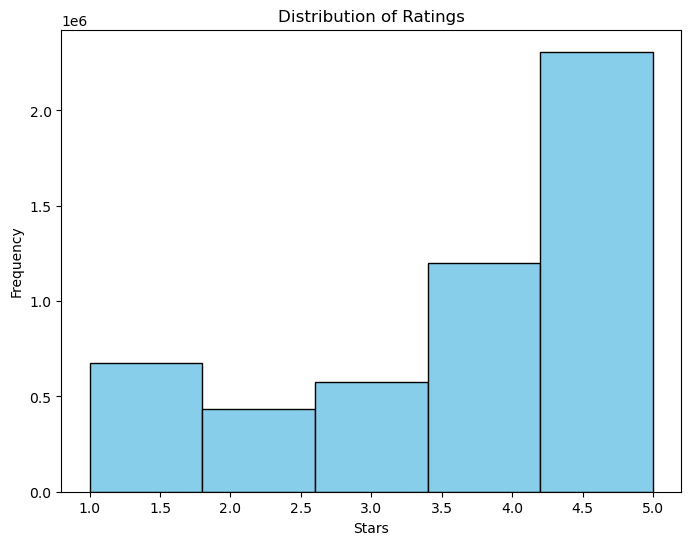

In [ ]:
# Plot histogram of 'stars_x'
plt.figure(figsize=(8,6))
plt.hist(merged_df_filtered_same_stars['stars_x'],bins=5,color='skyblue',edgecolor='black')
plt.xlabel('Stars')
plt.ylabel('Frequency')
plt.title('Distribution of Ratings')
plt.show()

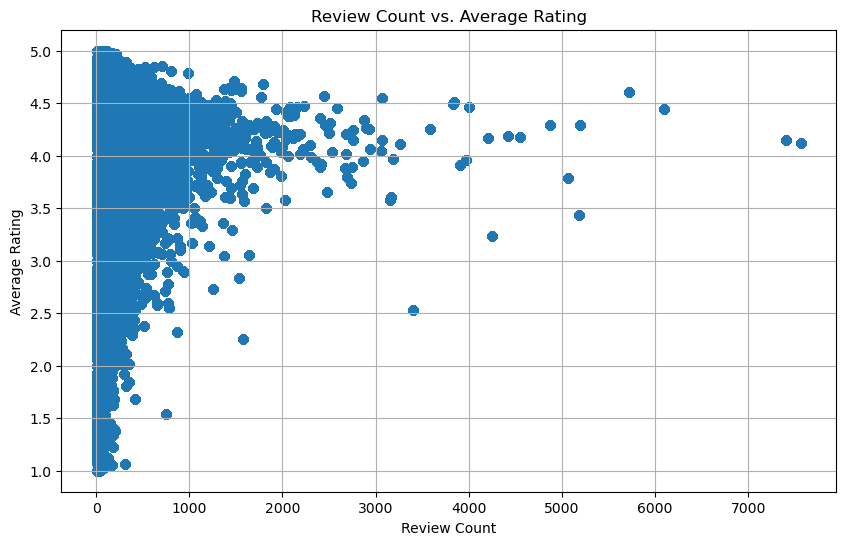

In [ ]:
# Calculate average rating for each business
merged_df_filtered_same_stars['avg_rating']=merged_df_filtered_same_stars.groupby('business_id')['stars_x'].transform('mean')

# Create scatter plot
plt.figure(figsize=(10,6))
plt.scatter(merged_df_filtered_same_stars['review_count'],merged_df_filtered_same_stars['avg_rating'],alpha=0.5)
plt.xlabel('Review Count')
plt.ylabel('Average Rating')
plt.title('Review Count vs. Average Rating')
plt.grid(True)
plt.show()

In [ ]:
# Combine all categories into a single string
all_categories=','.join(merged_df_filtered_same_stars['categories'])

# Split the combined string by comma and strip whitespace
all_categories_list=[category.strip() for category in all_categories.split(',')]

# Count occurrences of each category
category_counts=Counter(all_categories_list)

# Convert the Counter to a dictionary and sort by count in descending order
category_counts_sorted=dict(sorted(category_counts.items(),key=lambda x: x[1],reverse=True))

# Print the top N most popular categories
top_n=10  # Change this number to get more or fewer top categories
print(f"Top {top_n} Most Popular Categories:")
for category,count in list(category_counts_sorted.items())[:top_n]:
    print(f"{category}: {count} businesses")

Top 10 Most Popular Categories:
Restaurants: 4724471 businesses
Food: 1481999 businesses
Nightlife: 1382927 businesses
Bars: 1331598 businesses
American (Traditional): 1011646 businesses
American (New): 984540 businesses
Breakfast & Brunch: 867430 businesses
Sandwiches: 691864 businesses
Seafood: 620247 businesses
Shopping: 523254 businesses


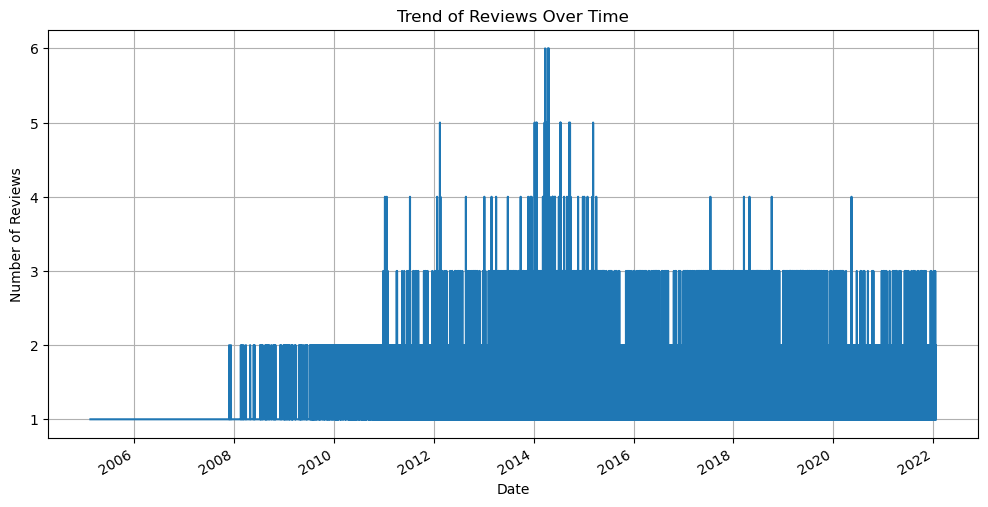

In [ ]:
# Convert 'date' column to datetime format
merged_df_filtered_same_stars['date']=pd.to_datetime(merged_df_filtered_same_stars['date'])

# Group by 'date' and count the number of reviews for each date
reviews_over_time=merged_df_filtered_same_stars.groupby('date').size()

# Plotting the trend of reviews over time
plt.figure(figsize=(12,6))
reviews_over_time.plot()
plt.xlabel('Date')
plt.ylabel('Number of Reviews')
plt.title('Trend of Reviews Over Time')
plt.grid(True)
plt.show()

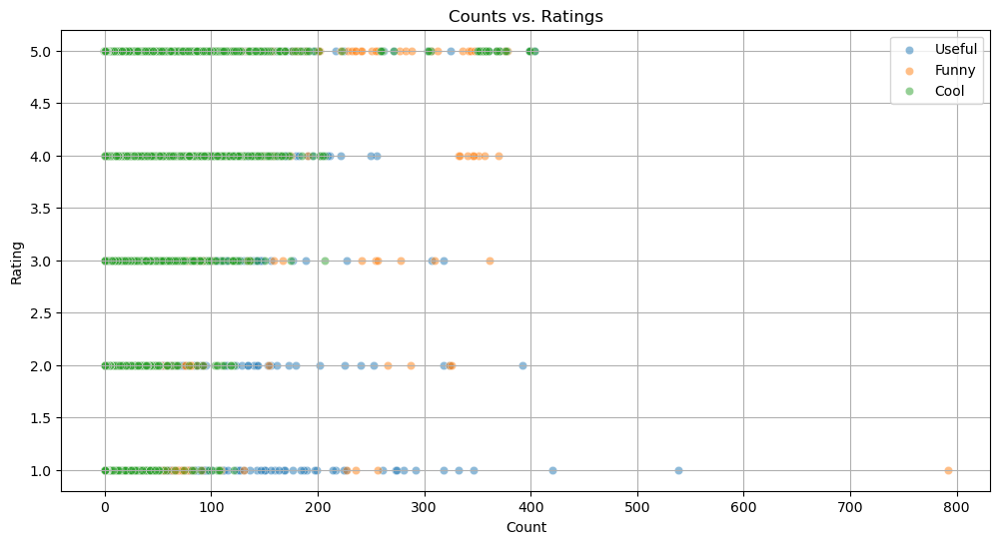

In [ ]:
# Create scatter plots
plt.figure(figsize=(12,6))
sns.scatterplot(data=merged_df_filtered_same_stars,x='useful',y='stars_x',alpha=0.5,label='Useful')
sns.scatterplot(data=merged_df_filtered_same_stars,x='funny',y='stars_x',alpha=0.5,label='Funny')
sns.scatterplot(data=merged_df_filtered_same_stars,x='cool',y='stars_x',alpha=0.5,label='Cool')

# Add labels and title
plt.xlabel('Count')
plt.ylabel('Rating')
plt.title('Counts vs. Ratings')
plt.legend()
plt.grid(True)
plt.show()

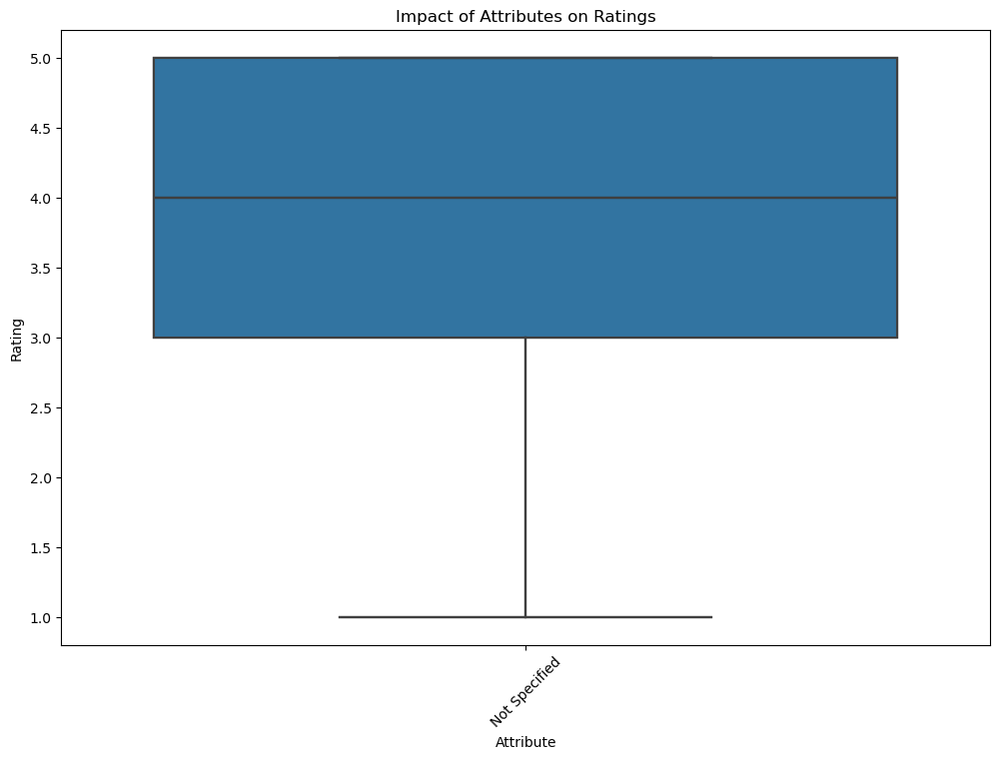

In [ ]:
# Define relevant attributes to extract
relevant_attributes=['RestaurantsPriceRange2','OutdoorSeating','Alcohol','WiFi','BusinessParking']

# Create new columns for each relevant attribute
for attribute in relevant_attributes:
    merged_df_filtered_same_stars[attribute]=merged_df_filtered_same_stars['attributes'].apply(
        lambda x: x.get(attribute) if isinstance(x,dict) else 'Not Specified'
    )

# Plot average rating for each relevant attribute
plt.figure(figsize=(12,8))
for attribute in relevant_attributes:
    sns.boxplot(x=attribute,y='stars_x',data=merged_df_filtered_same_stars.dropna(subset=[attribute]))
plt.xlabel('Attribute')
plt.ylabel('Rating')
plt.title('Impact of Attributes on Ratings')
plt.xticks(rotation=45)
plt.show()

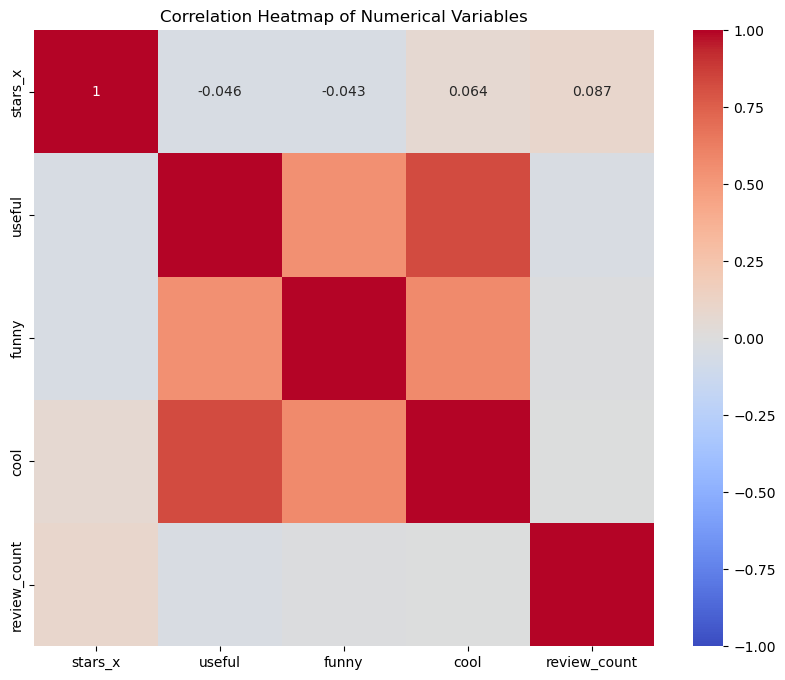

In [ ]:
# Select numerical columns for correlation analysis
numerical_cols=['stars_x','useful','funny','cool','review_count']

# Create a correlation matrix
correlation_matrix=merged_df_filtered_same_stars[numerical_cols].corr()

# Plot the heatmap
plt.figure(figsize=(10,8))
sns.heatmap(correlation_matrix,annot=True,cmap='coolwarm',vmin=-1,vmax=1)
plt.title('Correlation Heatmap of Numerical Variables')
plt.show()

In [ ]:
merged_tip_df=tip_df.merge(res_or_shop_df,on='business_id',how='left')
merged_tip_df.head()

,user_id,business_id,text,date,compliment_count,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,AGNUgVwnZUey3gcPCJ76iw,3uLgwr0qeCNMjKenHJwPGQ,Avengers time with the ladies.,2012-05-18 02:17:21,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NBN4MgHP9D3cw--SnauTkA,QoezRbYQncpRqyrLH6Iqjg,They have lots of good deserts and tasty cuban...,2013-02-05 18:35:10,0,La Segunda Central Bakery,2512 N 15th St,Tampa,FL,33605,27.965865,-82.443197,4.5,339.0,1.0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Bakeries, Restaurants, Coffee & Tea, Food, Cuban","{'Monday': '0:0-0:0', 'Tuesday': '6:30-15:0', ..."
2,-copOvldyKh1qr-vzkDEvw,MYoRNLb5chwjQe3c_k37Gg,It's open even when you think it isn't,2013-08-18 00:56:08,0,Sean Thorntons Public House,2401 E Allegheny Ave,Philadelphia,PA,19134,39.988107,-75.105553,3.5,6.0,1.0,"{'OutdoorSeating': 'False', 'RestaurantsReserv...","Food, Nightlife, Restaurants, Irish Pub, Bars,...","{'Monday': '7:0-2:0', 'Tuesday': '7:0-2:0', 'W..."
3,FjMQVZjSqY8syIO-53KFKw,hV-bABTK-glh5wj31ps_Jw,Very decent fried chicken,2017-06-27 23:05:38,0,Wok Out Restaurant,"1444 S Belcher Rd, Ste B",Clearwater,FL,33764,27.943694,-82.746285,3.5,59.0,1.0,"{'RestaurantsDelivery': 'True', 'RestaurantsPr...","Chinese, Restaurants","{'Monday': '11:0-23:0', 'Tuesday': '11:0-23:0'..."
4,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Appetizers.. platter special for lunch,2012-10-06 19:43:09,0,Siam Cuisine,265 White Bridge Pike,Nashville,TN,37209,36.143308,-86.858303,4.0,153.0,1.0,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Restaurants, Thai","{'Monday': '0:0-0:0', 'Tuesday': '16:30-21:0',..."


In [ ]:
merged_tip_df.shape

(908915, 18)

In [ ]:
# Filter merged_df to remove rows with missing values in specified columns
merged_tip_df_filtered=merged_tip_df.dropna(how='any')
merged_tip_df_filtered.shape

(671499, 18)

In [ ]:
# Rename 'text_x' column to 'text_review'
merged_df_filtered_same_stars=merged_df_filtered_same_stars.rename(columns={'text': 'text_review'})
merged_tip_df_filtered=merged_tip_df_filtered.rename(columns={'text': 'text_tip'})

In [ ]:
print('merged_df_filtered_same_stars.columns:',merged_df_filtered_same_stars.columns)
print('merged_tip_df_filtered.columns:',merged_tip_df_filtered.columns)

merged_df_filtered_same_stars.columns: Index(['review_id', 'user_id', 'business_id', 'stars_x', 'useful', 'funny',
       'cool', 'text_review', 'date', 'name', 'address', 'city', 'state',
       'postal_code', 'latitude', 'longitude', 'review_count', 'is_open',
       'attributes', 'categories', 'hours', 'avg_rating',
       'RestaurantsPriceRange2', 'OutdoorSeating', 'Alcohol', 'WiFi',
       'BusinessParking'],
      dtype='object')
merged_tip_df_filtered.columns: Index(['user_id', 'business_id', 'text_tip', 'date', 'compliment_count',
       'name', 'address', 'city', 'state', 'postal_code', 'latitude',
       'longitude', 'stars', 'review_count', 'is_open', 'attributes',
       'categories', 'hours'],
      dtype='object')


In [ ]:
# Merge reviews_df and tip_df on 'business_id' and 'user_id'
merged_review_tip_df=pd.merge(merged_tip_df_filtered,merged_df_filtered_same_stars,on=['business_id','user_id'],how='inner')
merged_review_tip_df.shape

(324393, 43)

In [ ]:
merged_review_tip_df.columns

Index(['user_id', 'business_id', 'text_tip', 'date_x', 'compliment_count',
       'name_x', 'address_x', 'city_x', 'state_x', 'postal_code_x',
       'latitude_x', 'longitude_x', 'stars', 'review_count_x', 'is_open_x',
       'attributes_x', 'categories_x', 'hours_x', 'review_id', 'stars_x',
       'useful', 'funny', 'cool', 'text_review', 'date_y', 'name_y',
       'address_y', 'city_y', 'state_y', 'postal_code_y', 'latitude_y',
       'longitude_y', 'review_count_y', 'is_open_y', 'attributes_y',
       'categories_y', 'hours_y', 'avg_rating', 'RestaurantsPriceRange2',
       'OutdoorSeating', 'Alcohol', 'WiFi', 'BusinessParking'],
      dtype='object')

In [ ]:
merged_reviews_tip_df.head()

,user_id,business_id,text_x,date_x,compliment_count,name_x,address_x,city_x,state_x,postal_code_x,...,is_open_y,attributes_y,categories_y,hours_y,avg_rating,RestaurantsPriceRange2,OutdoorSeating,Alcohol,WiFi,BusinessParking
0,FjMQVZjSqY8syIO-53KFKw,hV-bABTK-glh5wj31ps_Jw,Very decent fried chicken,2017-06-27 23:05:38,0,Wok Out Restaurant,"1444 S Belcher Rd, Ste B",Clearwater,FL,33764,...,1.0,"{'RestaurantsDelivery': 'True', 'RestaurantsPr...","Chinese, Restaurants","{'Monday': '11:0-23:0', 'Tuesday': '11:0-23:0'...",3.305085,Not Specified,Not Specified,Not Specified,Not Specified,Not Specified
1,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Appetizers.. platter special for lunch,2012-10-06 19:43:09,0,Siam Cuisine,265 White Bridge Pike,Nashville,TN,37209,...,1.0,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Restaurants, Thai","{'Monday': '0:0-0:0', 'Tuesday': '16:30-21:0',...",3.841772,Not Specified,Not Specified,Not Specified,Not Specified,Not Specified
2,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Appetizers.. platter special for lunch,2012-10-06 19:43:09,0,Siam Cuisine,265 White Bridge Pike,Nashville,TN,37209,...,1.0,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Restaurants, Thai","{'Monday': '0:0-0:0', 'Tuesday': '16:30-21:0',...",3.841772,Not Specified,Not Specified,Not Specified,Not Specified,Not Specified
3,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Saturday lunch,2012-11-17 19:49:29,0,Siam Cuisine,265 White Bridge Pike,Nashville,TN,37209,...,1.0,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Restaurants, Thai","{'Monday': '0:0-0:0', 'Tuesday': '16:30-21:0',...",3.841772,Not Specified,Not Specified,Not Specified,Not Specified,Not Specified
4,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Saturday lunch,2012-11-17 19:49:29,0,Siam Cuisine,265 White Bridge Pike,Nashville,TN,37209,...,1.0,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Restaurants, Thai","{'Monday': '0:0-0:0', 'Tuesday': '16:30-21:0',...",3.841772,Not Specified,Not Specified,Not Specified,Not Specified,Not Specified


In [ ]:
# Create a boolean mask where 'city_x' equals 'city_y'
same_city_mask=merged_review_tip_df['city_x']==merged_review_tip_df['city_y']

# Count the number of True values in the mask
num_same_city=same_city_mask.sum()

# Print the number of rows where 'city_x' has the same values as 'city_y'
print("Number of rows where 'city_x' is the same as 'city_y':",num_same_city)

Number of rows where 'city_x' is the same as 'city_y': 324393


In [ ]:
# List of columns to remove
columns_to_remove=['name_y','address_y','city_y','state_y','postal_code_y',
                     'latitude_y','longitude_y','review_count_y','is_open_y',
                     'attributes_y','categories_y','hours_y']

# Drop the specified columns
merged_review_tip_df=merged_review_tip_df.drop(columns=columns_to_remove)

# Print the columns of the DataFrame after dropping
print("Columns after dropping duplicate columns:")
print(merged_review_tip_df.columns)

Columns after dropping duplicate columns:
Index(['user_id', 'business_id', 'text_tip', 'date_x', 'compliment_count',
       'name_x', 'address_x', 'city_x', 'state_x', 'postal_code_x',
       'latitude_x', 'longitude_x', 'stars', 'review_count_x', 'is_open_x',
       'attributes_x', 'categories_x', 'hours_x', 'review_id', 'stars_x',
       'useful', 'funny', 'cool', 'text_review', 'date_y', 'avg_rating',
       'RestaurantsPriceRange2', 'OutdoorSeating', 'Alcohol', 'WiFi',
       'BusinessParking'],
      dtype='object')


In [ ]:
# Remove duplicate rows
#merged_review_tip_df_unique=merged_review_tip_df.drop_duplicates()

# Print the shape of the DataFrame before and after removing duplicates
#print("Shape before removing duplicates:",merged_review_tip_df.shape)
#print("Shape after removing duplicates:",merged_review_tip_df_unique.shape)

# Optional: Print the first few rows of the DataFrame for verification
merged_review_tip_df_unique.head()

,user_id,business_id,text_tip,date_x,compliment_count,name_x,address_x,city_x,state_x,postal_code_x,...,funny,cool,text_review,date_y,avg_rating,RestaurantsPriceRange2,OutdoorSeating,Alcohol,WiFi,BusinessParking
0,FjMQVZjSqY8syIO-53KFKw,hV-bABTK-glh5wj31ps_Jw,Very decent fried chicken,2017-06-27 23:05:38,0,Wok Out Restaurant,"1444 S Belcher Rd, Ste B",Clearwater,FL,33764,...,1,0,Do not get the schezuan chicken. 1) it's not b...,2018-05-08 01:31:54,3.305085,Not Specified,Not Specified,Not Specified,Not Specified,Not Specified
1,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Appetizers.. platter special for lunch,2012-10-06 19:43:09,0,Siam Cuisine,265 White Bridge Pike,Nashville,TN,37209,...,0,0,"So sad.....the menu is the same, but the taste...",2015-09-26 21:28:21,3.841772,Not Specified,Not Specified,Not Specified,Not Specified,Not Specified
2,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Appetizers.. platter special for lunch,2012-10-06 19:43:09,0,Siam Cuisine,265 White Bridge Pike,Nashville,TN,37209,...,0,0,Yummie...best thai food in the west side of Na...,2013-11-16 13:28:55,3.841772,Not Specified,Not Specified,Not Specified,Not Specified,Not Specified
3,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Saturday lunch,2012-11-17 19:49:29,0,Siam Cuisine,265 White Bridge Pike,Nashville,TN,37209,...,0,0,"So sad.....the menu is the same, but the taste...",2015-09-26 21:28:21,3.841772,Not Specified,Not Specified,Not Specified,Not Specified,Not Specified
4,ld0AperBXk1h6UbqmM80zw,_uN0OudeJ3Zl_tf6nxg5ww,Saturday lunch,2012-11-17 19:49:29,0,Siam Cuisine,265 White Bridge Pike,Nashville,TN,37209,...,0,0,Yummie...best thai food in the west side of Na...,2013-11-16 13:28:55,3.841772,Not Specified,Not Specified,Not Specified,Not Specified,Not Specified


In [ ]:
merged_reviews_tip_df['text_y'].tail(20)

324373    Love Hobby Lobby.\nI like the way they gave th...
324374    This place is great! \nFantastic service \nBes...
324375    While the food was good, our experience was in...
324376    I don't know what has happened to customer ser...
324377    I don't know what has happened to customer ser...
324378    They added a charitable charge to my bill with...
324379    The restaurant staff were openly discriminatin...
324380    East nasty was tasty! A bit of a line but well...
324381    Yummy!! Hush puppies and fish taste delicious ...
324382    For dessert the caramelized peaches with ginge...
324383    Awesome place great\nDrinks friendly staff and...
324384    The wife and I eat here at least once a week. ...
324385    Went for brunch on Sunday at around 12:30 pm b...
324386    It was my first time here, but it felt terribl...
324387    I love the pizza but the lady working there is...
324388    Ordered two breakfast sandwiches, was told to ...
324389    Way too slow I went to order f

In [ ]:
# Remove duplicate rows based on all columns
merged_reviews_tip_unique_df=merged_reviews_tip_df.drop_duplicates()
merged_reviews_tip_unique_df.shape

(324376, 43)

In [ ]:
# Remove duplicate rows based on 'text_x' and 'text_y'
merged_reviews_tip_unique_no_duplicates_df=merged_reviews_tip_unique_df.drop_duplicates(subset=['text_x','text_y'])
merged_reviews_tip_unique_no_duplicates_df.shape

(321572, 43)

In [ ]:
merged_reviews_tip_unique_no_duplicates_df.head(20)

(321572, 43)

In [ ]:
# Remove duplicates for 'text_x' in the original DataFrame
merged_reviews_tip_unique_no_duplicates_df=merged_reviews_tip_unique_df.drop_duplicates(subset=['text_x'],inplace=True)

In [ ]:
merged_reviews_tip_unique_df['name_x'].value_counts()

name_x
McDonald's                          994
Starbucks                           679
Chick-fil-A                         577
Chipotle Mexican Grill              539
Panera Bread                        487
                                   ... 
Smoked                                1
Pats Select Pizza|Grill               1
Dan Shing Restaurant                  1
Tres Bonne Cuisine                    1
Puff'n Panda Vape and Smoke Shop      1
Name: count, Length: 29951, dtype: int64

In [ ]:
# Convert 'text_x' column to string to ensure consistency
merged_reviews_tip_unique_df['text_x']=merged_reviews_tip_unique_df['text_x'].astype(str)
merged_reviews_tip_unique_df['text_y']=merged_reviews_tip_unique_df['text_y'].astype(str)

In [ ]:
merged_reviews_tip_unique_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 261243 entries, 0 to 324392
Data columns (total 43 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   user_id                 261243 non-null  object        
 1   business_id             261243 non-null  object        
 2   text_x                  261243 non-null  object        
 3   date_x                  261243 non-null  object        
 4   compliment_count        261243 non-null  int64         
 5   name_x                  261243 non-null  object        
 6   address_x               261243 non-null  object        
 7   city_x                  261243 non-null  object        
 8   state_x                 261243 non-null  object        
 9   postal_code_x           261243 non-null  object        
 10  latitude_x              261243 non-null  float64       
 11  longitude_x             261243 non-null  float64       
 12  stars                   261243 non-

In [ ]:
# Get unique 'business_id' values from res_or_shop_df
unique_business_ids=res_or_shop_df['business_id'].unique()

In [ ]:
# Filter review_df by 'business_id'
filtered_review_df=review_df[review_df['business_id'].isin(unique_business_ids)]

# Filter tip_df by 'business_id'
filtered_tip_df=tip_df[tip_df['business_id'].isin(unique_business_ids)]

# Print the shapes of the filtered DataFrames for verification
print("Shape of filtered_review_df:",filtered_review_df.shape)
print("Shape of filtered_tip_df:",filtered_tip_df.shape)

Shape of filtered_review_df: (5187832, 9)
Shape of filtered_tip_df: (704860, 5)


In [ ]:
# Count the number of duplicated business IDs in filtered_review_df
num_repeated_business_ids_review=filtered_review_df['business_id'].duplicated().sum()

# Print the number of repeated business IDs in filtered_review_df
print("Number of business IDs repeated in filtered_review_df:",num_repeated_business_ids_review)

Number of business IDs repeated in filtered_review_df: 5111773


In [ ]:
# Count the number of duplicated business IDs in filtered_tip_df
num_repeated_business_ids_tip=filtered_tip_df['business_id'].duplicated().sum()

# Print the number of repeated business IDs in filtered_tip_df
print("Number of business IDs repeated in filtered_tip_df:",num_repeated_business_ids_tip)

Number of business IDs repeated in filtered_tip_df: 642817


In [ ]:
filtered_tip_df.tail(20)

,user_id,business_id,text,date,compliment_count
908892,9vlIcDf2c9VDi9SNBn8sSg,fCDMLD21ypv1XZ_EyafCkQ,Only gets better with each visit!,2021-03-20 15:29:55,0
908893,MOvrmSLrBZ_K6RizhjR_tw,YOmh25YRJSDuGqt7zjEHEA,Fantastic LOCAL restaurant!,2021-10-03 02:36:39,0
908894,XzSv1QBzZNWmlq7mz_nEQA,zXTO8GaLmRPATr505b4GQQ,Food was outstanding. Great place off the beat...,2021-11-16 15:16:59,0
908895,nDewWzujmhNopzRixFTXGA,B6Cn6maWQ6sLhLwYGLhSlg,"Food is good, service is comically slow",2021-11-20 17:51:44,0
908897,lJ8hLfoNTrV6c57n6Qk50A,m7t75KdwXR9GAyvRvppk0Q,Way too slow,2022-01-08 13:59:31,0
908898,he-2lO3-bv9IhZw4ugKujQ,_OMGZ3TXOfN2By7skat_bw,Jarrod is Awesome. He tickles me! Dinner is great,2016-07-26 00:45:36,0
908899,26vY86pANxBSbyHZUoTAew,AV3XPH1iv8PKSO6mrnYgLg,Love this place! Went a few months back. The d...,2020-08-19 15:02:57,0
908900,dG6QQqrL87hhMq5kt0gf5w,pRF-yUpOG2YbzA767CLqQQ,Excellent great food I'll be back,2020-09-01 01:57:23,0
908901,YWRaVO8fD4UP-0uZVO5Zgw,FHDuu5Mv1bEkusxEuhptZQ,Great Deli spot -after the beach! the chips an...,2020-10-03 18:54:42,0
908902,JmAt2rNO5rNWbfnWzKI8XA,WO-ofNAvSuJpdRt9Auon6w,"Amazing , flavorful food! The Superdome is a m...",2018-03-31 16:25:35,0


In [ ]:
res_or_shop_df['name'].value_counts()

name
McDonald's                        703
Subway                            459
Taco Bell                         365
CVS Pharmacy                      344
Walgreens                         341
                                 ... 
Neighborhood Books                  1
Michael's Diner Restaurant          1
Eye Site                            1
Granadino's Italian Restaurant      1
Cyclery & Fitness Center            1
Name: count, Length: 52902, dtype: int64

In [ ]:
# Filter business_df by 'name' equals 'Jersey Mike's Subs' or 'Subway'
filtered_business_df=business_df.loc[(business_df['name']=="Jersey Mike's Subs") | (business_df['name']=='Subway')]
filtered_business_df.shape

(551, 14)

In [ ]:
filtered_business_df['state'].value_counts()

state
FL    112
TN     65
IN     65
AZ     58
PA     53
MO     51
LA     42
NV     30
IL     16
AB     15
ID     15
CA     14
NJ     12
DE      3
Name: count, dtype: int64

In [ ]:
# Get unique 'business_id' values from filtered_business_df_idaho
unique_business_ids=filtered_business_df['business_id'].unique()

In [ ]:
# Filter review_df by 'business_id' present in filtered_business_df_idaho
filtered_review_df=review_df[review_df['business_id'].isin(unique_business_ids)]
filtered_review_df.shape

(7320, 9)

In [ ]:
# Filter review_df by 'business_id' present in filtered_business_df_idaho
filtered_tip_df=tip_df[tip_df['business_id'].isin(unique_business_ids)]
filtered_tip_df.shape

(1272, 5)

In [ ]:
# Further filter filtered_business_df by 'state' equals 'ID'
filtered_business_df_idaho=filtered_business_df[filtered_business_df['state']=='ID']
filtered_business_df_idaho.shape

(15, 14)

In [ ]:
# Get unique 'business_id' values from filtered_business_df_idaho
unique_business_ids_idaho=filtered_business_df_idaho['business_id'].unique()

# Filter review_df by 'business_id' present in filtered_business_df_idaho
filtered_review_df_idaho=review_df[review_df['business_id'].isin(unique_business_ids_idaho)]
filtered_review_df_idaho.shape

(213, 9)

In [ ]:
# Filter tip_df by 'business_id' present in filtered_business_df_idaho
filtered_tip_df_idaho=tip_df[tip_df['business_id'].isin(unique_business_ids_idaho)]
filtered_tip_df_idaho.shape

(24, 5)

In [ ]:
# Get unique 'user_id' values from filtered_review_df_idaho
unique_user_ids_idaho=filtered_review_df_idaho['user_id'].unique()

# Filter user_df by 'user_id' present in filtered_review_df_idaho
filtered_user_df_idaho=user_df[user_df['user_id'].isin(unique_user_ids_idaho)]
filtered_user_df_idaho.shape

(192, 22)

In [ ]:
unique_business_ids_pizza=state_pizza_df['business_id'].unique()

In [ ]:
filtered_review_df_pizza=review_df[review_df['business_id'].isin(unique_business_ids_pizza)]
filtered_review_df_pizza.shape

(107024, 9)

In [ ]:
filtered_review_df_pizza.to_csv('filtered_review_df_pizza.csv',index=False)

In [ ]:
filtered_tip_df_pizza=tip_df[tip_df['business_id'].isin(unique_business_ids_pizza)]
filtered_tip_df_pizza.shape

(14240, 5)

In [ ]:
filtered_tip_df_pizza.to_csv('filtered_tip_df_pizza.csv',index=False)

In [ ]:
unique_user_ids_pizza=filtered_review_df_pizza['user_id'].unique()

In [ ]:
filtered_user_df_pizza=user_df[user_df['user_id'].isin(unique_user_ids_pizza)]
filtered_user_df_pizza.shape

(75846, 22)

In [ ]:
filtered_user_df_pizza.to_csv('filtered_user_df_pizza.csv',index=False)

In [ ]:
filtered_checkin_df_pizza=checkin_df[checkin_df['business_id'].isin(unique_business_ids_pizza)]
filtered_checkin_df_pizza.shape

(2094, 2)

In [ ]:
filtered_checkin_df_pizza.to_csv('filtered_checkin_df_pizza.csv',index=False)

In [ ]:
merged_bus_check_df_pizza=filtered_checkin_df_pizza.merge(state_pizza_df,on='business_id',how='left')
merged_bus_check_df_pizza.shape

(2094, 15)

In [ ]:
merged_bus_check_df_pizza.to_csv('merged_bus_check_df_pizza.csv',index=False)

In [ ]:
# Convert 'date' column to datetime format
filtered_review_df_pizza['date']=pd.to_datetime(filtered_review_df_pizza['date'])

# Extract year from 'date' and create 'year' column
filtered_review_df_pizza['year']=filtered_review_df_pizza['date'].dt.year

filtered_review_df_pizza[['date','year']].head()

,date,year
152,2012-03-30 20:57:29,2012
181,2016-03-07 03:19:29,2016
233,2012-03-01 02:28:24,2012
259,2016-04-23 08:13:00,2016
437,2012-10-08 22:39:38,2012


In [ ]:
# List of years to filter
years_to_filter=[2016,2017,2018,2019,2020,2021,2022]

# Filter filtered_review_df_pizza by 'year' in years_to_filter
filtered_review_df_pizza_years=filtered_review_df_pizza[filtered_review_df_pizza['year'].isin(years_to_filter)]
filtered_review_df_pizza_years.shape

(71534, 10)

In [ ]:
# Get unique 'business_id' values from filtered_review_df_pizza_years
unique_business_ids_pizza_years=filtered_review_df_pizza_years['business_id'].unique()

# Filter state_pizza_df by 'business_id' present in filtered_review_df_pizza_years
filtered_state_pizza_df=state_pizza_df[state_pizza_df['business_id'].isin(unique_business_ids_pizza_years)]
filtered_state_pizza_df.shape

(1997, 14)

In [ ]:
filtered_state_pizza_df.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
29,sqSqqLy0sN8n2IZrAbzidQ,Domino's Pizza,3001 Highway 31 W,White House,TN,37188,36.464747,-86.659187,3.5,8,1,{'RestaurantsPriceRange2': '1'},"Pizza, Chicken Wings, Sandwiches, Restaurants","{'Monday': '10:0-0:0', 'Tuesday': '10:0-0:0', ..."
33,kV_Q1oqis8Qli8dUoGpTyQ,Ardmore Pizza,10 Rittenhouse Pl,Ardmore,PA,19003,40.006707,-75.289671,3.5,109,1,"{'RestaurantsGoodForGroups': 'True', 'WiFi': ""...","Pizza, Restaurants","{'Monday': '11:0-0:0', 'Tuesday': '11:0-0:0', ..."
59,JgpnXv_0XhV3SfbfB50nxw,Joe's Pizza,2038 N Dale Mabry Hwy,Tampa,FL,33607,27.960514,-82.506127,4.0,35,0,"{'BusinessParking': ""{'garage': False, 'street...","Restaurants, Pizza","{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'..."
191,59jkCUm4yHciKL1KW_1HJA,Roma Pizza & Italian Eatery,1103 Main St,Warrington,PA,18976,40.229527,-75.131090,2.5,25,1,"{'BikeParking': 'False', 'RestaurantsGoodForGr...","Pizza, Restaurants","{'Monday': '10:0-22:0', 'Tuesday': '10:0-22:0'..."
392,EIlFs8kybcG-l60GJjNUIA,Domino's Pizza,"3800 Tampa Rd, Ste 180",Oldsmar,FL,34677,28.042004,-82.674612,2.5,20,1,"{'RestaurantsTakeOut': 'True', 'RestaurantsRes...","Pizza, Chicken Wings, Restaurants, Sandwiches","{'Monday': '10:30-0:0', 'Tuesday': '10:30-0:0'..."


In [ ]:
filtered_state_pizza_df['name'].value_counts().head(20)

name
Pizza Hut                      126
Domino's Pizza                 123
Papa John's Pizza               78
Hungry Howie's Pizza & Subs     43
Little Caesars Pizza            32
Marco's Pizza                   31
Jet's Pizza                     27
Westshore Pizza                 24
Roma Pizza & Pasta              10
Anthony's Coal Fired Pizza       9
MOD Pizza                        9
Little Caesar's Pizza            7
Bravo Pizza                      7
Pete's Pizza                     6
Blaze Pizza                      6
New York New York Pizza          5
Snap Custom Pizza                5
Chris's Pizza                    5
Joe's Pizza                      5
Palermo's Pizza                  5
Name: count, dtype: int64

In [ ]:
# Set up the figure and axes
plt.figure(figsize=(8,6))
sns.histplot(data=filtered_state_pizza_df,x='stars',bins=5,kde=False,color='skyblue',edgecolor='black')

# Customize the plot
plt.title('Distribution of Ratings (Stars)')
plt.xlabel('Stars')
plt.ylabel('Count')

# Show the plot
plt.show()

In [ ]:
# Set up the figure and axes
plt.figure(figsize=(8,6))
sns.kdeplot(data=filtered_state_pizza_df,x='stars',fill=True,color='skyblue',linewidth=2)

# Customize the plot
plt.title('Density Plot of Ratings (Stars)')
plt.xlabel('Stars')
plt.ylabel('Density')

# Show the plot
plt.show()

In [ ]:
# Calculate the average 'stars' for different 'review_count' ranges
avg_stars_by_review_count=filtered_state_pizza_df.groupby('review_count')['stars'].mean().reset_index()

# Set up the figure and axes
plt.figure(figsize=(10,6))

# Line plot
sns.lineplot(data=avg_stars_by_review_count,x='review_count',y='stars',color='skyblue',marker='o')

# Customize the plot
plt.title('Average Stars vs. Review Count')
plt.xlabel('Review Count')
plt.ylabel('Average Stars')

# Show the plot
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Create a map centered at an initial location
map_center=[filtered_state_pizza_df['latitude'].mean(),filtered_state_pizza_df['longitude'].mean()]
m=folium.Map(location=map_center,zoom_start=10)

# Marker Cluster for Business Locations
marker_cluster=MarkerCluster().add_to(m)

# Add markers for each business location
for idx,row in filtered_state_pizza_df.iterrows():
    # Create popup text with business name,stars,and review count
    popup_text=f"<b>{row['name']}</b><br>Stars: {row['stars']}<br>Review Count: {row['review_count']}"

    # Create marker with popup
    folium.Marker(
        location=[row['latitude'],row['longitude']],
        popup=popup_text,
        icon=folium.Icon(color='blue',icon='info-sign'),
    ).add_to(marker_cluster)

# Save the map to an HTML file
m.save('business_locations_map.html')

# Display the map
m

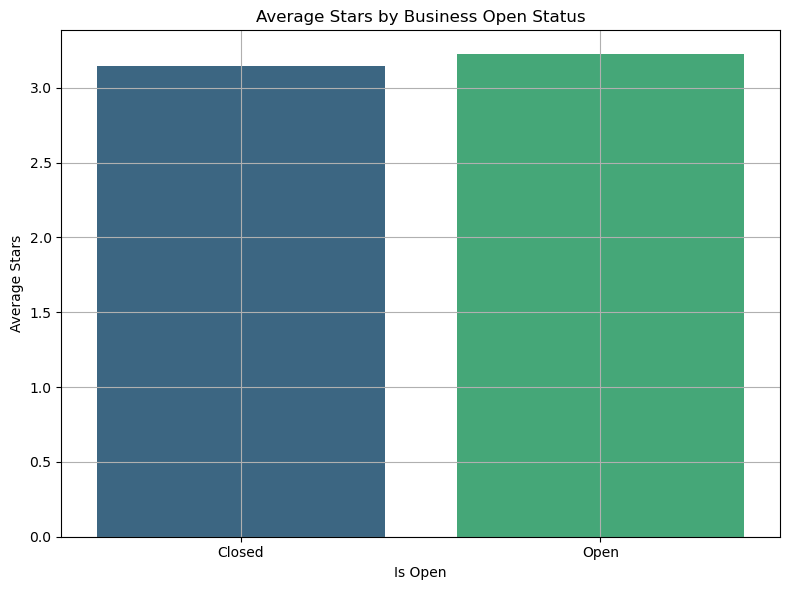

In [ ]:
# Calculate average stars for open and closed businesses
avg_stars_by_open_status=filtered_state_pizza_df.groupby('is_open')['stars'].mean().reset_index()

# Set up the figure and axes
plt.figure(figsize=(8,6))

# Bar plot
sns.barplot(x='is_open',y='stars',data=avg_stars_by_open_status,palette='viridis')

# Customize the plot
plt.title('Average Stars by Business Open Status')
plt.xlabel('Is Open')
plt.ylabel('Average Stars')
plt.xticks([0,1],['Closed','Open'])  # Label the x-axis ticks

# Show the plot
plt.grid(True)
plt.tight_layout()
plt.show()

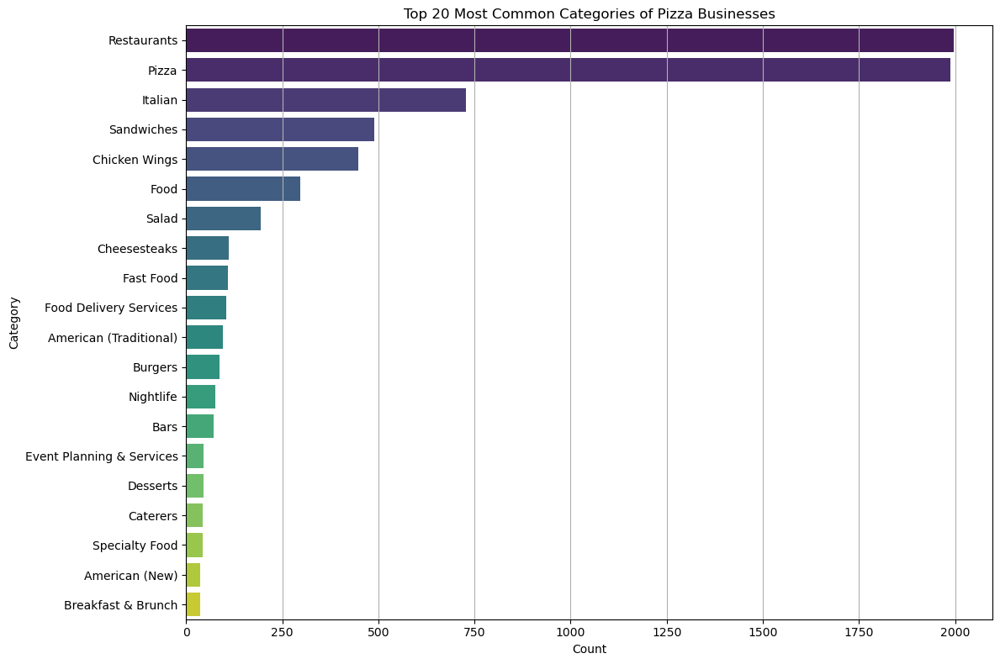

In [ ]:
# Split categories and create a DataFrame with counts
categories_split=filtered_state_pizza_df['categories'].str.split(',',expand=True)
categories_long=categories_split.melt(value_vars=range(categories_split.shape[1])).dropna()
categories_counts=categories_long['value'].value_counts().reset_index()

# Rename columns
categories_counts.columns=['category','count']

# Plot the count of businesses in each category
plt.figure(figsize=(12,8))
sns.barplot(x='count',y='category',data=categories_counts.head(20),palette='viridis')
plt.xlabel('Count')
plt.ylabel('Category')
plt.title('Top 20 Most Common Categories of Pizza Businesses')
plt.grid(axis='x')
plt.tight_layout()
plt.show()

In [ ]:
# Assuming 'attributes' column contains dictionaries
attributes_df=pd.json_normalize(filtered_state_pizza_df['attributes'])

# Add 'stars' column to attributes_df
attributes_df['stars']=filtered_state_pizza_df['stars']

In [ ]:
# Calculate correlation between attributes and stars
correlation=attributes_df.corr()['stars'].sort_values(ascending=False)

# Print correlation values
print("Correlation with 'stars':")
print(correlation)

Correlation with 'stars':
stars    1.0
Name: stars, dtype: float64


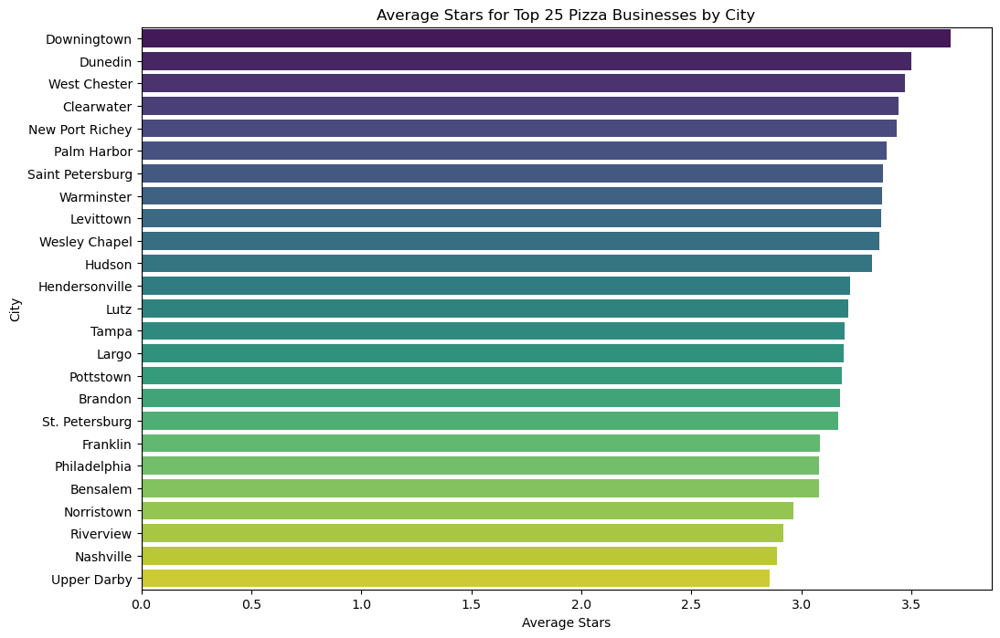

In [ ]:
# Calculate average stars by city
avg_stars_by_city=filtered_state_pizza_df.groupby('city')['stars'].mean().reset_index()

# Sort cities by number of businesses
city_counts=filtered_state_pizza_df['city'].value_counts().reset_index()
city_counts.columns=['city','count']
avg_stars_by_city=avg_stars_by_city.merge(city_counts,on='city')
avg_stars_by_city=avg_stars_by_city.sort_values(by='count',ascending=False)

# Select top 25 cities
top_25_cities=avg_stars_by_city.head(25)['city'].tolist()

# Filter dataframe for top 25 cities
avg_stars_top_25=avg_stars_by_city[avg_stars_by_city['city'].isin(top_25_cities)]

# Sort by average stars for better visualization
avg_stars_top_25=avg_stars_top_25.sort_values(by='stars',ascending=False)

# Plot bar plot
plt.figure(figsize=(12,8))
sns.barplot(x='stars',y='city',data=avg_stars_top_25,palette='viridis')
plt.xlabel('Average Stars')
plt.ylabel('City')
plt.title('Average Stars for Top 25 Pizza Businesses by City')
plt.show()

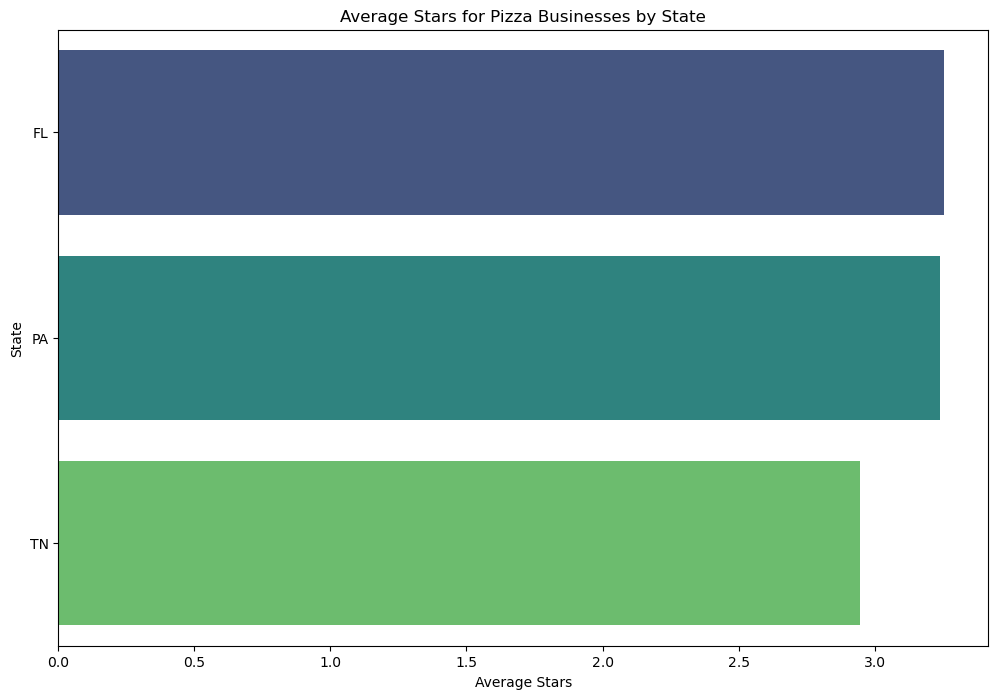

In [ ]:
# Calculate average stars by state
avg_stars_by_state=filtered_state_pizza_df.groupby('state')['stars'].mean().reset_index()

# Sort by average stars for better visualization
avg_stars_by_state=avg_stars_by_state.sort_values(by='stars',ascending=False)

# Plot bar plot
plt.figure(figsize=(12,8))
sns.barplot(x='stars',y='state',data=avg_stars_by_state,palette='viridis')
plt.xlabel('Average Stars')
plt.ylabel('State')
plt.title('Average Stars for Pizza Businesses by State')
plt.show()

In [ ]:
# Set up the figure and axes
plt.figure(figsize=(12,8))

# Plot KDE plot for ratings distribution by postal code
sns.kdeplot(data=filtered_state_pizza_df,x='stars',hue='postal_code',fill=True,palette='viridis',common_norm=False)
plt.xlabel('Stars')
plt.ylabel('Density')
plt.title('Ratings Distribution by Postal Code')
plt.legend(title='Postal Code',bbox_to_anchor=(1,1),loc='upper left')
plt.show()

In [ ]:
# Create a map centered around the average latitude and longitude
center_lat=filtered_state_pizza_df['latitude'].mean()
center_long=filtered_state_pizza_df['longitude'].mean()
m=folium.Map(location=[center_lat,center_long],zoom_start=10)

# Create a MarkerCluster object for clustering markers
marker_cluster=MarkerCluster().add_to(m)

# Function to determine color based on stars
def get_color(stars):
    if stars >=4.5:
        return 'green'
    elif stars >=3.0:
        return 'orange'
    else:
        return 'red'

# Add markers for each business
for idx,row in filtered_state_pizza_df.iterrows():
    folium.Marker(
        location=[row['latitude'],row['longitude']],
        popup=f"{row['name']} - {row['stars']}",
        icon=folium.Icon(color=get_color(row['stars']),icon='info-sign'),
    ).add_to(marker_cluster)

# Save the map to an HTML file
m.save('businesses_map.html')

# Display the map
m

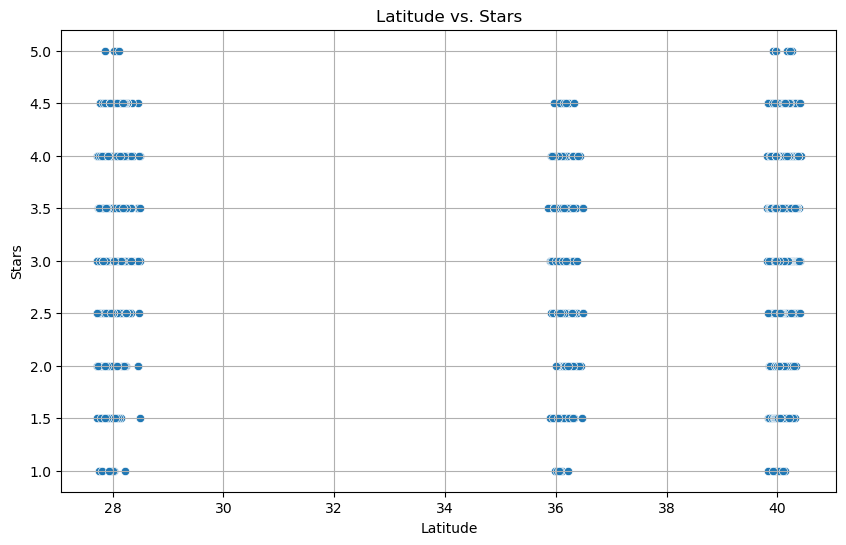

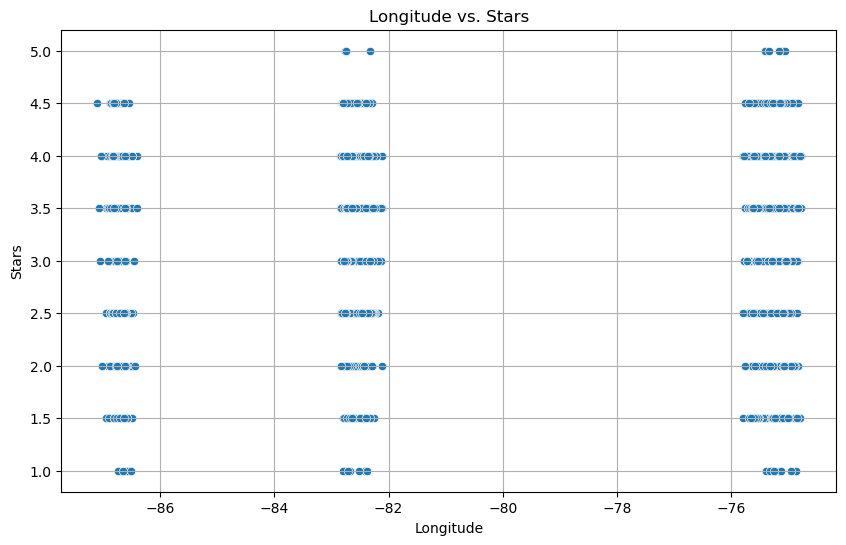

In [ ]:
# Scatter plot of latitude vs. stars
plt.figure(figsize=(10,6))
sns.scatterplot(x='latitude',y='stars',data=filtered_state_pizza_df)
plt.title('Latitude vs. Stars')
plt.xlabel('Latitude')
plt.ylabel('Stars')
plt.grid(True)
plt.show()

# Scatter plot of longitude vs. stars
plt.figure(figsize=(10,6))
sns.scatterplot(x='longitude',y='stars',data=filtered_state_pizza_df)
plt.title('Longitude vs. Stars')
plt.xlabel('Longitude')
plt.ylabel('Stars')
plt.grid(True)
plt.show()

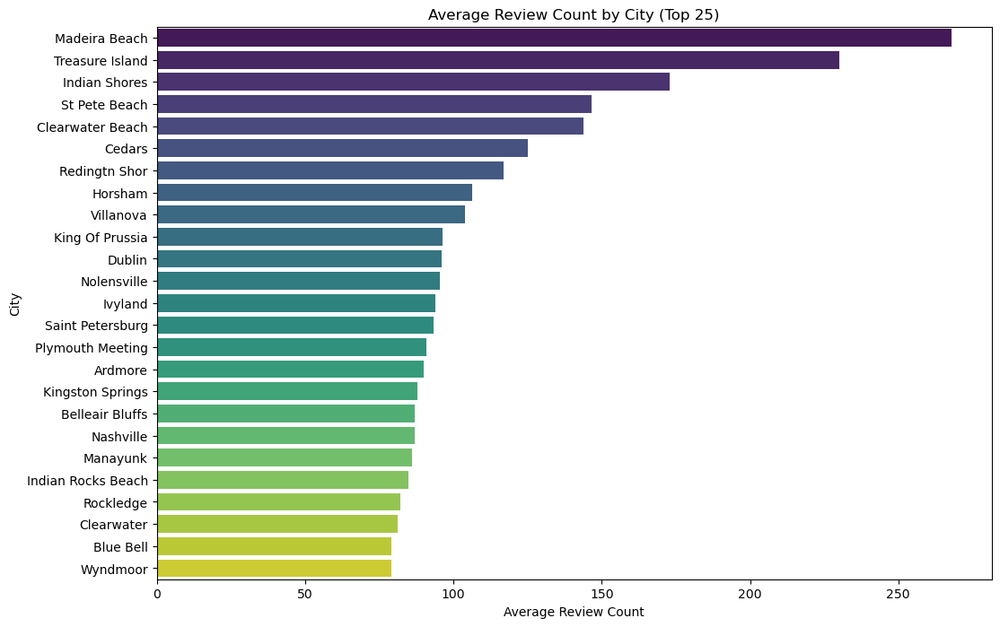

In [ ]:
# Calculate average review count by city
avg_review_count_by_city=filtered_state_pizza_df.groupby('city')['review_count'].mean().reset_index()

# Sort cities by average review count
avg_review_count_by_city=avg_review_count_by_city.sort_values(by='review_count',ascending=False)

# Plot the average review count by city
plt.figure(figsize=(12,8))
sns.barplot(x='review_count',y='city',data=avg_review_count_by_city.head(25),palette='viridis')
plt.xlabel('Average Review Count')
plt.ylabel('City')
plt.title('Average Review Count by City (Top 25)')
plt.show()

In [ ]:
# Calculate the number of pizza businesses per state
pizza_business_count_by_state=filtered_state_pizza_df['state'].value_counts().reset_index()
pizza_business_count_by_state.columns=['state','business_count']
pizza_business_count_by_state

,state,business_count
0,PA,1138
1,FL,601
2,TN,258


In [ ]:
# Calculate the population of each state (hypothetical numbers for demonstration)
state_population={
    'PA': 1567000,
    'FL': 22240000,
    'TN': 7051000,
    # Add more states and their populations as needed
}

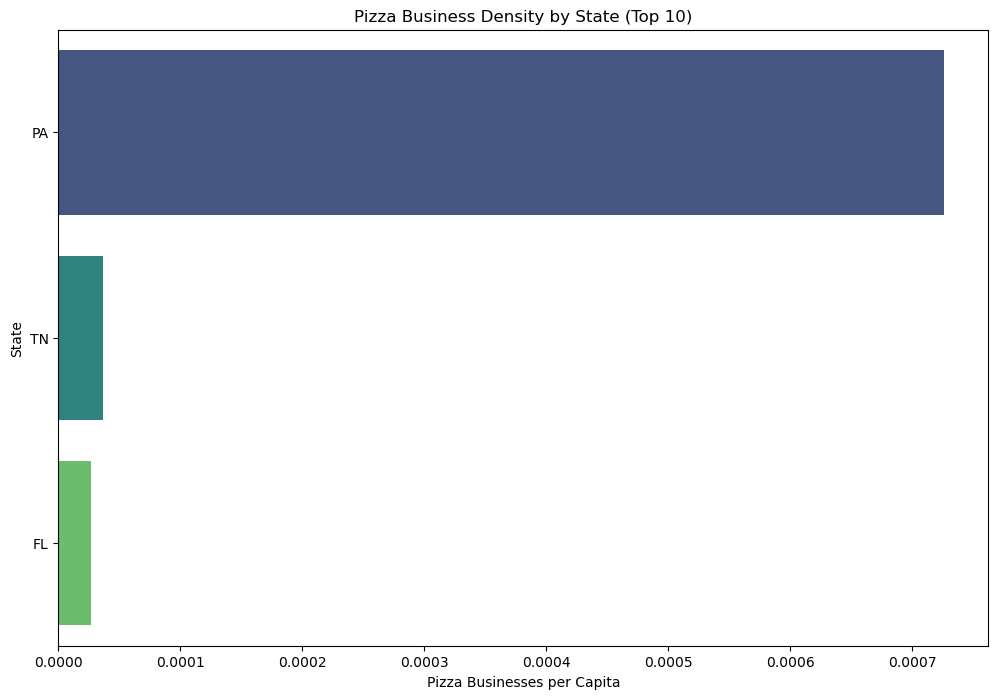

In [ ]:
# Add population data to the pizza business count dataframe
pizza_business_count_by_state['population']=pizza_business_count_by_state['state'].map(state_population)

# Calculate pizza businesses per capita
pizza_business_count_by_state['business_per_capita']=pizza_business_count_by_state['business_count'] / pizza_business_count_by_state['population']

# Sort by business per capita
pizza_business_count_by_state=pizza_business_count_by_state.sort_values(by='business_per_capita',ascending=False)

# Plot business density by state
plt.figure(figsize=(12,8))
sns.barplot(x='business_per_capita',y='state',data=pizza_business_count_by_state.head(10),palette='viridis')
plt.xlabel('Pizza Businesses per Capita')
plt.ylabel('State')
plt.title('Pizza Business Density by State (Top 10)')
plt.show()

In [ ]:
def haversine(lat1,lon1,lat2,lon2):
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees)
    """
    # Convert latitude and longitude from degrees to radians
    lat1,lon1,lat2,lon2=map(np.radians,[lat1,lon1,lat2,lon2])

    # Haversine formula
    dlat=lat2 - lat1
    dlon=lon2 - lon1
    a=np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c=2 * np.arcsin(np.sqrt(a))

    # Radius of earth in kilometers
    radius=6371.0

    # Calculate the distance
    distance=radius * c
    return distance

In [ ]:
# Create a copy of the DataFrame to avoid modifying the original
df_with_distances=filtered_state_pizza_df.copy()

# Initialize a new column for the nearest competitor distance
df_with_distances['nearest_competitor_distance']=np.nan

# Loop through each row and calculate the distance to the nearest competitor
for index,row in df_with_distances.iterrows():
    # Coordinates of the current business
    lat1,lon1=row['latitude'],row['longitude']

    # Calculate distance to all other businesses
    distances=df_with_distances.apply(
        lambda x: haversine(lat1,lon1,x['latitude'],x['longitude']),axis=1
    )

    # Exclude the current business
    distances=distances.drop(index)

    # Find the minimum distance (nearest competitor)
    min_distance=distances.min()

    # Assign the minimum distance to the 'nearest_competitor_distance' column
    df_with_distances.at[index,'nearest_competitor_distance']=min_distance

In [ ]:
# Calculate correlation coefficient between 'nearest_competitor_distance' and 'stars'
correlation=df_with_distances['nearest_competitor_distance'].corr(df_with_distances['stars'])

print("Correlation between Nearest Competitor Distance and Stars:",correlation)

Correlation between Nearest Competitor Distance and Stars: 0.06645413909730652


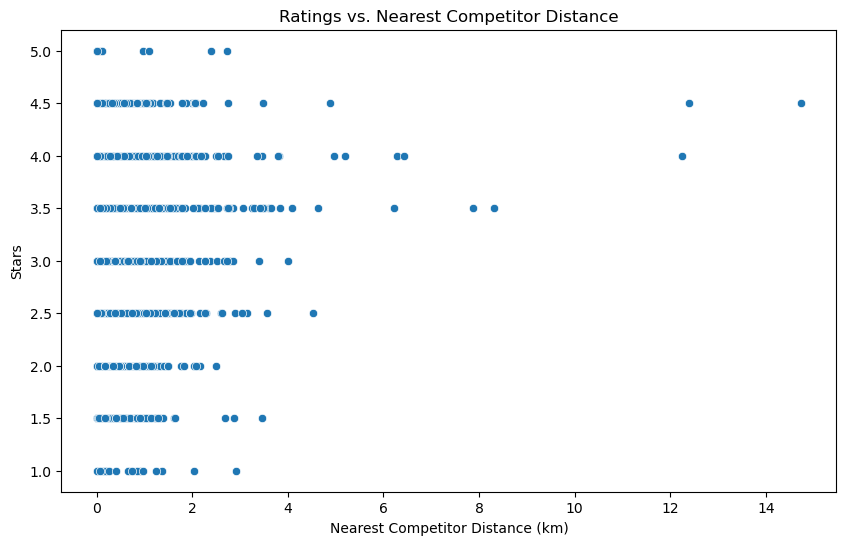

In [ ]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='nearest_competitor_distance',y='stars',data=df_with_distances)
plt.title("Ratings vs. Nearest Competitor Distance")
plt.xlabel("Nearest Competitor Distance (km)")
plt.ylabel("Stars")
plt.show()

In [ ]:
plt.figure(figsize=(10,6))
sns.histplot(df_with_distances['nearest_competitor_distance'],bins=20,kde=True)
plt.title("Distribution of Nearest Competitor Distances")
plt.xlabel("Nearest Competitor Distance (km)")
plt.ylabel("Frequency")
plt.show()

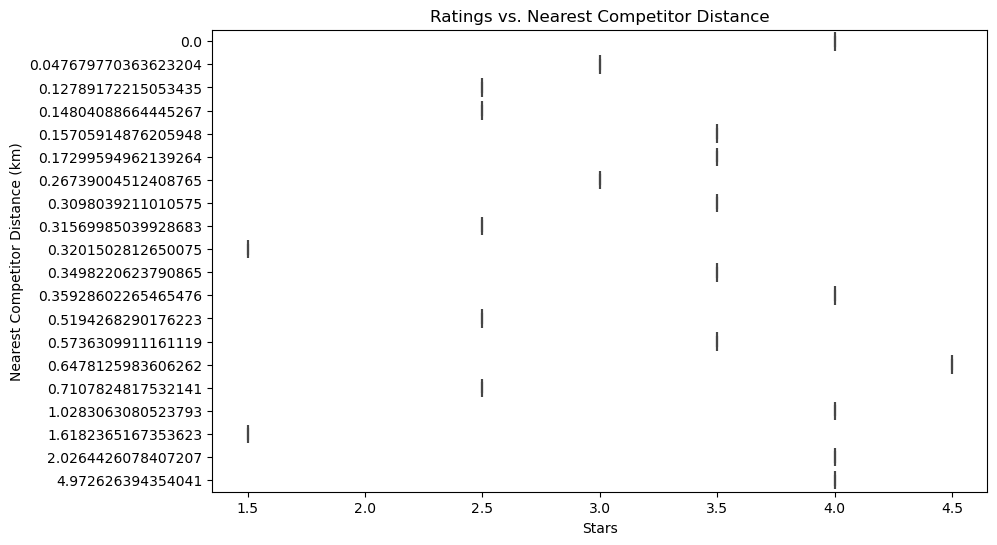

In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(x='stars',y='nearest_competitor_distance',data=df_with_distances.head(20),orient='h')
plt.title("Ratings vs. Nearest Competitor Distance")
plt.xlabel("Stars")
plt.ylabel("Nearest Competitor Distance (km)")
plt.show()

In [ ]:
# Define the population densities
pop_density_dict={
    'FL': 136.4, # Population density for Florida (per square kilometer)
    'PA': 112,   # Population density for Pennsylvania (per square kilometer)
    'TN': 65.9    # Population density for Tennessee (per square kilometer)
}

# Create the 'pop_density' column based on state
filtered_state_pizza_df['pop_density']=filtered_state_pizza_df['state'].map(pop_density_dict)

# Display the first few rows to verify
print(filtered_state_pizza_df[['state','pop_density']].head())

,state,pop_density
29,TN,65.9
33,PA,112.0
59,FL,136.4
191,PA,112.0
392,FL,136.4


In [ ]:
# Define functions to classify based on population density
def classify_location(row):
    if row['pop_density'] > 1000:
        return 'Urban'
    elif 100 <=row['pop_density'] <=1000:
        return 'Suburban'
    else:
        return 'Rural'

In [ ]:
# Classify businesses based on population density
filtered_state_pizza_df['location_setting']=filtered_state_pizza_df.apply(classify_location,axis=1)

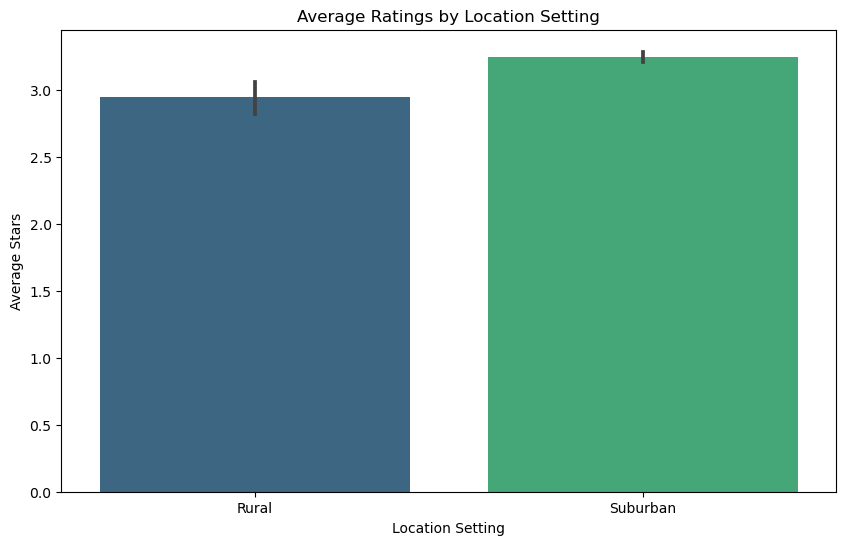

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(x='location_setting',y='stars',data=filtered_state_pizza_df,palette='viridis')
plt.title("Average Ratings by Location Setting")
plt.xlabel("Location Setting")
plt.ylabel("Average Stars")
plt.show()

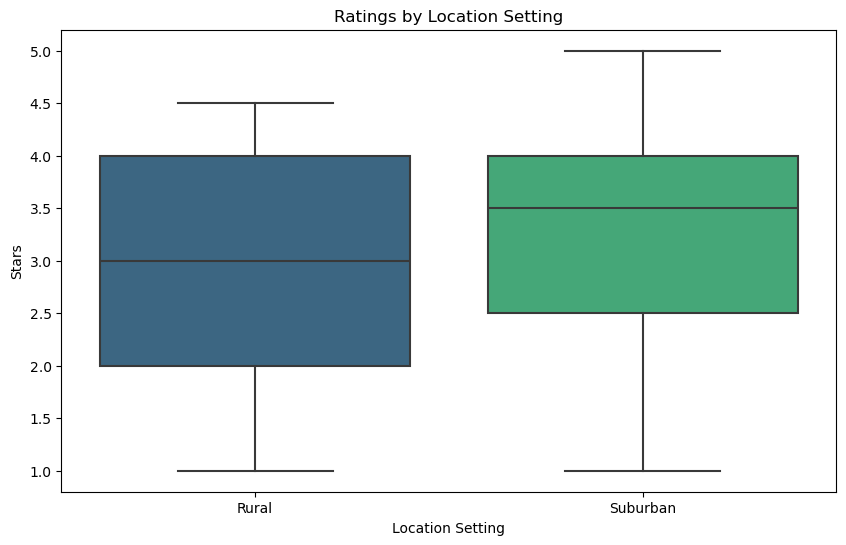

In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(x='location_setting',y='stars',data=filtered_state_pizza_df,palette='viridis')
plt.title("Ratings by Location Setting")
plt.xlabel("Location Setting")
plt.ylabel("Stars")
plt.show()

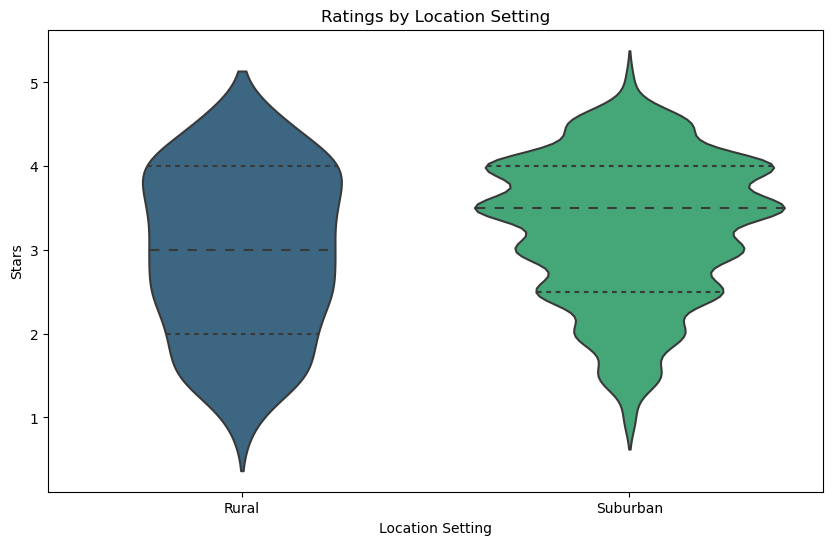

In [ ]:
plt.figure(figsize=(10,6))
sns.violinplot(x='location_setting',y='stars',data=filtered_state_pizza_df,palette='viridis',inner='quartile')
plt.title("Ratings by Location Setting")
plt.xlabel("Location Setting")
plt.ylabel("Stars")
plt.show()

In [ ]:
# Define the threshold for poorly rated businesses
threshold_rating=3.0

# Step 2: Filter poorly rated businesses
poorly_rated_df=filtered_state_pizza_df[filtered_state_pizza_df['stars'] < threshold_rating]

# Step 3: Analyze common factors for poorly rated brands
# For example,we can analyze the distribution of 'pop_density' for poorly rated brands
plt.figure(figsize=(10,6))
sns.histplot(poorly_rated_df['pop_density'],bins=20,kde=True,color='skyblue')
plt.title('Population Density Distribution for Poorly Rated Brands')
plt.xlabel('Population Density (per square kilometer)')
plt.ylabel('Count')
plt.show()

# We can also check the distribution of 'is_open' for poorly rated brands
plt.figure(figsize=(8,5))
sns.countplot(x='is_open',data=poorly_rated_df,palette='viridis')
plt.title('Count of Open and Closed Businesses among Poorly Rated Brands')
plt.xlabel('Is Open')
plt.ylabel('Count')
plt.show()

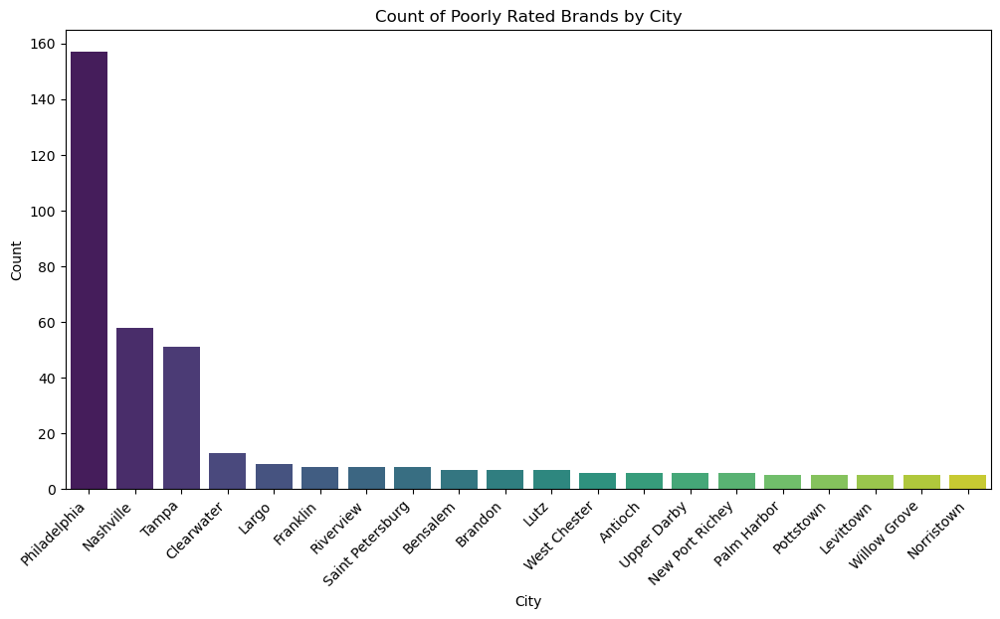

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(x='city',data=poorly_rated_df,order=poorly_rated_df['city'].value_counts().head(20).index,palette='viridis')
plt.xticks(rotation=45,ha='right')
plt.title('Count of Poorly Rated Brands by City')
plt.xlabel('City')
plt.ylabel('Count')
plt.show()

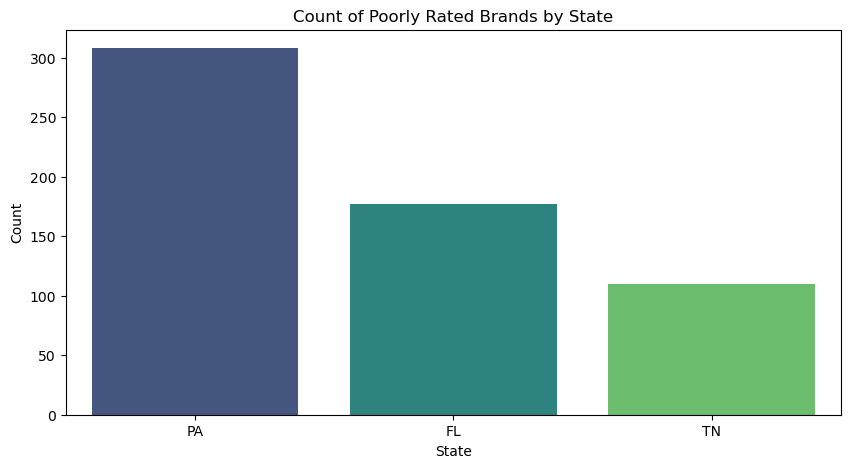

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='state',data=poorly_rated_df,order=poorly_rated_df['state'].value_counts().index,palette='viridis')
plt.title('Count of Poorly Rated Brands by State')
plt.xlabel('State')
plt.ylabel('Count')
plt.show()

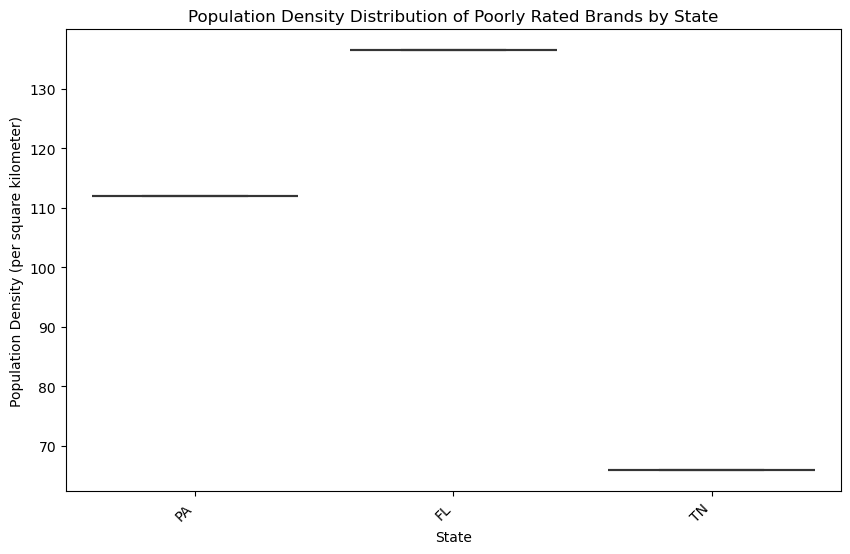

In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(x='state',y='pop_density',data=poorly_rated_df,palette='viridis')
plt.title('Population Density Distribution of Poorly Rated Brands by State')
plt.xlabel('State')
plt.ylabel('Population Density (per square kilometer)')
plt.xticks(rotation=45,ha='right')
plt.show()

In [ ]:
# Get the top 20 brands
top_20_brands=filtered_state_pizza_df['name'].value_counts().head(20).index

# Filter the DataFrame to include only the top 20 brands
top_20_brands_df=filtered_state_pizza_df[filtered_state_pizza_df['name'].isin(top_20_brands)].copy()

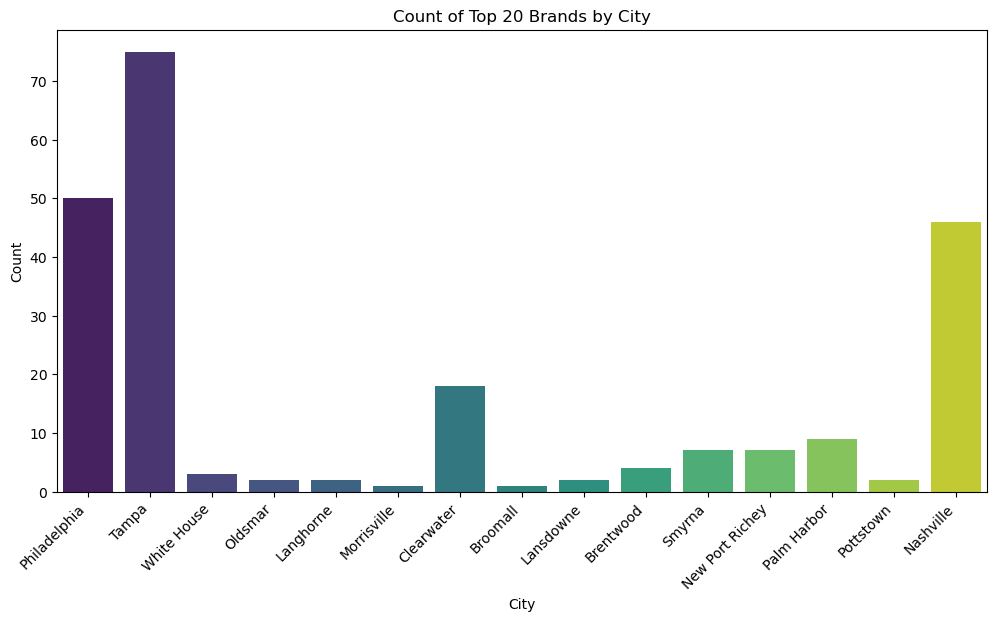

In [ ]:
plt.figure(figsize=(12,6))
sns.countplot(x='city',data=top_20_brands_df,order=top_20_brands_df['city'].head(20).value_counts().index,palette='viridis')
plt.xticks(rotation=45,ha='right')
plt.title('Count of Top 20 Brands by City')
plt.xlabel('City')
plt.ylabel('Count')
plt.show()

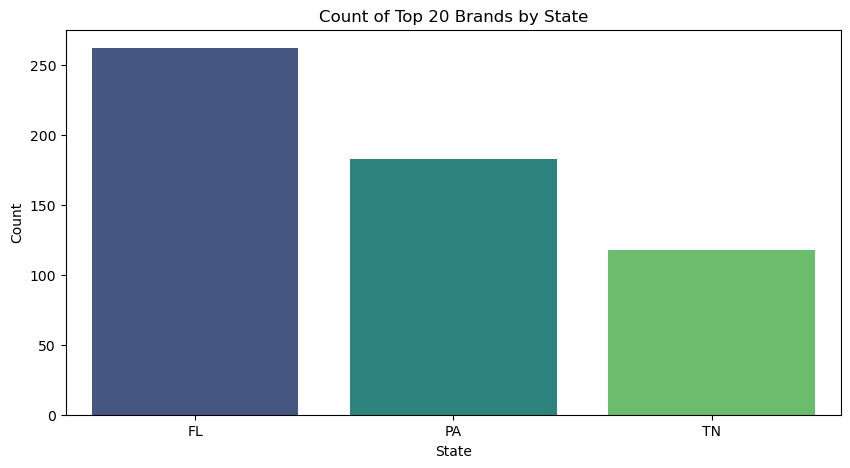

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='state',data=top_20_brands_df,order=top_20_brands_df['state'].value_counts().index,palette='viridis')
plt.title('Count of Top 20 Brands by State')
plt.xlabel('State')
plt.ylabel('Count')
plt.show()

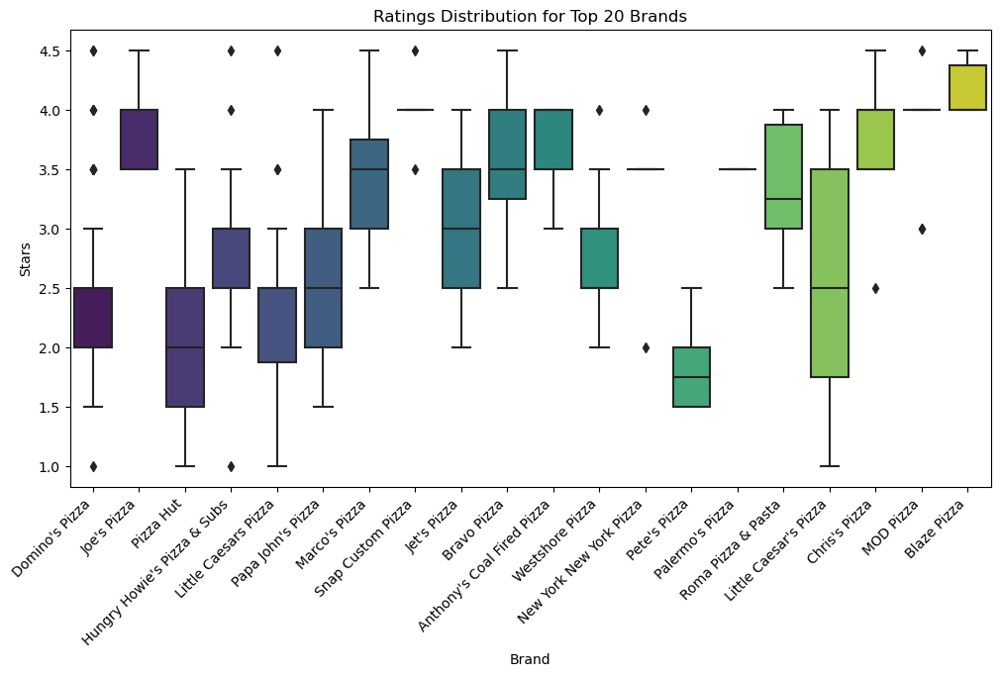

In [ ]:
plt.figure(figsize=(12,6))
sns.boxplot(x='name',y='stars',data=top_20_brands_df,palette='viridis')
plt.title('Ratings Distribution for Top 20 Brands')
plt.xlabel('Brand')
plt.ylabel('Stars')
plt.xticks(rotation=45,ha='right')
plt.show()

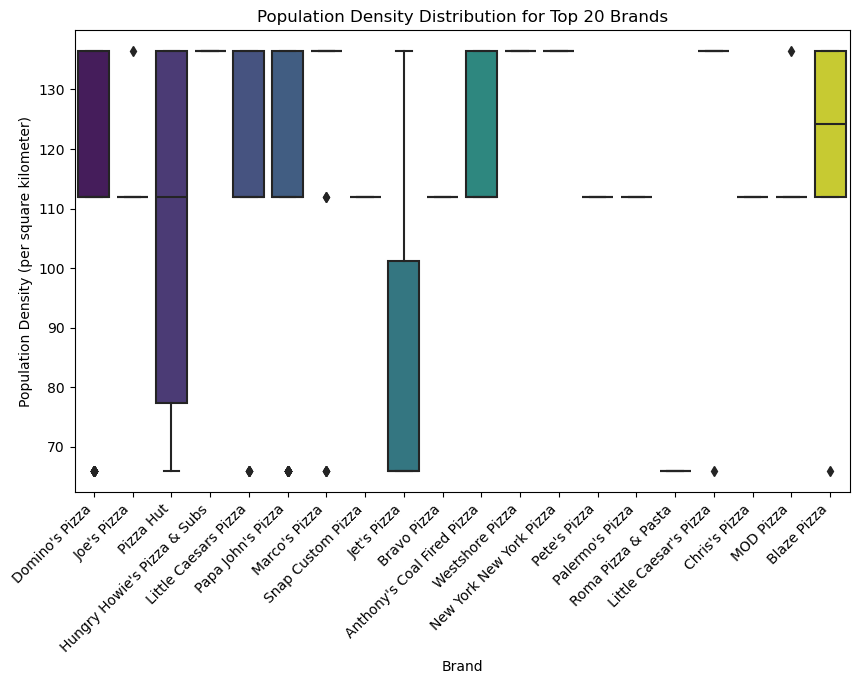

In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(x='name',y='pop_density',data=top_20_brands_df,palette='viridis')
plt.title('Population Density Distribution for Top 20 Brands')
plt.xlabel('Brand')
plt.ylabel('Population Density (per square kilometer)')
plt.xticks(rotation=45,ha='right')
plt.show()

In [ ]:
# Calculate average ratings by city
avg_ratings_by_city=filtered_state_pizza_df.groupby('city')['stars'].mean().reset_index()

# Calculate average ratings by state
avg_ratings_by_state=filtered_state_pizza_df.groupby('state')['stars'].mean().reset_index()

# Display the first few rows
print("Average Ratings by City:")
print(avg_ratings_by_city.head())

print("\nAverage Ratings by State:")
print(avg_ratings_by_state)

Average Ratings by City:
           city     stars
0      Abington  2.500000
1         Aldan  4.500000
2        Ambler  3.250000
3       Antioch  2.916667
4  Apollo Beach  3.214286

Average Ratings by State:
  state     stars
0    FL  3.254576
1    PA  3.240334
2    TN  2.947674


In [ ]:
# Count the number of businesses by city
business_count_by_city=filtered_state_pizza_df['city'].value_counts().reset_index()
business_count_by_city.columns=['city','business_count']

# Count the number of businesses by state
business_count_by_state=filtered_state_pizza_df['state'].value_counts().reset_index()
business_count_by_state.columns=['state','business_count']

# Display the first few rows
print("Business Count by City:")
print(business_count_by_city.head())

print("\nBusiness Count by State:")
print(business_count_by_state)

Business Count by City:
           city  business_count
0  Philadelphia             445
1         Tampa             162
2     Nashville             125
3    Clearwater              49
4  West Chester              32

Business Count by State:
  state  business_count
0    PA            1138
1    FL             601
2    TN             258


In [ ]:
# Calculate total reviews by city
total_reviews_by_city=filtered_state_pizza_df.groupby('city')['review_count'].sum().reset_index()

# Calculate total reviews by state
total_reviews_by_state=filtered_state_pizza_df.groupby('state')['review_count'].sum().reset_index()

# Display the first few rows
print("Total Reviews by City:")
print(total_reviews_by_city.head())

print("\nTotal Reviews by State:")
print(total_reviews_by_state)

Total Reviews by City:
           city  review_count
0      Abington           110
1         Aldan             7
2        Ambler           246
3       Antioch           788
4  Apollo Beach           269

Total Reviews by State:
  state  review_count
0    FL         34512
1    PA         49755
2    TN         16127


In [ ]:
# Assign weights
weight_ratings=0.5
weight_business_count=0.3
weight_total_reviews=0.2

# Normalize data
def normalize_data(df,column):
    df['normalized_' + column]=(df[column] - df[column].min()) / (df[column].max() - df[column].min())

# Normalize average ratings
normalize_data(avg_ratings_by_city,'stars')
normalize_data(avg_ratings_by_state,'stars')

# Normalize business count
normalize_data(business_count_by_city,'business_count')
normalize_data(business_count_by_state,'business_count')

# Normalize total reviews
normalize_data(total_reviews_by_city,'review_count')
normalize_data(total_reviews_by_state,'review_count')

# Merge dataframes
merged_data_city=avg_ratings_by_city.merge(business_count_by_city,on='city').merge(total_reviews_by_city,on='city')
merged_data_state=avg_ratings_by_state.merge(business_count_by_state,on='state').merge(total_reviews_by_state,on='state')


In [ ]:
# Calculate scores
merged_data_city['score']=(weight_ratings * merged_data_city['normalized_stars']) + \
                            (weight_business_count * merged_data_city['normalized_business_count']) + \
                            (weight_total_reviews * merged_data_city['normalized_review_count'])

merged_data_state['score']=(weight_ratings * merged_data_state['normalized_stars']) + \
                             (weight_business_count * merged_data_state['normalized_business_count']) + \
                             (weight_total_reviews * merged_data_state['normalized_review_count'])

In [ ]:
# Rank cities and states
merged_data_city['rank']=merged_data_city['score'].rank(ascending=False)
merged_data_state['rank']=merged_data_state['score'].rank(ascending=False)

# Sort by rank
optimal_cities=merged_data_city.sort_values(by='rank').head(10)
optimal_states=merged_data_state.sort_values(by='rank').head(10)

# Display top 10 optimal cities and states
print("Top 10 Optimal Cities:")
print(optimal_cities[['city','normalized_stars','normalized_business_count','normalized_review_count','score','rank']])

print("\nTop 10 Optimal States:")
print(optimal_states[['state','normalized_stars','normalized_business_count','normalized_review_count','score','rank']])

Top 10 Optimal Cities:
                      city  normalized_stars  normalized_business_count  \
155           Philadelphia          0.520225                   1.000000   
110               Lederach          1.000000                   0.000000   
201                  Tampa          0.549383                   0.362613   
24                  Cedars          0.875000                   0.000000   
96        Kingston Springs          0.875000                   0.000000   
121               Manayunk          0.875000                   0.000000   
233               Wyndmoor          0.875000                   0.000000   
141  North Redington Beach          0.875000                   0.000000   
176          Safety Harbor          0.875000                   0.000000   
125             Montgomery          0.875000                   0.000000   

     normalized_review_count     score  rank  
155                 1.000000  0.760112   1.0  
110                 0.000386  0.500077   2.0  
201       

In [ ]:
# Group by state and city,summing up the review counts
city_review_counts=filtered_state_pizza_df.groupby(['state','city'])['review_count'].sum().reset_index()

# Sort by state and review count
city_review_counts_sorted=city_review_counts.sort_values(by=['state','review_count'],ascending=[True,False])

# Create a dictionary to store the top 10 cities for each state
top_cities_by_state={}

# Iterate over each state to get the top 10 cities
for state in city_review_counts_sorted['state'].unique():
    top_cities=city_review_counts_sorted[city_review_counts_sorted['state']==state].head(10)
    top_cities_by_state[state]=top_cities

# Display the top 10 cities for each state
for state,top_cities in top_cities_by_state.items():
    print(f"Top 10 Cities in {state} by Review Count:")
    print(top_cities[['city','review_count']])
    print("\n")

Top 10 Cities in FL by Review Count:
                city  review_count
43             Tampa         10575
3         Clearwater          3985
32  Saint Petersburg          2523
15             Largo          1390
29         Riverview          1225
2            Brandon          1221
24       Palm Harbor          1208
52     Wesley Chapel          1101
18              Lutz          1058
20   New Port Richey          1027


Top 10 Cities in PA by Review Count:
             city  review_count
163  Philadelphia         23318
202  West Chester           943
57        Ardmore           719
168     Pottstown           661
201         Wayne           647
61       Bensalem           629
87    Downingtown           618
198    Warminster           616
95          Exton           604
70      Bryn Mawr           563


Top 10 Cities in TN by Review Count:
               city  review_count
229       Nashville         10873
216        Franklin          1393
212         Antioch           788
214       Br

In [ ]:
# Filter for Philadelphia
philadelphia_df=filtered_state_pizza_df[filtered_state_pizza_df['city']=='Philadelphia']

# Sort by 'review_count' in descending order
sorted_philadelphia=philadelphia_df.sort_values(by='review_count',ascending=False)

# Extract unique zip codes
philadelphia_zipcodes=sorted_philadelphia['postal_code'].unique()

# Display the sorted zip codes
print("Top Zip Codes for Philadelphia by Review Count:")
for zipcode in philadelphia_zipcodes:
    print(zipcode)

Top Zip Codes for Philadelphia by Review Count:
19147
19125
19102
19107
19130
19106
19103
19128
19104
19123
19119
19148
19131
19154
19145
19129
19116
19149
19122
19151
19111
19152
19132
19118
19115
19143
19136
19142
19140
19127
19139
19135
19114
19120
19134
19121
19146
19126
19124
19141
19150
19144
19138
19133
19153
19137


In [ ]:
# Filter for Philadelphia
philadelphia_df=filtered_state_pizza_df[filtered_state_pizza_df['city']=='Philadelphia']

# Group by 'postal_code' and sum 'review_count'
zipcode_review_counts=philadelphia_df.groupby('postal_code')['review_count'].sum().reset_index()

# Sort by 'review_count' in descending order
sorted_zipcode_review_counts=zipcode_review_counts.sort_values(by='review_count',ascending=False)

# Display the sorted zip codes and their corresponding review counts
print("Zip Codes in Philadelphia with Review Counts:")
print(sorted_zipcode_review_counts)

Zip Codes in Philadelphia with Review Counts:
   postal_code  review_count
38       19147          2952
2        19104          2072
4        19107          1516
0        19102          1477
16       19125          1304
21       19130          1289
19       19128          1174
1        19103          1162
3        19106           976
39       19148           786
14       19123           716
36       19145           507
5        19111           501
20       19129           462
13       19122           381
22       19131           380
27       19136           376
40       19149           353
25       19134           338
26       19135           327
7        19115           286
8        19116           260
43       19152           257
6        19114           243
11       19120           237
31       19140           221
23       19132           208
18       19127           206
42       19151           205
15       19124           204
9        19118           200
10       19119           2

# NLP

#### Data Preparation

In [ ]:
df_subset=pd.read_csv('filtered_review_df_pizza.csv')
df_subset.head(10)

,review_id,user_id,business_id,stars,useful,funny,cool,text,date
0,UD0AKHQQHSzYsbCkdM7Xrw,Au2RZKzmrr75h2bBpb60oA,tJCnUtGdyPyOGt5kudLrTA,4,0,0,0,I'm giving this joint 4 stars because they hav...,2012-03-30 20:57:29
1,qsjMCjaEW9UWyzAw4ujWcw,PCBxQaoILfrsmEg9kpd64A,HrIbP2-jdRJAU92yqyDmyw,5,2,0,0,I finally got to try them. Wow..they did a gre...,2016-03-07 03:19:29
2,JfFODAip9Xsz-eXKLSjwZA,0XmgOinrZWNO15DlimRQeg,PpZqlVUAP2i8_hNfpQyKhg,5,0,0,0,"Buckingham Pizza makes the best pizza around, ...",2012-03-01 02:28:24
3,AdGd-xcpJF4C-zYduRM03Q,2XBcnIVhp_pEeer-asuxHA,bUnqKEP7h48ePxHMXV0fNw,3,0,0,0,A good place to order from when its late and y...,2016-04-23 08:13:00
4,b22OR-MNCZ-TOf6XIbkg6w,nGO8Re5IpOosHdWPqn8vWQ,Uc6PdjT_MO5bRPQsUUEy5Q,4,0,0,0,"We loved the food, service and decor! The minu...",2012-10-08 22:39:38
5,tGzobhc7MyMSej6gVdv3Pw,gSEhdaQNcewg-ob6xSgleQ,1NCUTTp6rIyXpwUDVv9qOA,2,0,0,0,I had to write an order after coming here a co...,2016-06-22 21:51:03
6,CQ-dwNoxvYTOD5-HNJEjeA,Sg6nAp9Ru1a2axJACwjNsA,YeMouev-sLfAxykmcANNoQ,1,0,0,0,"Horrible experience, pizza was soggy and cold ...",2015-04-29 03:17:30
7,6PN2cvx6cCrEXGibVmdhnw,-OCbPl8jDXA-RzGjaQdEQA,p7C2l6MyJLq9lKMmUhjqMg,1,0,0,0,I will not return to this location. I contacte...,2018-05-28 20:34:40
8,wNeJFtvJRAOTLNePJVTmKg,K6ouCoiLDaiu5EMYm9SpTQ,DTuAFwqf2lknagHDT4pUMA,5,0,0,0,Great pizza! The owner Pete is usually there ...,2012-10-08 12:46:55
9,7yZn4_F0oZG0oJLgGI1C0g,3t2hth7NFZ21lQOHXeQTvw,ZWRgvtyHRobwpi4G-Z4STQ,5,1,0,1,Pizza was so good! First time trying today and...,2017-11-18 21:44:34


In [ ]:
columns_to_drop=['review_id',	'user_id','business_id','useful',	'funny','cool','date']

# Drop the original column
df_subset.drop(columns=columns_to_drop,inplace=True)
df_subset.shape

(107024, 2)

In [ ]:
# Function for preprocessing text
def preprocess_text(text):
    words=word_tokenize(text)  # Tokenize the text
    preprocessed_words=[lemmatizer.lemmatize(word.lower()) for word in words if word.isalpha() and word.lower() not in stop_words]
    preprocessed_text=' '.join(preprocessed_words)  # Join the preprocessed words into a single string
    return preprocessed_text

# Define a function to label scores
def label_score(stars):
    if stars in [1,2,3]:
        return 0
    elif stars in [4,5]:
        return 1

In [ ]:
df_subset['text_preprocessed']=df_subset['text'].apply(preprocess_text)

# Apply the function to create the 'Label' column
df_subset['Label']=df_subset['stars'].apply(label_score)

# Display the DataFrame with the new 'Label' column
df_subset.head()

,stars,text,text_preprocessed,Label
0,4,I'm giving this joint 4 stars because they hav...,giving joint star earned definitely star mater...,1
1,5,I finally got to try them. Wow..they did a gre...,finally got try wow great job remodle loved mu...,1
2,5,"Buckingham Pizza makes the best pizza around, ...",buckingham pizza make best pizza around partic...,1
3,3,A good place to order from when its late and y...,good place order late muchies whatever reason,0
4,4,"We loved the food, service and decor! The minu...",loved food service decor minute walked late lu...,1


In [ ]:
positive_samples=df[df['Label']==1].sample(n=18485,random_state=42)
negative_samples=df[df['Label']==0].sample(n=11515,random_state=42)

# Concatenate the sampled subsets
df_subset=pd.concat([positive_samples,negative_samples])

# Shuffle the dataset
df_subset=df_subset.sample(frac=1,random_state=42)

# Print the shape of the subset dataset
print("Shape of subset dataset:",df_subset.shape)

# Verify the distribution of labels in the subset dataset
print("Distribution of labels in the subset dataset:")
print(df_subset['Label'].value_counts())

Shape of subset dataset: (30000, 4)
Distribution of labels in the subset dataset:
Label
1    18485
0    11515
Name: count, dtype: int64


In [ ]:
# Split the data into features (X) and labels (y)
X=df_subset['text_preprocessed']  # Features
y=df_subset['Label']  # Labels

In [ ]:
# Split the data into training and testing sets (80% train,20% test)
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [ ]:
# Print the shapes of the training and testing sets
print("Training set shape:",X_train.shape,y_train.shape)
print("Testing set shape:",X_test.shape,y_test.shape)

Training set shape: (24000,) (24000,)
Testing set shape: (6000,) (6000,)



#### TF-IDF

In [ ]:
# Create TF-IDF representation of the text data
tfidf_vectorizer=TfidfVectorizer()
X_train_tfidf=tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf=tfidf_vectorizer.transform(X_test)

In [ ]:
# Initialize and train Logistic Regression model with TF-IDF features
log_tfidf=LogisticRegression(max_iter=1000)
log_tfidf.fit(X_train_tfidf,y_train)

# Predictions on the testing set using TF-IDF features
y_pred_tfidf=log_tfidf.predict(X_test_tfidf)

# Calculate evaluation metrics for TF-IDF features
accuracy_tfidf=accuracy_score(y_test,y_pred_tfidf)
precision_tfidf=precision_score(y_test,y_pred_tfidf)
recall_tfidf=recall_score(y_test,y_pred_tfidf)
f1_tfidf=f1_score(y_test,y_pred_tfidf)
conf_matrix_tfidf=confusion_matrix(y_test,y_pred_tfidf)

# Print the evaluation metrics for TF-IDF features
print("Accuracy (TF-IDF):",accuracy_tfidf)
print("Precision (TF-IDF):",precision_tfidf)
print("Recall (TF-IDF):",recall_tfidf)
print("F1 Score (TF-IDF):",f1_tfidf)
print("\nConfusion Matrix (TF-IDF):\n",conf_matrix_tfidf)

Accuracy (TF-IDF): 0.8551401869158879
Precision (TF-IDF): 0.8269230769230769
Recall (TF-IDF): 0.9699248120300752
F1 Score (TF-IDF): 0.8927335640138407

Confusion Matrix (TF-IDF):
 [[1514  757]
 [ 112 3617]]
 


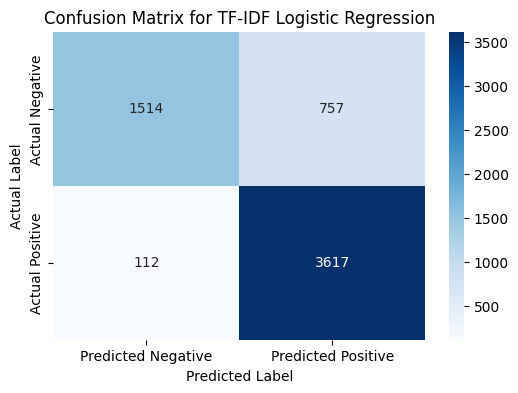

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1514,757],[112,3617]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for TF-IDF Logistic Regression")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [ ]:
# Initialize and train Naive Bayes model with TF-IDF features
nb_tfidf=MultinomialNB()
nb_tfidf.fit(X_train_tfidf,y_train)

# Predictions on the testing set using TF-IDF features
y_pred_tfidf=nb_tfidf.predict(X_test_tfidf)

# Calculate evaluation metrics for TF-IDF features
accuracy_tfidf=accuracy_score(y_test,y_pred_tfidf)
precision_tfidf=precision_score(y_test,y_pred_tfidf)
recall_tfidf=recall_score(y_test,y_pred_tfidf)
f1_tfidf=f1_score(y_test,y_pred_tfidf)
conf_matrix_tfidf=confusion_matrix(y_test,y_pred_tfidf)

# Print the evaluation metrics for TF-IDF features
print("Accuracy (TF-IDF):",accuracy_tfidf)
print("Precision (TF-IDF):",precision_tfidf)
print("Recall (TF-IDF):",recall_tfidf)
print("F1 Score (TF-IDF):",f1_tfidf)
print("\nConfusion Matrix (TF-IDF):\n",conf_matrix_tfidf)

Accuracy (TF-IDF): 0.780373831775701
Precision (TF-IDF): 0.7415730337078652
Recall (TF-IDF): 0.9924812030075187
F1 Score (TF-IDF): 0.8488745980707395

Confusion Matrix (TF-IDF):
 [[ 981 1289]
 [  28 3702]]
 


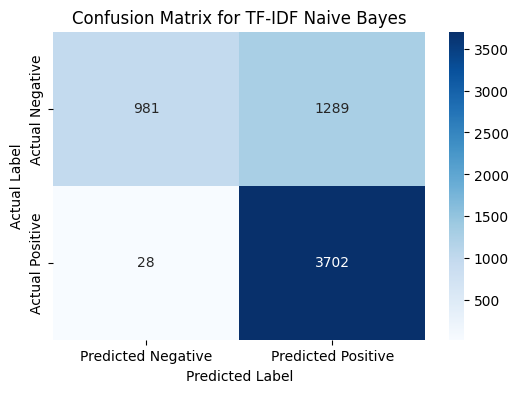

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[981,1289],[28,3702]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for TF-IDF Naive Bayes")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [ ]:
# Initialize and train KNN model with TF-IDF features
knn_tfidf=KNeighborsClassifier(n_neighbors=5)
knn_tfidf.fit(X_train_tfidf,y_train)

# Predictions on the testing set using TF-IDF features
y_pred_tfidf=knn_tfidf.predict(X_test_tfidf)

# Calculate evaluation metrics for TF-IDF features
accuracy_tfidf=accuracy_score(y_test,y_pred_tfidf)
precision_tfidf=precision_score(y_test,y_pred_tfidf)
recall_tfidf=recall_score(y_test,y_pred_tfidf)
f1_tfidf=f1_score(y_test,y_pred_tfidf)
conf_matrix_tfidf=confusion_matrix(y_test,y_pred_tfidf)

# Print the evaluation metrics for TF-IDF features
print("Accuracy (TF-IDF):",accuracy_tfidf)
print("Precision (TF-IDF):",precision_tfidf)
print("Recall (TF-IDF):",recall_tfidf)
print("F1 Score (TF-IDF):",f1_tfidf)
print("\nConfusion Matrix (TF-IDF):\n",conf_matrix_tfidf)


Accuracy (TF-IDF): 0.8271028037383178
Precision (TF-IDF): 0.8287671232876712
Recall (TF-IDF): 0.9097744360902256
F1 Score (TF-IDF): 0.8673835125448028

Confusion Matrix (TF-IDF):
[[1570  700]
 [ 336 3394]]



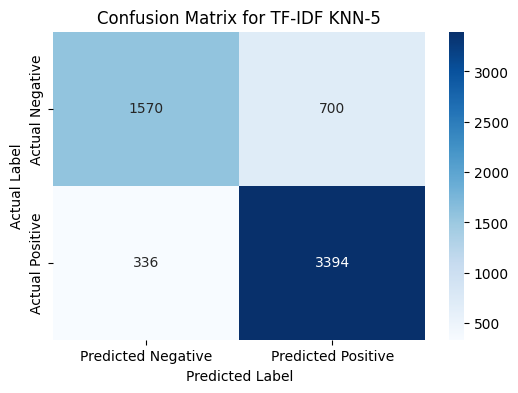

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1570,700],[336,3394]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for TF-IDF KNN-5")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [ ]:
# Initialize and train Decision Tree model with TF-IDF features
dt_tfidf=DecisionTreeClassifier(random_state=42)
dt_tfidf.fit(X_train_tfidf,y_train)

# Predictions on the testing set using TF-IDF features
y_pred_tfidf=dt_tfidf.predict(X_test_tfidf)

# Calculate evaluation metrics for TF-IDF features
accuracy_tfidf=accuracy_score(y_test,y_pred_tfidf)
precision_tfidf=precision_score(y_test,y_pred_tfidf)
recall_tfidf=recall_score(y_test,y_pred_tfidf)
f1_tfidf=f1_score(y_test,y_pred_tfidf)
conf_matrix_tfidf=confusion_matrix(y_test,y_pred_tfidf)

# Print the evaluation metrics for TF-IDF features
print("Accuracy (TF-IDF):",accuracy_tfidf)
print("Precision (TF-IDF):",precision_tfidf)
print("Recall (TF-IDF):",recall_tfidf)
print("F1 Score (TF-IDF):",f1_tfidf)
print("\nConfusion Matrix (TF-IDF):\n",conf_matrix_tfidf)

Accuracy (TF-IDF): 0.705607476635514
Precision (TF-IDF): 0.7777777777777778
Recall (TF-IDF): 0.7368421052631579
F1 Score (TF-IDF): 0.7567567567567567

Confusion Matrix (TF-IDF):
[[1485  785]
 [ 981 2749]]
 


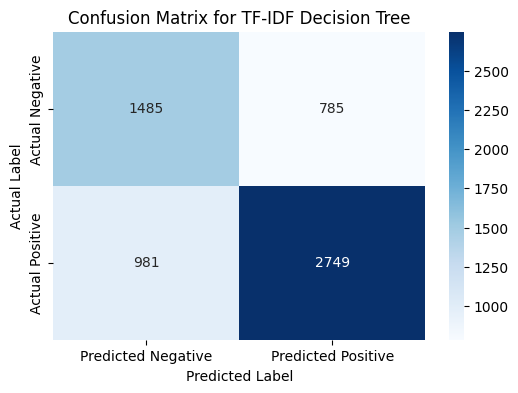

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1485,785],[981,2749]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for TF-IDF Decision Tree")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [ ]:
# Initialize and train Support Vector model with TF-IDF features
svc_tfidf=SVC(probability=True,random_state=42)
svc_tfidf.fit(X_train_tfidf,y_train)

# Predictions on the testing set using TF-IDF features
y_pred_tfidf=svc_tfidf.predict(X_test_tfidf)

# Calculate evaluation metrics for TF-IDF features
accuracy_tfidf=accuracy_score(y_test,y_pred_tfidf)
precision_tfidf=precision_score(y_test,y_pred_tfidf)
recall_tfidf=recall_score(y_test,y_pred_tfidf)
f1_tfidf=f1_score(y_test,y_pred_tfidf)
conf_matrix_tfidf=confusion_matrix(y_test,y_pred_tfidf)

# Print the evaluation metrics for TF-IDF features
print("Accuracy (TF-IDF):",accuracy_tfidf)
print("Precision (TF-IDF):",precision_tfidf)
print("Recall (TF-IDF):",recall_tfidf)
print("F1 Score (TF-IDF):",f1_tfidf)
print("\nConfusion Matrix (TF-IDF):\n",conf_matrix_tfidf)

Accuracy (TF-IDF): 0.8504672897196262
Precision (TF-IDF): 0.821656050955414
Recall (TF-IDF): 0.9699248120300752
F1 Score (TF-IDF): 0.8896551724137931

Confusion Matrix (TF-IDF):
[[1485  785]
 [ 112 3618]]



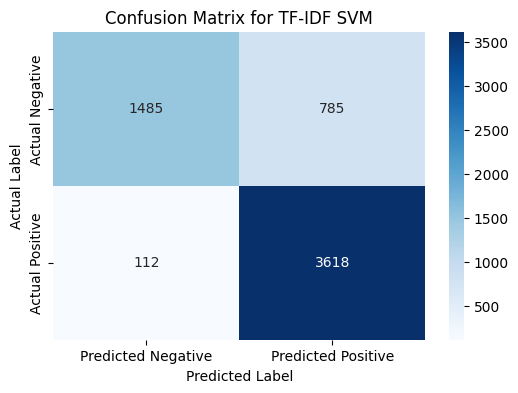

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1485,785],[112,3618]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for TF-IDF SVM")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()


In [ ]:
# Initialize and train Random Forest model with TF-IDF features
rf_tfidf=RandomForestClassifier(random_state=42)
rf_tfidf.fit(X_train_tfidf,y_train)

# Predictions on the testing set using TF-IDF features
y_pred_tfidf=rf_tfidf.predict(X_test_tfidf)

# Calculate evaluation metrics for TF-IDF features
accuracy_tfidf=accuracy_score(y_test,y_pred_tfidf)
precision_tfidf=precision_score(y_test,y_pred_tfidf)
recall_tfidf=recall_score(y_test,y_pred_tfidf)
f1_tfidf=f1_score(y_test,y_pred_tfidf)
conf_matrix_tfidf=confusion_matrix(y_test,y_pred_tfidf)

# Print the evaluation metrics for TF-IDF features
print("Accuracy (TF-IDF):",accuracy_tfidf)
print("Precision (TF-IDF):",precision_tfidf)
print("Recall (TF-IDF):",recall_tfidf)
print("F1 Score (TF-IDF):",f1_tfidf)
print("\nConfusion Matrix (TF-IDF):\n",conf_matrix_tfidf)

Accuracy (TF-IDF): 0.8084112149532711
Precision (TF-IDF): 0.7875
Recall (TF-IDF): 0.9473684210526315
F1 Score (TF-IDF): 0.8600682593856654

Confusion Matrix (TF-IDF):
[[1317  953]
 [ 196 3534]]
 


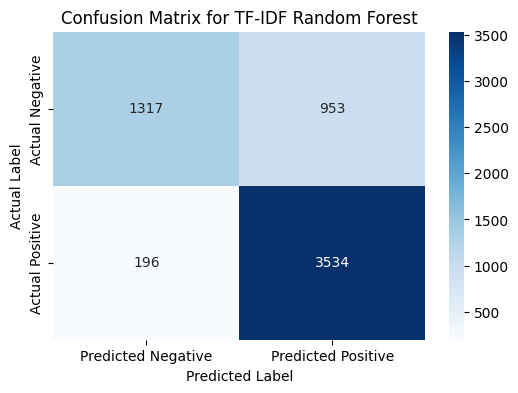

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1317,953],[196,3534]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for TF-IDF Random Forest")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

#### Word2Vec

In [ ]:
# Tokenize the preprocessed text data
tokenized_text=[sentence.split() for sentence in X]
# Initialize Word2Vec model
word2vec_model=Word2Vec(tokenized_text,vector_size=300,window=5,min_count=1,sg=0)
# Initialize an empty array to store the Word2Vec representations
word2vec_representations=[]
# Initialize an empty list to store the indices of valid samples
valid_indices=[]

In [ ]:
# Iterate through each tokenized sentence
for i,sentence in enumerate(tokenized_text):
    # Initialize an empty array to store the word vectors for each word in the sentence
    sentence_vectors=[]
    # Iterate through each word in the sentence
    for word in sentence:
        # Check if the word is present in the vocabulary of the Word2Vec model
        if word in word2vec_model.wv:
            # Append the word vector to the sentence vectors
            sentence_vectors.append(word2vec_model.wv[word])
    # If there are no word vectors for the sentence,skip it
    if not sentence_vectors:
        continue
    # Compute the mean of the word vectors for the sentence and append it to the list of representations
    word2vec_representations.append(np.mean(sentence_vectors,axis=0))
    # Store the index of the valid sample
    valid_indices.append(i)

In [ ]:
# Convert the list of representations to a numpy array
word2vec_representations=np.array(word2vec_representations)

In [ ]:
# Use the valid indices to update y
y=y.iloc[valid_indices]

In [ ]:
# Split the data into training and testing sets
X_train_word2vec,X_test_word2vec,y_train,y_test=train_test_split(word2vec_representations,y,test_size=0.2,random_state=42)

In [ ]:
# Initialize and train Logistic Regression model with Word2Vec features
log_word2vec=LogisticRegression(max_iter=1000)
log_word2vec.fit(X_train_word2vec,y_train)

# Predictions on the testing set using Word2Vec features
y_pred_word2vec=log_word2vec.predict(X_test_word2vec)

# Calculate evaluation metrics for Word2Vec features
accuracy_word2vec=accuracy_score(y_test,y_pred_word2vec)
precision_word2vec=precision_score(y_test,y_pred_word2vec)
recall_word2vec=recall_score(y_test,y_pred_word2vec)
f1_word2vec=f1_score(y_test,y_pred_word2vec)
conf_matrix_word2vec=confusion_matrix(y_test,y_pred_word2vec)

# Print the evaluation metrics for Word2Vec features
print("Accuracy (Word2Vec):",accuracy_word2vec)
print("Precision (Word2Vec):",precision_word2vec)
print("Recall (Word2Vec):",recall_word2vec)
print("F1 Score (Word2Vec):",f1_word2vec)
print("\nConfusion Matrix (Word2Vec):\n",conf_matrix_word2vec)

Accuracy (Word2Vec): 0.616822429906542
Precision (Word2Vec): 0.6363636363636364
Recall (Word2Vec): 0.8947368421052632
F1 Score (Word2Vec): 0.74375

Confusion Matrix (Word2Vec):
[[ 364 1906]
 [ 392 3338]]



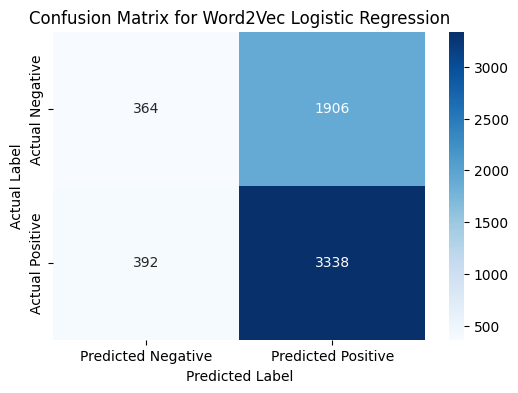

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[364,1906],[392,3338]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for Word2Vec Logistic Regression")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [ ]:
# Initialize and train Naive Bayes model with Word2Vec features
nb_word2vec=GaussianNB()
nb_word2vec.fit(X_train_word2vec,y_train)

# Predictions on the testing set using Word2Vec features
y_pred_word2vec=nb_word2vec.predict(X_test_word2vec)

# Calculate evaluation metrics for Word2Vec features
accuracy_word2vec=accuracy_score(y_test,y_pred_word2vec)
precision_word2vec=precision_score(y_test,y_pred_word2vec)
recall_word2vec=recall_score(y_test,y_pred_word2vec)
f1_word2vec=f1_score(y_test,y_pred_word2vec)
conf_matrix_word2vec=confusion_matrix(y_test,y_pred_word2vec)

# Print the evaluation metrics for Word2Vec features
print("Accuracy (Word2Vec):",accuracy_word2vec)
print("Precision (Word2Vec):",precision_word2vec)
print("Recall (Word2Vec):",recall_word2vec)
print("F1 Score (Word2Vec):",f1_word2vec)
print("\nConfusion Matrix (Word2Vec):\n",conf_matrix_word2vec)

Accuracy (Word2Vec): 0.5747663551401869
Precision (Word2Vec): 0.75
Recall (Word2Vec): 0.47368421052631576
F1 Score (Word2Vec): 0.5806451612903226

Confusion Matrix (Word2Vec):
[[1682  588]
 [1962 1768]]



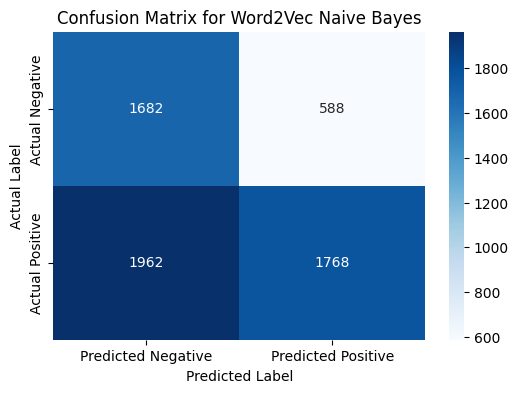

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1682,588],[1962,1768]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for Word2Vec Naive Bayes")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [ ]:
# Initialize and train KNN-5 model with Word2Vec features
knn_word2vec=KNeighborsClassifier(n_neighbors=5)
knn_word2vec.fit(X_train_word2vec,y_train)

# Predictions on the testing set using Word2Vec features
y_pred_word2vec=knn_word2vec.predict(X_test_word2vec)

# Calculate evaluation metrics for Word2Vec features
accuracy_word2vec=accuracy_score(y_test,y_pred_word2vec)
precision_word2vec=precision_score(y_test,y_pred_word2vec)
recall_word2vec=recall_score(y_test,y_pred_word2vec)
f1_word2vec=f1_score(y_test,y_pred_word2vec)
conf_matrix_word2vec=confusion_matrix(y_test,y_pred_word2vec)

# Print the evaluation metrics for Word2Vec features
print("Accuracy (Word2Vec):",accuracy_word2vec)
print("Precision (Word2Vec):",precision_word2vec)
print("Recall (Word2Vec):",recall_word2vec)
print("F1 Score (Word2Vec):",f1_word2vec)
print("\nConfusion Matrix (Word2Vec):\n",conf_matrix_word2vec)

Accuracy (Word2Vec): 0.6401869158878505
Precision (Word2Vec): 0.675
Recall (Word2Vec): 0.8120300751879699
F1 Score (Word2Vec): 0.7372013651877133

Confusion Matrix (Word2Vec):
[[ 813 1457]
 [ 700 3030]]



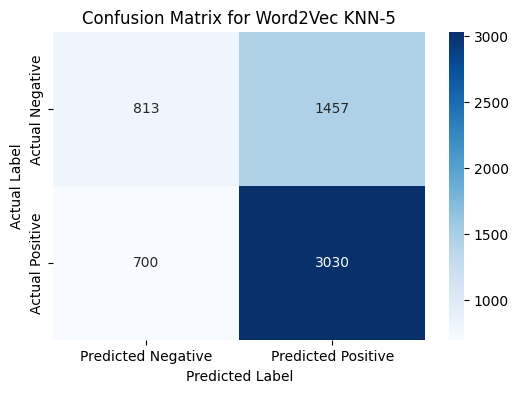

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[813,1457],[700,3030]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for Word2Vec KNN-5")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [ ]:
# Initialize and train Decision Tree model with Word2Vec features
dt_word2vec=DecisionTreeClassifier(random_state=42)
dt_word2vec.fit(X_train_word2vec,y_train)

# Predictions on the testing set using Word2Vec features
y_pred_word2vec=dt_word2vec.predict(X_test_word2vec)

# Calculate evaluation metrics for Word2Vec features
accuracy_word2vec=accuracy_score(y_test,y_pred_word2vec)
precision_word2vec=precision_score(y_test,y_pred_word2vec)
recall_word2vec=recall_score(y_test,y_pred_word2vec)
f1_word2vec=f1_score(y_test,y_pred_word2vec)
conf_matrix_word2vec=confusion_matrix(y_test,y_pred_word2vec)

# Print the evaluation metrics for Word2Vec features
print("Accuracy (Word2Vec):",accuracy_word2vec)
print("Precision (Word2Vec):",precision_word2vec)
print("Recall (Word2Vec):",recall_word2vec)
print("F1 Score (Word2Vec):",f1_word2vec)
print("\nConfusion Matrix (Word2Vec):\n",conf_matrix_word2vec)

Accuracy (Word2Vec): 0.6915887850467289
Precision (Word2Vec): 0.7481481481481481
Recall (Word2Vec): 0.7593984962406015
F1 Score (Word2Vec): 0.753731343283582

Confusion Matrix (Word2Vec):
[[1317  953]
 [ 897 2833]]



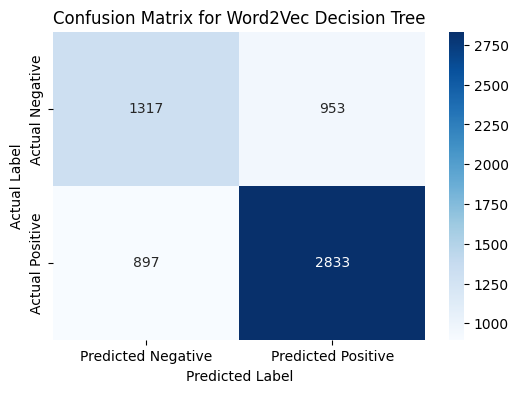

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1317,953],[897,2833]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for Word2Vec Decision Tree")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [ ]:
# Initialize and train Support Vector model with Word2Vec features
svc_word2vec=SVC(random_state=42)
svc_word2vec.fit(X_train_word2vec,y_train)

# Predictions on the testing set using Word2Vec features
y_pred_word2vec=svc_word2vec.predict(X_test_word2vec)

# Calculate evaluation metrics for Word2Vec features
accuracy_word2vec=accuracy_score(y_test,y_pred_word2vec)
precision_word2vec=precision_score(y_test,y_pred_word2vec)
recall_word2vec=recall_score(y_test,y_pred_word2vec)
f1_word2vec=f1_score(y_test,y_pred_word2vec)
conf_matrix_word2vec=confusion_matrix(y_test,y_pred_word2vec)

# Print the evaluation metrics for Word2Vec features
print("Accuracy (Word2Vec):",accuracy_word2vec)
print("Precision (Word2Vec):",precision_word2vec)
print("Recall (Word2Vec):",recall_word2vec)
print("F1 Score (Word2Vec):",f1_word2vec)
print("\nConfusion Matrix (Word2Vec):\n",conf_matrix_word2vec)

Accuracy (Word2Vec): 0.6214953271028038
Precision (Word2Vec): 0.6214953271028038
Recall (Word2Vec): 1.0
F1 Score (Word2Vec): 0.7665706051873199

Confusion Matrix (Word2Vec):
 [[  0  2271]
 [  0 3729]]




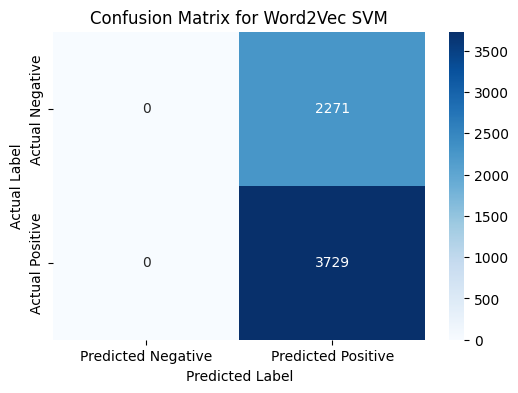

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[0,2271],[0,3729]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for Word2Vec SVM")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [ ]:
# Initialize and train Random Forest model with Word2Vec features
rf_word2vec=RandomForestClassifier(random_state=42)
rf_word2vec.fit(X_train_word2vec,y_train)

# Predictions on the testing set using Word2Vec features
y_pred_word2vec=rf_word2vec.predict(X_test_word2vec)

# Calculate evaluation metrics for Word2Vec features
accuracy_word2vec=accuracy_score(y_test,y_pred_word2vec)
precision_word2vec=precision_score(y_test,y_pred_word2vec)
recall_word2vec=recall_score(y_test,y_pred_word2vec)
f1_word2vec=f1_score(y_test,y_pred_word2vec)
conf_matrix_word2vec=confusion_matrix(y_test,y_pred_word2vec)

# Print the evaluation metrics for Word2Vec features
print("Accuracy (Word2Vec):",accuracy_word2vec)
print("Precision (Word2Vec):",precision_word2vec)
print("Recall (Word2Vec):",recall_word2vec)
print("F1 Score (Word2Vec):",f1_word2vec)
print("\nConfusion Matrix (Word2Vec):\n",conf_matrix_word2vec)

Accuracy (Word2Vec): 0.7336448598130841
Precision (Word2Vec): 0.7467532467532467
Recall (Word2Vec): 0.8646616541353384
F1 Score (Word2Vec): 0.8013937282229966

Confusion Matrix (Word2Vec):
[[1177 1093]
 [ 504 3226]]



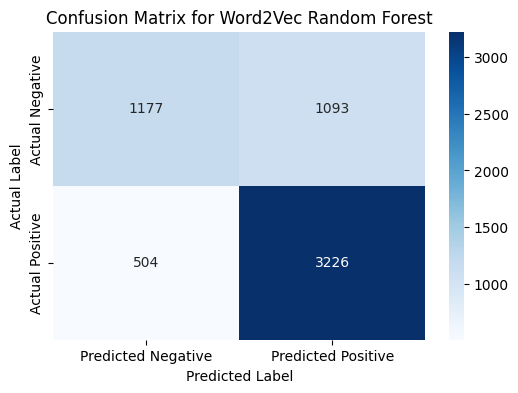

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1177,1093],[504,3226]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for Word2Vec Random Forest")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

#### POS

In [ ]:
# Function to extract POS tags from text
def pos_tags(text):
    tokens=word_tokenize(text)
    tags=pos_tag(tokens)
    return dict(tags)

In [ ]:
# Convert text data to POS tag features
X_pos=df_subset['text'].apply(pos_tags)

# Convert POS tags to numerical representation using DictVectorizer
dict_vectorizer=DictVectorizer()
X_pos_vec=dict_vectorizer.fit_transform(X_pos)

# Split the data into training and testing sets
X_train_pos,X_test_pos,y_train_pos,y_test_pos=train_test_split(X_pos_vec,y,test_size=0.2,random_state=42)

In [ ]:
# Initialize and train Logistic Regression model with POS tag features
log_pos=LogisticRegression(max_iter=1000)
log_pos.fit(X_train_pos,y_train_pos)

# Predictions on the testing set using POS tag features
y_pred_pos=log_pos.predict(X_test_pos)

# Calculate evaluation metrics for POS tag features
accuracy_pos=accuracy_score(y_test,y_pred_pos)
precision_pos=precision_score(y_test,y_pred_pos)
recall_pos=recall_score(y_test,y_pred_pos)
f1_pos=f1_score(y_test,y_pred_pos)
conf_matrix_pos=confusion_matrix(y_test,y_pred_pos)

# Print the evaluation metrics for POS tag features
print("Accuracy (POS Tags):",accuracy_pos)
print("Precision (POS Tags):",precision_pos)
print("Recall (POS Tags):",recall_pos)
print("F1 Score (POS Tags):",f1_pos)
print("\nConfusion Matrix (POS Tags):\n",conf_matrix_pos)

Accuracy (POS Tags): 0.8177570093457944
Precision (POS Tags): 0.8507462686567164
Recall (POS Tags): 0.8571428571428571
F1 Score (POS Tags): 0.8539325842696628

Confusion Matrix (POS Tags):
[[1710  560]
 [ 532 3198]]
 


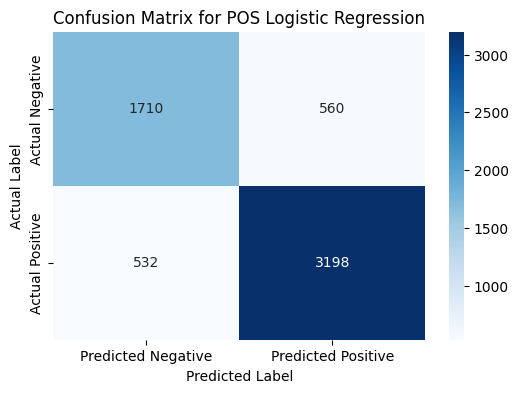

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1710,560],[532,3198]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for POS Logistic Regression")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [ ]:
# Initialize and train Naive Bayes model with POS tag features
nb_pos=MultinomialNB()
nb_pos.fit(X_train_pos,y_train_pos)

# Predictions on the testing set using POS tag features
y_pred_pos=nb_pos.predict(X_test_pos)

# Calculate evaluation metrics for POS tag features
accuracy_pos=accuracy_score(y_test,y_pred_pos)
precision_pos=precision_score(y_test,y_pred_pos)
recall_pos=recall_score(y_test,y_pred_pos)
f1_pos=f1_score(y_test,y_pred_pos)
conf_matrix_pos=confusion_matrix(y_test,y_pred_pos)

# Print the evaluation metrics for POS tag features
print("Accuracy (POS Tags):",accuracy_pos)
print("Precision (POS Tags):",precision_pos)
print("Recall (POS Tags):",recall_pos)
print("F1 Score (POS Tags):",f1_pos)
print("\nConfusion Matrix (POS Tags):\n",conf_matrix_pos)

Accuracy (POS Tags): 0.8551401869158879
Precision (POS Tags): 0.8445945945945946
Recall (POS Tags): 0.9398496240601504
F1 Score (POS Tags): 0.889679715302491

Confusion Matrix (POS Tags):
[[1626  644]
 [ 224 3506]]



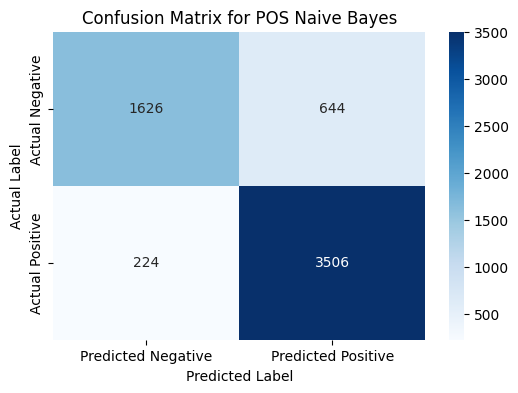

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1626,644],[224,3506]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for POS Naive Bayes")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [ ]:
# Initialize and train K_Nearest Neighbors model with POS tag features
knn_pos=KNeighborsClassifier()
knn_pos.fit(X_train_pos,y_train_pos)

# Predictions on the testing set using POS tag features
y_pred_pos=knn_pos.predict(X_test_pos)

# Calculate evaluation metrics for POS tag features
accuracy_pos=accuracy_score(y_test,y_pred_pos)
precision_pos=precision_score(y_test,y_pred_pos)
recall_pos=recall_score(y_test,y_pred_pos)
f1_pos=f1_score(y_test,y_pred_pos)
conf_matrix_pos=confusion_matrix(y_test,y_pred_pos)

# Print the evaluation metrics for POS tag features
print("Accuracy (POS Tags):",accuracy_pos)
print("Precision (POS Tags):",precision_pos)
print("Recall (POS Tags):",recall_pos)
print("F1 Score (POS Tags):",f1_pos)
print("\nConfusion Matrix (POS Tags):\n",conf_matrix_pos)

Accuracy (POS Tags): 0.6495327102803738
Precision (POS Tags): 0.6421568627450981
Recall (POS Tags): 0.9849624060150376
F1 Score (POS Tags): 0.7774480712166172

Confusion Matrix (POS Tags):
 [[ 224 2046]
 [  56 3674]]
 


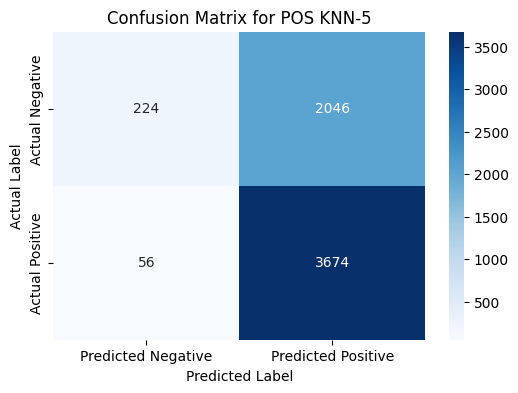

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[224,2046],[56,3674]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for POS KNN-5")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [ ]:
# Initialize and train Decision Tree model with POS tag features
dt_pos=DecisionTreeClassifier()
dt_pos.fit(X_train_pos,y_train_pos)

# Predictions on the testing set using POS tag features
y_pred_pos=dt_pos.predict(X_test_pos)

# Calculate evaluation metrics for POS tag features
accuracy_pos=accuracy_score(y_test,y_pred_pos)
precision_pos=precision_score(y_test,y_pred_pos)
recall_pos=recall_score(y_test,y_pred_pos)
f1_pos=f1_score(y_test,y_pred_pos)
conf_matrix_pos=confusion_matrix(y_test,y_pred_pos)

# Print the evaluation metrics for POS tag features
print("Accuracy (POS Tags):",accuracy_pos)
print("Precision (POS Tags):",precision_pos)
print("Recall (POS Tags):",recall_pos)
print("F1 Score (POS Tags):",f1_pos)
print("\nConfusion Matrix (POS Tags):\n",conf_matrix_pos)

Accuracy (POS Tags): 0.7102803738317757
Precision (POS Tags): 0.7886178861788617
Recall (POS Tags): 0.7293233082706767
F1 Score (POS Tags): 0.7578125

Confusion Matrix (POS Tags):
[[1542  728]
 [1009 2721]]



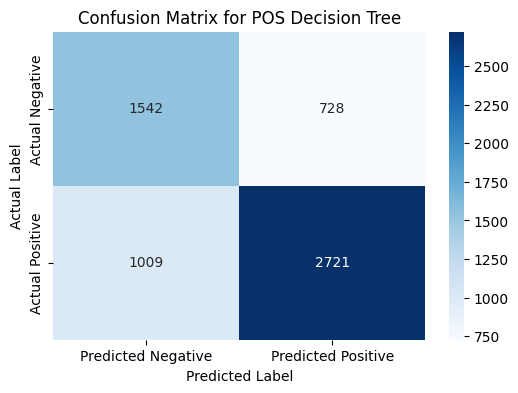

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1542,728],[1009,2721]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for POS Decision Tree")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [ ]:
# Initialize and train Support Vector model with POS tag features
svc_pos=SVC()
svc_pos.fit(X_train_pos,y_train_pos)

# Predictions on the testing set using POS tag features
y_pred_pos=svc_pos.predict(X_test_pos)

# Calculate evaluation metrics for POS tag features
accuracy_pos=accuracy_score(y_test,y_pred_pos)
precision_pos=precision_score(y_test,y_pred_pos)
recall_pos=recall_score(y_test,y_pred_pos)
f1_pos=f1_score(y_test,y_pred_pos)
conf_matrix_pos=confusion_matrix(y_test,y_pred_pos)

# Print the evaluation metrics for POS tag features
print("Accuracy (POS Tags):",accuracy_pos)
print("Precision (POS Tags):",precision_pos)
print("Recall (POS Tags):",recall_pos)
print("F1 Score (POS Tags):",f1_pos)
print("\nConfusion Matrix (POS Tags):\n",conf_matrix_pos)

Accuracy (POS Tags): 0.8457943925233645
Precision (POS Tags): 0.8571428571428571
Recall (POS Tags): 0.9022556390977443
F1 Score (POS Tags): 0.879120879120879

Confusion Matrix (POS Tags):
 [[1710  560]
 [ 364 3366]]
 


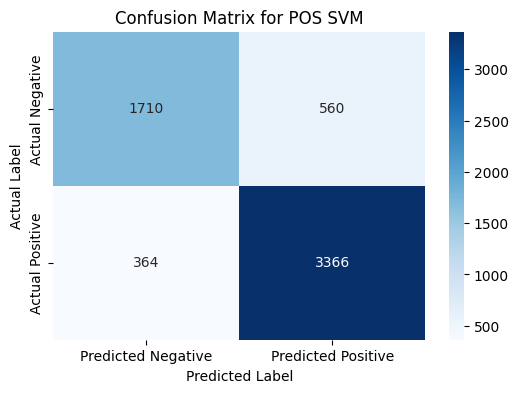

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1710,560],[364,3366]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for POS SVM")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [ ]:
# Initialize and train Random Forest model with POS tag features
rf_pos=RandomForestClassifier()
rf_pos.fit(X_train_pos,y_train_pos)

# Predictions on the testing set using POS tag features
y_pred_pos=rf_pos.predict(X_test_pos)

# Calculate evaluation metrics for POS tag features
accuracy_pos=accuracy_score(y_test,y_pred_pos)
precision_pos=precision_score(y_test,y_pred_pos)
recall_pos=recall_score(y_test,y_pred_pos)
f1_pos=f1_score(y_test,y_pred_pos)
conf_matrix_pos=confusion_matrix(y_test,y_pred_pos)

# Print the evaluation metrics for POS tag features
print("Accuracy (POS Tags):",accuracy_pos)
print("Precision (POS Tags):",precision_pos)
print("Recall (POS Tags):",recall_pos)
print("F1 Score (POS Tags):",f1_pos)
print("\nConfusion Matrix (POS Tags):\n",conf_matrix_pos)

Accuracy (POS Tags): 0.7897196261682243
Precision (POS Tags): 0.7650602409638554
Recall (POS Tags): 0.9548872180451128
F1 Score (POS Tags): 0.8494983277591973

Confusion Matrix (POS Tags):
[[1177 1093]
 [ 168 3562]]



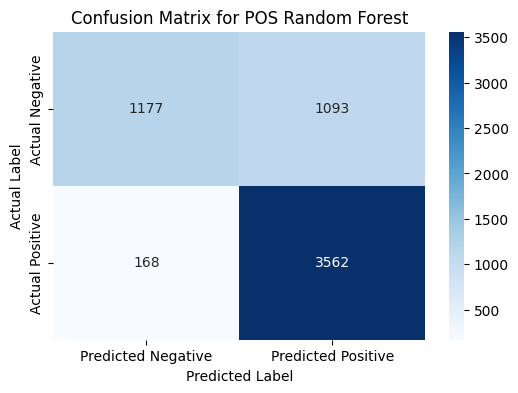

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1177,1093],[168,3562]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for POS Random Forest")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

#### BERT

In [ ]:
# Load the 'sentiment-analysis' pipeline
classifier=pipeline("sentiment-analysis")

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


In [ ]:
# Truncate each sentence to the maximum length (512 tokens) and predict the sentiment
predictions=[]
for text in X:
    # Truncate the text if its length exceeds 512 tokens
    truncated_text=text[:512]
    # Predict the sentiment using the 'sentiment-analysis' pipeline
    prediction=classifier(truncated_text)[0]
    predictions.append(prediction)

In [ ]:
# Extract predicted labels ('LABEL') from the predictions
predicted_labels=[prediction['label'] for prediction in predictions]
# Map predicted labels to numerical values
label_map={"NEGATIVE": 0,"POSITIVE": 1}
predicted_labels_numeric=[label_map[label] for label in predicted_labels]

In [ ]:
# Filter true labels (y) to match the number of samples in the predictions
y_true_filtered=y[:len(predicted_labels_numeric)]

In [ ]:
# Calculate evaluation metrics
accuracy_bert=accuracy_score(y_true_filtered,predicted_labels_numeric)
precision_bert=precision_score(y_true_filtered,predicted_labels_numeric)
recall_bert=recall_score(y_true_filtered,predicted_labels_numeric)
f1_bert=f1_score(y_true_filtered,predicted_labels_numeric)
conf_matrix_bert=confusion_matrix(y_true_filtered,predicted_labels_numeric)

# Print the evaluation metrics
print("Accuracy (BERT w/o FT):",accuracy_bert)
print("Precision (BERT w/o FT):",precision_bert)
print("Recall (BERT w/o FT):",recall_bert)
print("F1 Score (BERT w/o FT):",f1_bert)
print("\nConfusion Matrix (BERT w/o FT):\n",conf_matrix_bert)

Accuracy (BERT w/o FT): 0.8205607476635514
Precision (BERT w/o FT): 0.9032815198618307
Recall (BERT w/o FT): 0.7936267071320182
F1 Score (BERT w/o FT): 0.8449111470113085

Confusion Matrix (BERT w/o FT):
[[1990  314]
 [ 762 2934]]



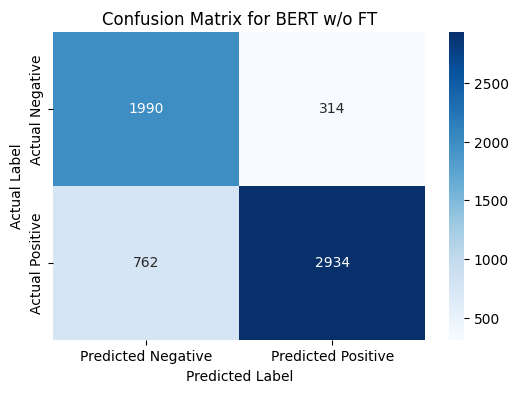

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1990,314],[762,2934]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for BERT w/o FT")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

#### BERT FT

In [ ]:
# Load pre-trained BERT tokenizer and model
tokenizer=BertTokenizer.from_pretrained('bert-base-uncased')

In [ ]:
bert_ft_model=BertForSequenceClassification.from_pretrained('bert-base-uncased')

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# Tokenize input text and convert to input tensors
inputs=tokenizer(df_subset['text'].tolist(),padding=True,truncation=True,return_tensors='pt')
labels=torch.tensor(df_subset['Label'].tolist())

In [ ]:
# Split each tensor in inputs
input_ids=inputs['input_ids']
attention_mask=inputs['attention_mask']
token_type_ids=inputs['token_type_ids']

In [ ]:
# Split data into training and validation sets
train_input_ids,val_input_ids,train_attention_mask,val_attention_mask,train_token_type_ids,val_token_type_ids,train_labels,val_labels=train_test_split(
    input_ids,attention_mask,token_type_ids,labels,test_size=0.2,random_state=42)

In [ ]:
# Combine the split tensors into inputs for training and validation
train_inputs={'input_ids': train_input_ids,'attention_mask': train_attention_mask,'token_type_ids': train_token_type_ids}
val_inputs={'input_ids': val_input_ids,'attention_mask': val_attention_mask,'token_type_ids': val_token_type_ids}

In [ ]:
# Create DataLoader for training and validation sets
train_dataset=TensorDataset(train_inputs['input_ids'],train_inputs['attention_mask'],train_labels)
val_dataset=TensorDataset(val_inputs['input_ids'],val_inputs['attention_mask'],val_labels)
train_loader=DataLoader(train_dataset,batch_size=16,shuffle=True)
val_loader=DataLoader(val_dataset,batch_size=16)

In [ ]:
# Define optimizer and loss function
optimizer=torch.optim.AdamW(bert_ft_model.parameters(),lr=2e-5)
loss_fn=torch.nn.CrossEntropyLoss()

In [ ]:
# Training loop
epochs=1
for epoch in range(epochs):
    bert_ft_model.train()
    for batch in train_loader:
        optimizer.zero_grad()
        input_ids,attention_mask,labels=batch
        outputs=bert_ft_model(input_ids,attention_mask=attention_mask,labels=labels)
        loss=outputs.loss
        loss.backward()
        optimizer.step()

    # Evaluation on validation set
    bert_ft_model.eval()
    val_loss=0
    correct=0
    total=0
    with torch.no_grad():
        for batch in val_loader:
            input_ids,attention_mask,labels=batch
            outputs=bert_ft_model(input_ids,attention_mask=attention_mask)
            logits=outputs.logits
            val_loss +=loss_fn(logits,labels).item()
            _,predicted=torch.max(logits,1)
            total +=labels.size(0)
            correct +=(predicted==labels).sum().item()

    val_loss /=len(val_loader)
    accuracy=correct / total
    print(f'Epoch {epoch + 1}/{epochs},Validation Loss: {val_loss:.4f},Validation Accuracy: {accuracy:.4f}')

In [ ]:
# Initialize lists to store true labels and predicted labels
true_labels=[]
predicted_labels=[]

In [ ]:
# Evaluation on validation set
bert_ft_model.eval()
with torch.no_grad():
    for batch in val_loader:
        input_ids,attention_mask,labels=batch
        outputs=bert_ft_model(input_ids,attention_mask=attention_mask)
        logits=outputs.logits
        _,predicted=torch.max(logits,1)

        # Convert tensors to numpy arrays and append to lists
        true_labels.extend(labels.cpu().numpy())
        predicted_labels.extend(predicted.cpu().numpy())

In [ ]:
# Convert lists to numpy arrays
true_labels=np.array(true_labels)
predicted_labels=np.array(predicted_labels)

In [ ]:
# Calculate evaluation metrics
accuracy_bert_ft=accuracy_score(true_labels,predicted_labels)
precision_bert_ft=precision_score(true_labels,predicted_labels)
recall_bert_ft=recall_score(true_labels,predicted_labels)
f1_bert_ft=f1_score(true_labels,predicted_labels)
conf_matrix_bert_ft=confusion_matrix(true_labels,predicted_labels)

# Print the evaluation metrics
print("Accuracy (BERT w/ FT):",accuracy_bert_ft)
print("Precision (BERT w/ FT):",precision_bert_ft)
print("Recall (BERT w/ FT):",recall_bert_ft)
print("F1-Score (BERT w/ FT):",f1_bert_ft)
print("Confusion Matrix (BERT w/ FT):")
print(conf_matrix_bert_ft)

Accuracy (BERT w/ FT): 0.8364485981308412
Precision (BERT w/ FT): 0.9537037037037037
Recall (BERT w/ FT): 0.7744360902255639
F1-Score (BERT w/ FT): 0.8547717842323651
Confusion Matrix (BERT w/ FT):
[[2130  140]
 [ 841 2889]]



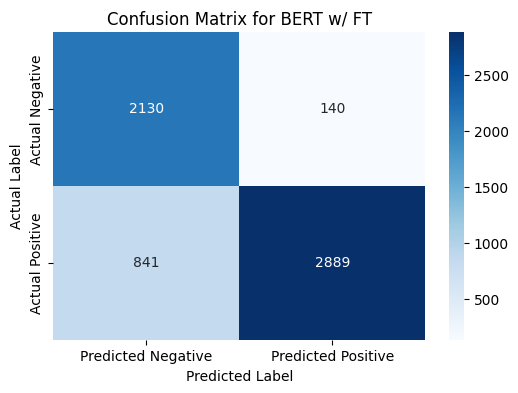

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2130,140],[841,2889]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for BERT w/ FT")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

#### BERT Lora

In [ ]:
bert_model=BertForSequenceClassification.from_pretrained('bert-base-uncased',num_labels=2).to(device)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# Define the LoRA configuration
lora_config=LoraConfig(
    task_type="Text_Classification",
    r=2,
    lora_alpha=1,
    lora_dropout=0.05,
    bias="none"
)

In [ ]:
lora_model=get_peft_model(bert_model,lora_config)

In [ ]:
train_encodings=tokenizer(X_train.tolist(),truncation=True,padding=True)
test_encodings=tokenizer(X_test.tolist(),truncation=True,padding=True)

In [ ]:
class BERT_Lora(torch.utils.data.Dataset):
    def __init__(self,encodings,labels):
        self.encodings=encodings
        self.labels=labels

    def __getitem__(self,idx):
        item={key: torch.tensor(val[idx]) for key,val in self.encodings.items()}
        item['labels']=torch.tensor(self.labels[idx])
        return item

    def __len__(self):
        return len(self.labels)

In [ ]:
train=BERT_Lora(train_encodings,y_train.tolist())
test=BERT_Lora(test_encodings,y_test.tolist())

In [ ]:
# Fine-tuning parameters
output_dir="./output"
training_args=TrainingArguments(
    output_dir=output_dir,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=10,
    evaluation_strategy='epoch',
    # eval_steps=500,
    logging_dir='./logs',
    logging_steps=100,
    load_best_model_at_end=True,
    metric_for_best_model='accuracy',
    num_train_epochs=20,
    save_strategy='epoch'
    )

In [ ]:
trainer=Trainer(
    model=bert_model,
    args=training_args,
    train_dataset=train,
    eval_dataset=test,
    compute_metrics=lambda pred: {"accuracy": accuracy_score(pred.label_ids,pred.predictions.argmax(-1))}
)

In [ ]:
trainer.train()

predictions=trainer.predict(test)
pred_labels=predictions.predictions.argmax(-1)

In [ ]:
# Evaluate the metrics
accuracy_lora=accuracy_score(y_test.tolist(),pred_labels)
precision_lora=precision_score(y_test.tolist(),pred_labels)
recall_lora=recall_score(y_test.tolist(),pred_labels)
f1_lora=f1_score(y_test.tolist(),pred_labels)
conf_matrix_lora=confusion_matrix(y_test.tolist(),pred_labels)

# Print the evaluation metrics
print("Accuracy (BERT w/ LoRA):",accuracy_lora)
print("Precision (BERT w/ LoRA):",precision_lora)
print("Recall (BERT w/ LoRA):",recall_lora)
print("F1-Score (BERT w/ LoRA):",f1_lora)
print("\nConfusion Matrix (BERT w/ LoRA):\n")
print(conf_matrix_lora)

Accuracy (BERT w/ LoRA): 0.883177570093458
Precision (BERT w/ LoRA): 0.9090909090909091
Recall (BERT w/ LoRA): 0.9022556390977443
F1-Score (BERT w/ LoRA): 0.9056603773584905

Confusion Matrix (BERT w/ LoRA):
[[1934  336]
 [ 364 3366]]



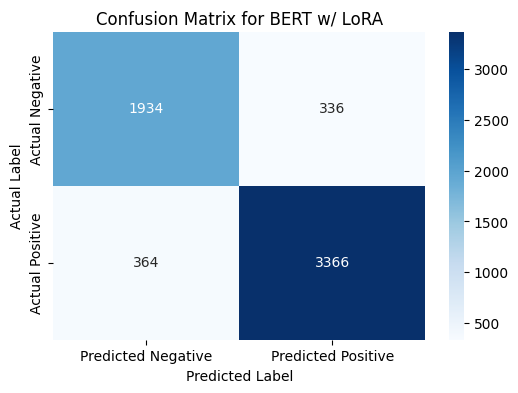

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1934,336],[364,3366]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for BERT w/ LoRA")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

#### RNN

In [ ]:
# Split the data into training and testing sets (80% train,20% test)
X_train,X_test,y_train,y_test=train_test_split(df_subset['text'],df_subset['Label'],test_size=0.2,random_state=42)

In [ ]:
# Tokenize the text data
tokenizer=Tokenizer()
tokenizer.fit_on_texts(X_train)

# Convert text to sequences of integers
X_train_seq=tokenizer.texts_to_sequences(X_train)
X_test_seq=tokenizer.texts_to_sequences(X_test)

# Pad sequences
X_train_padded=sequence.pad_sequences(X_train_seq,maxlen=max_words)
X_test_padded=sequence.pad_sequences(X_test_seq,maxlen=max_words)

In [ ]:
max_words=500
X_train=sequence.pad_sequences(X_train_padded,maxlen=max_words)
X_test=sequence.pad_sequences(X_test_padded,maxlen=max_words)

In [ ]:
vocabulary_size=20000

In [ ]:
embedding_size=32
model=Sequential()
model.add(Embedding(vocabulary_size,embedding_size,input_length=max_words))
model.add(LSTM(100))
model.add(Dense(1,activation='sigmoid'))
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 500, 32)           640000    
                                                                 
 lstm_1 (LSTM)               (None, 100)               53200     
                                                                 
 dense_1 (Dense)             (None, 1)                 101       
                                                                 
Total params: 693301 (2.64 MB)
Trainable params: 693301 (2.64 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
model.compile(loss='binary_crossentropy',
             optimizer='adam',
             metrics=['accuracy'])

In [ ]:
batch_size=64
num_epochs=10

In [ ]:
X_valid,y_valid=X_train[:batch_size],y_train[:batch_size]
X_train2,y_train2=X_train[batch_size:],y_train[batch_size:]
model.fit(X_train2,y_train2,validation_data=(X_valid,y_valid),batch_size=batch_size,epochs=num_epochs)

In [ ]:
scores=model.evaluate(X_test,y_test,verbose=0)
print('Test accuracy:',scores[1])

Test accuracy: 0.827102780342102


In [ ]:
# Predict probabilities for test set
y_pred_proba=model.predict(X_test)

# Convert probabilities to binary predictions
y_pred=(y_pred_proba > 0.5).astype(int)

# Calculate accuracy
accuracy=accuracy_score(y_test,y_pred)
print('Test accuracy:',accuracy)

# Calculate precision
precision=precision_score(y_test,y_pred)
print('Precision:',precision)

# Calculate recall
recall=recall_score(y_test,y_pred)
print('Recall:',recall)

# Calculate F1-score
f1=f1_score(y_test,y_pred)
print('F1-score:',f1)

# Generate confusion matrix
conf_matrix=confusion_matrix(y_test,y_pred)
print('\nConfusion Matrix:')
print(conf_matrix)

Test accuracy: 0.8271028037383178
Precision: 0.8809523809523809
Recall: 0.8345864661654135
F1-score: 0.8571428571428571

Confusion Matrix:
[[1850  420]
 [ 616 3114]]



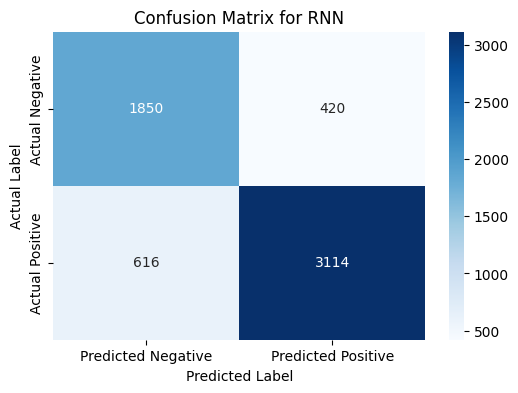

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1850,420],[616,3114]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for RNN")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

#### LSTM

In [ ]:
# Create Embedding Matrix having 100 columns
# Containing 100-dimensional GloVe word embeddings for all words in our corpus.
embedding_matrix=zeros((vocab_length,100))
for word,index in word_tokenizer.word_index.items():
    embedding_vector=embeddings_dictionary.get(word)
    if embedding_vector is not None:
        embedding_matrix[index]=embedding_vector

In [ ]:
# Neural Network architecture
lstm_model=Sequential()
embedding_layer=Embedding(vocab_length,100,weights=[embedding_matrix],input_length=maxlen,trainable=False)
lstm_model.add(embedding_layer)
lstm_model.add(LSTM(128))  # Use LSTM layer instead of Flatten
lstm_model.add(Dense(1,activation='sigmoid'))

# Model compiling
lstm_model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
print(lstm_model.summary())

# Model training
lstm_model_history=lstm_model.fit(X_train,y_train,batch_size=128,epochs=25,verbose=1,validation_split=0.2)

In [ ]:
# Tokenize the data
max_words=10000
max_len=100  # Adjust this parameter to match the maximum length of your original sequences
tokenizer=Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(X_train)

In [ ]:
X_train=tokenizer.texts_to_sequences(X_train)
X_test=tokenizer.texts_to_sequences(X_test)
X_val=tokenizer.texts_to_sequences(X_val)

X_train=pad_sequences(X_train,maxlen=max_len)  # Use the correct max_len value here
X_test=pad_sequences(X_test,maxlen=max_len)    # Use the correct max_len value here
X_val=pad_sequences(X_val,maxlen=max_len)      # Use the correct max_len value here

In [ ]:
# Create the model
model=Sequential()
model.add(Embedding(max_words,128,input_length=max_len))
model.add(LSTM(64))
model.add(Dropout(0.5))
model.add(Dense(2,activation='softmax'))

# Compile the model
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

# Set up early stopping
early_stop=EarlyStopping(monitor='val_loss',patience=5,restore_best_weights=True)

# Train the model
history=model.fit(X_train,to_categorical(y_train),validation_data=(X_val,to_categorical(y_val)),
                    epochs=10,batch_size=128,callbacks=[early_stop])

# Evaluate the model
loss,accuracy=model.evaluate(X_test,to_categorical(y_test))

print("Test accuracy:",accuracy)

Test accuracy: 0.8317757248878479


In [ ]:
# Predict probabilities for each class
y_pred_probs=model.predict(X_test)

# Convert probabilities to class labels
y_pred=np.argmax(y_pred_probs,axis=1)

# Convert one-hot encoded y_test back to categorical labels
y_test_cat=np.argmax(to_categorical(y_test),axis=1)

In [ ]:
# Calculate precision,recall,f1-score,and confusion matrix
acccuracy=accuracy_score(y_test_cat,y_pred)
precision=precision_score(y_test_cat,y_pred)
recall=recall_score(y_test_cat,y_pred)
f1=f1_score(y_test_cat,y_pred)
conf_matrix=confusion_matrix(y_test_cat,y_pred)

print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1-score:",f1)
print("\nConfusion Matrix:")
print(conf_matrix)

Accuracy: 0.8317757248878479
Precision: 0.8909090909090909
Recall: 0.8032786885245902
F1-score: 0.8448275862068965

Confusion Matrix:
[[2242  336]
 [ 672 2750]]



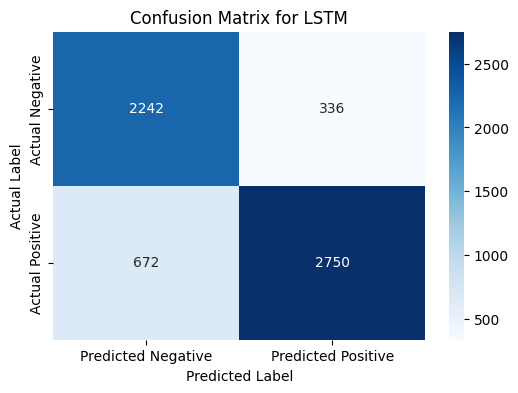

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2242,336],[672,2750]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for LSTM")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

#### GRU

In [ ]:
# Split into train,test and validation sets
X_train,X_val_test,y_train,y_val_test=train_test_split(df_subset['text'],df_subset['Label'],test_size=0.2,random_state=42)
X_test,X_val,y_test,y_val=train_test_split(X_val_test,y_val_test,test_size=0.5,random_state=42)

In [ ]:
# Tokenize the data
max_words=10000
max_len=100
tokenizer=Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(X_train)

In [ ]:
X_train=tokenizer.texts_to_sequences(X_train)
X_test=tokenizer.texts_to_sequences(X_test)
X_val=tokenizer.texts_to_sequences(X_val)

X_train=pad_sequences(X_train,maxlen=max_len)
X_test=pad_sequences(X_test,maxlen=max_len)
X_val=pad_sequences(X_val,maxlen=max_len)

In [ ]:
# Create the model
model=Sequential()
model.add(Embedding(max_words,128,input_length=max_len))
model.add(GRU(64))
model.add(Dropout(0.5))
model.add(Dense(2,activation='softmax'))

# Compile the model
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

# Set up early stopping
early_stop=EarlyStopping(monitor='val_loss',patience=5,restore_best_weights=True)

# Train the model
history=model.fit(X_train,to_categorical(y_train),validation_data=(X_val,to_categorical(y_val)),
                    epochs=25,batch_size=128,callbacks=[early_stop])

# Evaluate the model
loss,accuracy=model.evaluate(X_test,to_categorical(y_test))

print("Test accuracy:",accuracy)

Test accuracy: 0.7476635575294495


In [ ]:
# Predict probabilities for each class
y_pred_probs=model.predict(X_test)

# Convert probabilities to class labels
y_pred=np.argmax(y_pred_probs,axis=1)

# Convert one-hot encoded y_test back to categorical labels
y_test_cat=np.argmax(to_categorical(y_test),axis=1)

In [ ]:
# Calculate precision,recall,f1-score,and confusion matrix
acccuracy=accuracy_score(y_test_cat,y_pred)
precision=precision_score(y_test_cat,y_pred)
recall=recall_score(y_test_cat,y_pred)
f1=f1_score(y_test_cat,y_pred)
conf_matrix=confusion_matrix(y_test_cat,y_pred)

print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1-score:",f1)
print("\nConfusion Matrix:")
print(conf_matrix)

Accuracy: 0.7476635575294495
Precision: 0.7833333333333333
Recall: 0.7704918032786885
F1-score: 0.7768595041322314

Confusion Matrix:
[[1850  728]
 [ 785 2637]]
 


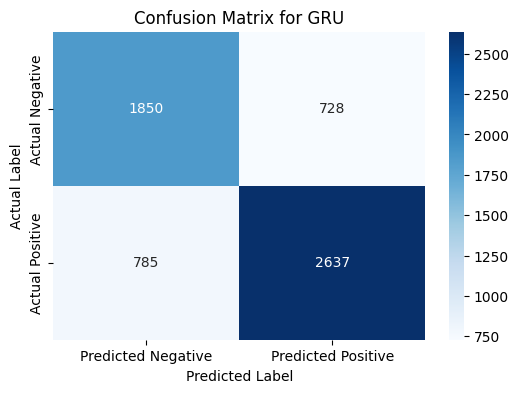

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1850,728],[785,2637]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for GRU")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

#### Bi-LSTM with Attention

In [ ]:
# Split the data into training and testing sets (80% train,20% test)
X_train,X_test,y_train,y_test=train_test_split(df_subset['text'],df_subset['Label'],test_size=0.2,random_state=42)

In [ ]:
max_features=6000
embed_size=128
rnn_cell_size=32
max_len=60

In [ ]:
tokenizer=Tokenizer(num_words=max_features)
tokenizer.fit_on_texts(X_train)
list_tokenized_train=tokenizer.texts_to_sequences(X_train)
X_train=pad_sequences(list_tokenized_train,maxlen=max_len)

In [ ]:
class Attention(tf.keras.Model):
    def __init__(self,units):
        super(Attention,self).__init__()
        self.W1=tf.keras.layers.Dense(units)
        self.W2=tf.keras.layers.Dense(units)
        self.V=tf.keras.layers.Dense(1)

    def call(self,features,hidden):
        hidden_with_time_axis=tf.expand_dims(hidden,1)
        score=tf.nn.tanh(
            self.W1(features) + self.W2(hidden_with_time_axis))

        attention_weights=tf.nn.softmax(self.V(score),axis=1)
        context_vector=attention_weights * features
        context_vector=tf.reduce_sum(context_vector,axis=1)

        return context_vector,attention_weights

In [ ]:
sequence_input=Input(shape=(max_len,),dtype="int32")
embedded_sequences=Embedding(max_features,embed_size)(sequence_input)

In [ ]:
lstm=Bidirectional(LSTM(rnn_cell_size,return_sequences=True),name="bi_lstm_0")(embedded_sequences)
# Getting our LSTM outputs
(lstm,forward_h,forward_c,backward_h,backward_c)=Bidirectional(LSTM(rnn_cell_size,return_sequences=True,return_state=True),name="bi_lstm_1")(lstm)

In [ ]:
state_h=Concatenate()([forward_h,backward_h])
state_c=Concatenate()([forward_c,backward_c])
context_vector,attention_weights=Attention(10)(lstm,state_h)
dense1=Dense(20,activation="relu")(context_vector)
dropout=Dropout(0.05)(dense1)
output=Dense(1,activation="sigmoid")(dropout)
model=keras.Model(inputs=sequence_input,outputs=output)

In [ ]:
metrics=[
      keras.metrics.TruePositives(name='tp'),
      keras.metrics.FalsePositives(name='fp'),
      keras.metrics.TrueNegatives(name='tn'),
      keras.metrics.FalseNegatives(name='fn'),
      keras.metrics.BinaryAccuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='auc'),
]
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=metrics)

In [ ]:
batch_size=100
epochs=5
history=model.fit(X_train,y_train,
                    batch_size=batch_size,
                    epochs=epochs,
                    validation_split=0.2)

In [ ]:
# Preprocess the test data
list_tokenized_test=tokenizer.texts_to_sequences(X_test)
X_test_padded=pad_sequences(list_tokenized_test,maxlen=max_len)

# Predict labels for the test data
y_pred=model.predict(X_test_padded)

# Convert probabilities to binary labels (0 or 1) based on a threshold (e.g.,0.5)
y_pred_binary=(y_pred > 0.5).astype(int)

In [ ]:
# Flatten the true and predicted labels for binary classification
y_test_flat=y_test.ravel()
y_pred_flat=y_pred_binary.ravel()

In [ ]:
# Calculate metrics
accuracy=accuracy_score(y_test_flat,y_pred_flat)
precision=precision_score(y_test_flat,y_pred_flat)
recall=recall_score(y_test_flat,y_pred_flat)
f1=f1_score(y_test_flat,y_pred_flat)
conf_matrix=confusion_matrix(y_test_flat,y_pred_flat)

# Print the metrics
print("Testing Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1-score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Testing Accuracy: 0.8364485981308412
Precision: 0.8769230769230769
Recall: 0.8571428571428571
F1-score: 0.8669201520912547

Confusion Matrix:
[[1822  448]
 [ 532 3198]]



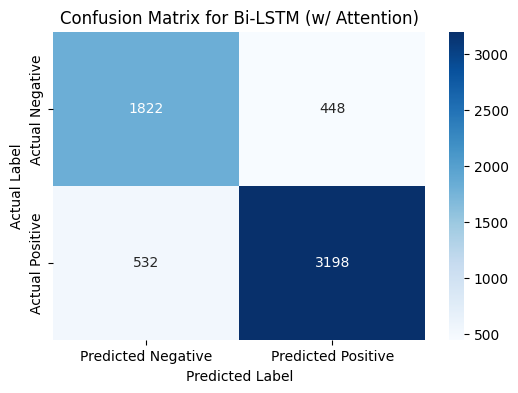

In [ ]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[1822,448],[532,3198]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for Bi-LSTM (w/ Attention)")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

#### Graph Based ML Models

In [ ]:
graph=nx.Graph()

def add_edges(text,window_size):
  words=text.split()
  for i in range(len(words) - window_size + 1):
    window=words[i : i + window_size]
    for word1,word2 in combinations(window,2):
      if graph.has_edge(word1,word2):
        graph[word1][word2]["weight"] +=1
      else:
        graph.add_edge(word1,word2,weight=1)

In [ ]:
for review in df_subset['cleaned_text']:
  add_edges(review,2)

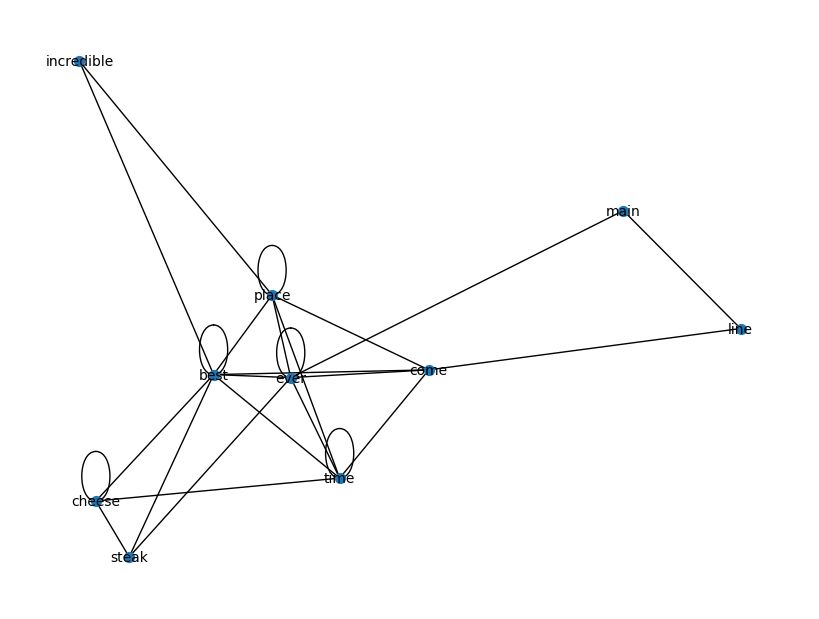

In [ ]:
plt.figure(figsize=(8,6))
nx.draw(graph.subgraph(list(graph.nodes())[:10]),with_labels=True,node_size=50,font_size=10)
plt.show()

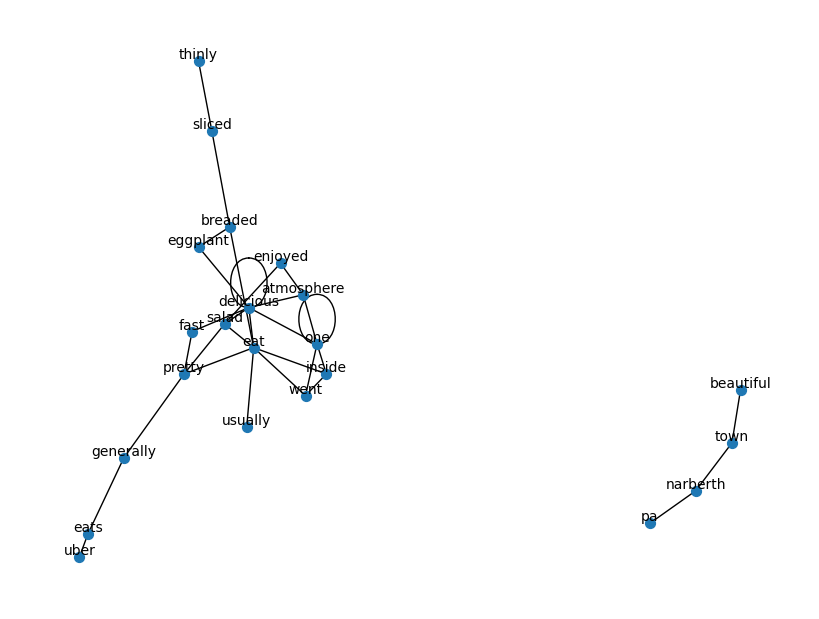

In [ ]:
plt.figure(figsize=(8,6))
nx.draw(graph.subgraph(list(graph.nodes())[20:42]),with_labels=True,node_size=50,font_size=10)
plt.show()

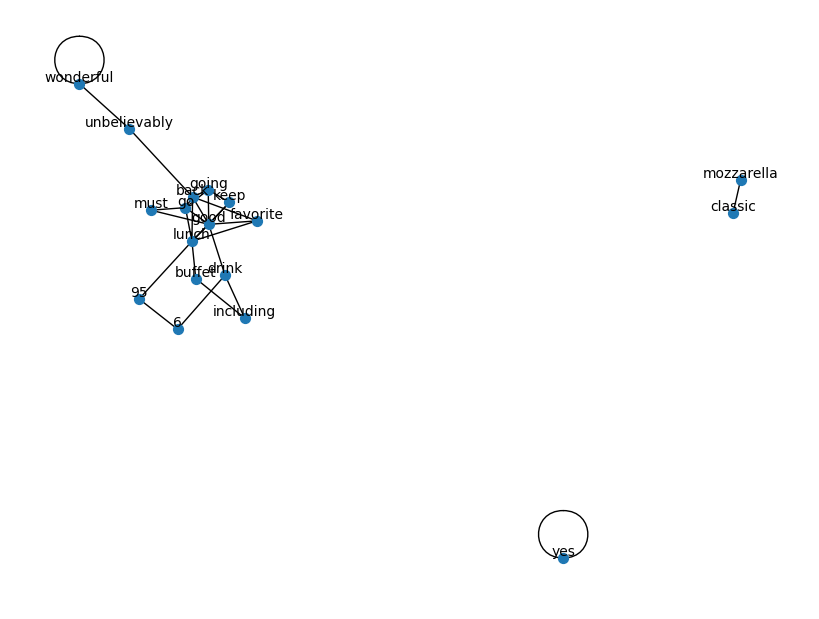

In [ ]:
plt.figure(figsize=(8,6))
nx.draw(graph.subgraph(list(graph.nodes())[62:80]),with_labels=True,node_size=50,font_size=10)
plt.show()

In [ ]:
node2vec=Node2Vec(graph,dimensions=64,walk_length=10,num_walks=100,workers=1)
model=node2vec.fit(window=10,min_count=1,batch_words=4)
node_embeddings={node: model.wv[node] for node in graph.nodes()}

In [ ]:
def get_avg_embedding(text):
  default_vector=np.zeros(64)
  word_embeddings=np.array([node_embeddings.get(word,default_vector) for word in text.split()])
  avg_embedding=np.mean(word_embeddings,axis=0)
  return avg_embedding

feature_matrix=[]
for review in df_subset['cleaned_text']:
  feature_embedding=get_avg_embedding(review)
  feature_matrix.append(feature_embedding)

feature_matrix=np.stack(feature_matrix.values)

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(feature_matrix,df_subset['Label'],test_size=0.2,random_state=42)

In [1]:
# Initialize and train Logistic Regression model
log=LogisticRegression(max_iter=1000)
log.fit(X_train,y_train)

# Predictions on the testing set
y_pred=log.predict(X_test)

# Calculate evaluation metrics
accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

# Print the evaluation metrics
print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Accuracy: 0.8977556109725686
Precision: 0.9206349206349206
Recall: 0.87
F1 Score: 0.8946015424164524

Confusion Matrix:
[[2783  224]
 [ 389 2604]]


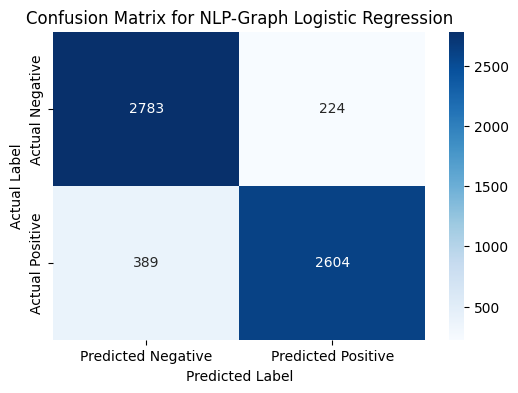

In [6]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2783,224],[389,2604]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph Logistic Regression")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [7]:
# Initialize and train Naive Bayes model
gnb=GaussianNB()
gnb.fit(X_train,y_train)

# Predictions on the testing set
y_pred=gnb.predict(X_test)

# Calculate evaluation metrics
accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

# Print the evaluation metrics
print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Accuracy: 0.8703241895261845
Precision: 0.8775510204081632
Recall: 0.86
F1 Score: 0.8686868686868686

Confusion Matrix:
[[2648  359]
 [ 418 2575]]



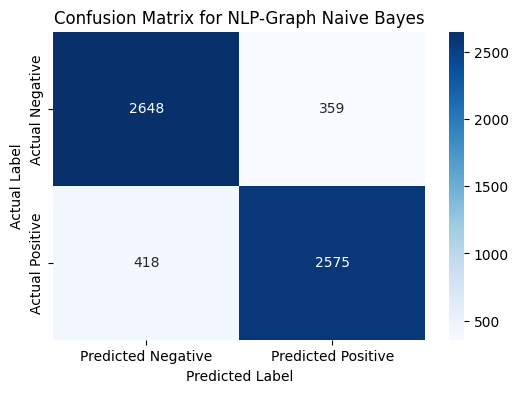

In [8]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2648,359],[418,2575]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph Naive Bayes")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [10]:
# Initialize and train KNN model
knn=KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train,y_train)

# Predictions on the testing set
y_pred=knn.predict(X_test)

# Calculate evaluation metrics
accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

# Print the evaluation metrics
print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Accuracy: 0.8553615960099751
Precision: 0.8480392156862745
Recall: 0.865
F1 Score: 0.8564356435643564

Confusion Matrix:
[[2543  463]
 [ 403 2591]]


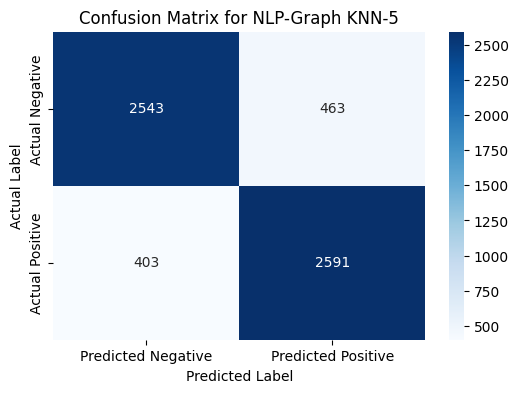

In [11]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2543,463],[403,2591]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph KNN-5")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [13]:
# Initialize and train Decision Tree model
dt=DecisionTreeClassifier(random_state=42)
dt.fit(X_train,y_train)

# Predictions on the testing set
y_pred=dt.predict(X_test)

# Calculate evaluation metrics
accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

# Print the evaluation metrics
print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Accuracy: 0.7506234413965087
Precision: 0.7525252525252525
Recall: 0.745
F1 Score: 0.7487437185929648

Confusion Matrix:
[[2274  733]
 [ 763 2230]]



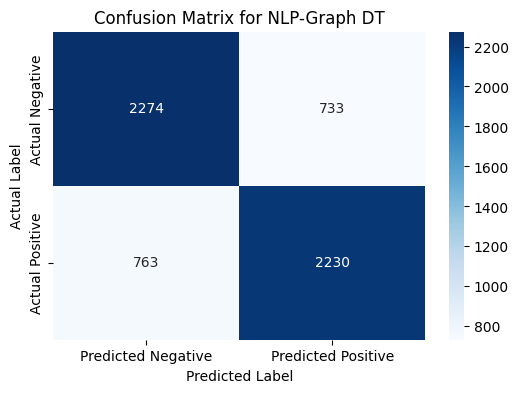

In [12]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2274,733],[763,2230]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph DT")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [15]:
# Initialize and train Support Vector model
svc=SVC(probability=True,random_state=42)
svc.fit(X_train,y_train)

# Predictions on the testing set
y_pred=svc.predict(X_test)

# Calculate evaluation metrics
accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

# Print the evaluation metrics
print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Accuracy: 0.8927680798004988
Precision: 0.9197860962566845
Recall: 0.86
F1 Score: 0.8888888888888888

Confusion Matrix:
[[2783  224]
 [ 418 2575]]
 


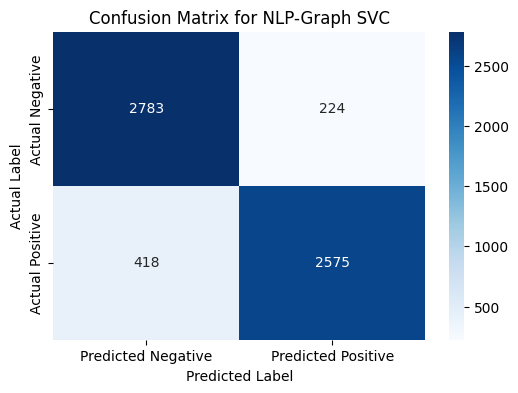

In [16]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2783,224],[418,2575]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph SVC")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [18]:
# Initialize and train Random Forest model
rf=RandomForestClassifier(random_state=42)
rf.fit(X_train,y_train)

# Predictions on the testing set
y_pred=rf.predict(X_test)

# Calculate evaluation metrics
accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

# Print the evaluation metrics
print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)


Accuracy: 0.8653366583541147
Precision: 0.8924731182795699
Recall: 0.83
F1 Score: 0.8601036269430051

Confusion Matrix:
[[2708  299]
 [ 508 2485]]
 


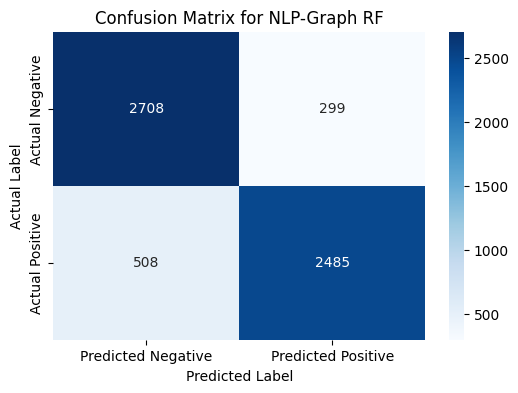

In [20]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2708,299],[508,2485]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph RF")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

#### Stacking Models

In [ ]:
# Define base models with scoring metrics
log=LogisticRegression(max_iter=1000)
svc=SVC(probability=True,random_state=42)
gnb=GaussianNB()
rf=RandomForestClassifier(random_state=42)
gc=GradientBoostingClassifier(random_state=42)

# Define a simple Voting Classifier (hard voting)
voting_clf_hard=VotingClassifier(
    estimators=[("log",log),("svc",svc),("gnb",gnb),("rf",rf)],
    voting="hard"
)

# Define a Voting Classifier with soft voting
voting_clf_soft=VotingClassifier(
    estimators=[("log",log),("svc",svc),("gnb",gnb),("rf",rf)],
    voting="soft"
)


# Define a simple Voting Classifier (hard voting)
voting_clf_log_svc_hard=VotingClassifier(
    estimators=[("log",log),("svc",svc)],
    voting="hard"
)

# Define a Voting Classifier with soft voting
voting_clf_log_svc_soft=VotingClassifier(
    estimators=[("log",log),("svc",svc)],
    voting="soft"
)


# Define a simple Voting Classifier (hard voting)
voting_clf_gnb_rf_hard=VotingClassifier(
    estimators=[("gnb",gnb),("rf",rf)],
    voting="hard"
)

# Define a Voting Classifier with soft voting
voting_clf_gnb_rf_soft=VotingClassifier(
    estimators=[("gnb",gnb),("rf",rf)],
    voting="soft"
)

# Define a Stacking Classifier with Gradient Boosting as the meta-classifier
stacking_clf_gb=StackingClassifier(
    estimators=[("log",log),("svc",svc),("gnb",gnb),("rf",rf)],
    final_estimator=gc,
    cv=5
)

# Define a Stacking Classifier with a logistic regression meta-classifier
stacking_clf_log=StackingClassifier(
    estimators=[("log",log),("svc",svc),("gnb",gnb),("rf",rf)],
    final_estimator=log,
    cv=5
)

# Define a Stacking Classifier with a support vector classifier meta-classifier
stacking_clf_svc=StackingClassifier(
    estimators=[("log",log),("svc",svc),("gnb",gnb),("rf",rf)],
    final_estimator=svc,
    cv=5
)

# Define a Stacking Classifier with a gaussian naive bayes meta-classifier
stacking_clf_gnb=StackingClassifier(
    estimators=[("log",log),("svc",svc),("gnb",gnb),("rf",rf)],
    final_estimator=gnb,
    cv=5
)

# Define a Stacking Classifier with a random forest classifier meta-classifier
stacking_clf_rf=StackingClassifier(
    estimators=[("log",log),("svc",svc),("gnb",gnb),("rf",rf)],
    final_estimator=rf,
    cv=5
)

In [23]:
voting_clf_hard.fit(X_train,y_train)
y_pred=voting_clf_hard.predict(X_test)

accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Accuracy: 0.885286783042394
Precision: 0.9230769230769231
Recall: 0.84
F1 Score: 0.8795811518324608

Confusion Matrix:
 [[2798  209]
 [ 478 2515]]
 


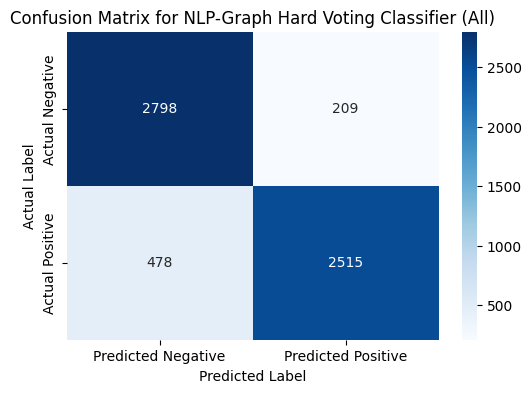

In [21]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2798,209],[478,2515]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph Hard Voting Classifier (All)")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [24]:
voting_clf_soft.fit(X_train,y_train)
y_pred=voting_clf_soft.predict(X_test)

accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Accuracy: 0.885286783042394
Precision: 0.9052631578947369
Recall: 0.86
F1 Score: 0.8820512820512821

Confusion Matrix:
[[2738  269]
 [ 418 2575]]
 


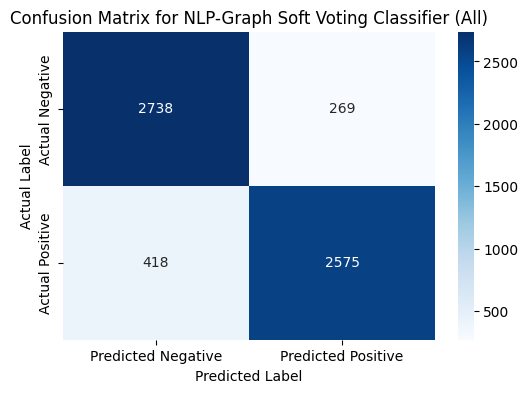

In [25]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2738,269],[418,2575]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph Soft Voting Classifier (All)")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [26]:
voting_clf_log_svc_hard.fit(X_train,y_train)
y_pred=voting_clf_log_svc_hard.predict(X_test)

accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Accuracy: 0.8952618453865336
Precision: 0.9293478260869565
Recall: 0.855
F1 Score: 0.890625

Confusion Matrix:
[[2812  194]
 [ 433 2561]]
 


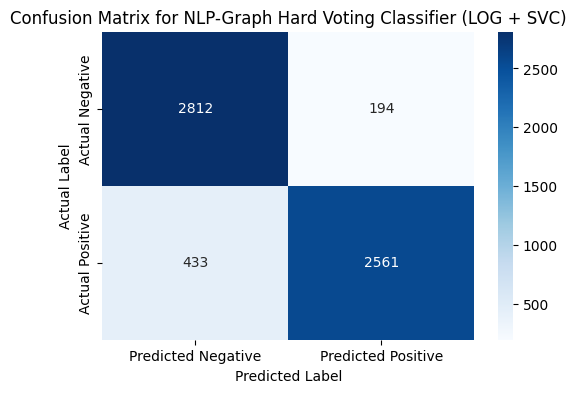

In [28]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2812,194],[433,2561]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph Hard Voting Classifier (LOG + SVC)")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [29]:
voting_clf_log_svc_soft.fit(X_train,y_train)
y_pred=voting_clf_log_svc_soft.predict(X_test)

accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Accuracy: 0.8977556109725686
Precision: 0.9251336898395722
Recall: 0.865
F1 Score: 0.8940568475452197
Confusion Matrix:
[[2798  209]
 [ 403 2590]]
 


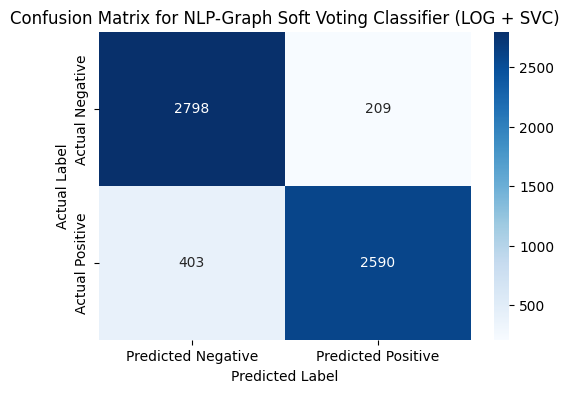

In [30]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2798,209],[403,2590]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph Soft Voting Classifier (LOG + SVC)")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [31]:
voting_clf_gnb_rf_hard.fit(X_train,y_train)
y_pred=voting_clf_gnb_rf_hard.predict(X_test)

accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Accuracy: 0.8653366583541147
Precision: 0.9147727272727273
Recall: 0.805
F1 Score: 0.8563829787234043

Confusion Matrix:
[[2783  224]
 [ 583 2410]]
 


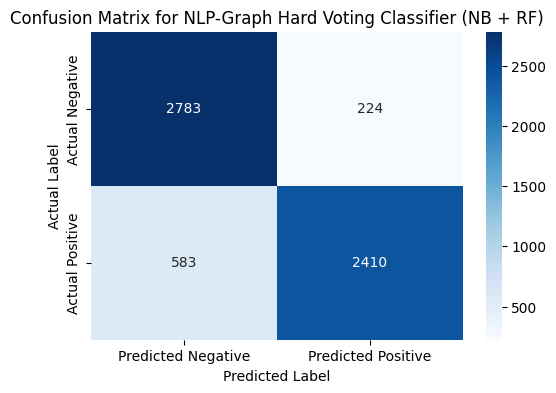

In [32]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2783,224],[583,2410]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph Hard Voting Classifier (NB + RF)")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [33]:
voting_clf_gnb_rf_soft.fit(X_train,y_train)
y_pred=voting_clf_gnb_rf_soft.predict(X_test)

accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Accuracy: 0.8728179551122195
Precision: 0.8860103626943006
Recall: 0.855
F1 Score: 0.8702290076335878

Confusion Matrix:
[[2678  329]
 [ 433 2560]]
 


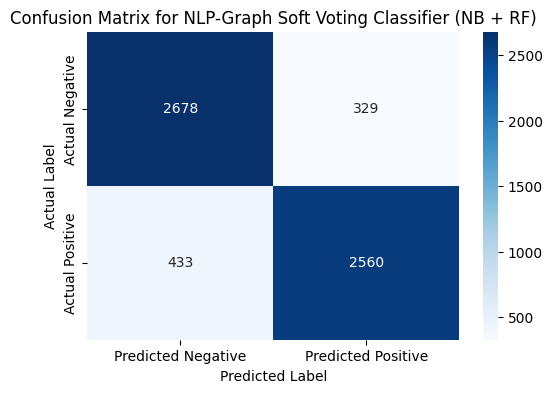

In [34]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2678,329],[433,2560]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph Soft Voting Classifier (NB + RF)")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [35]:
stacking_clf_gb.fit(X_train,y_train)
y_pred=stacking_clf_gb.predict(X_test)

accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Accuracy: 0.8977556109725686
Precision: 0.9297297297297298
Recall: 0.86
F1 Score: 0.8935064935064935

Confusion Matrix:
[[2812  194]
 [ 418 2576]]
 


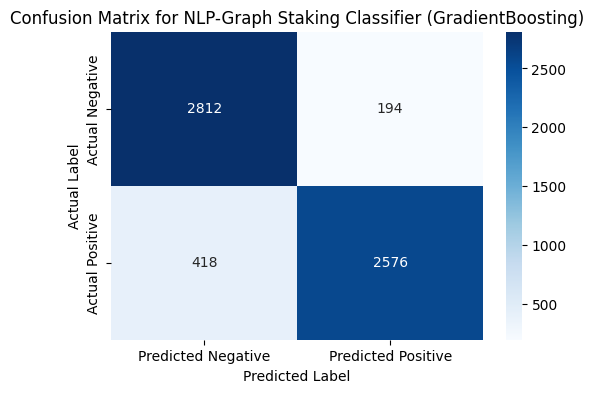

In [37]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2812,194],[418,2576]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph Staking Classifier (GradientBoosting)")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [38]:
stacking_clf_log.fit(X_train,y_train)
y_pred=stacking_clf_log.predict(X_test)

accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Accuracy: 0.8977556109725686
Precision: 0.9251336898395722
Recall: 0.865
F1 Score: 0.8940568475452197

Confusion Matrix:
[[2798  209]
 [ 403 2590]]
 


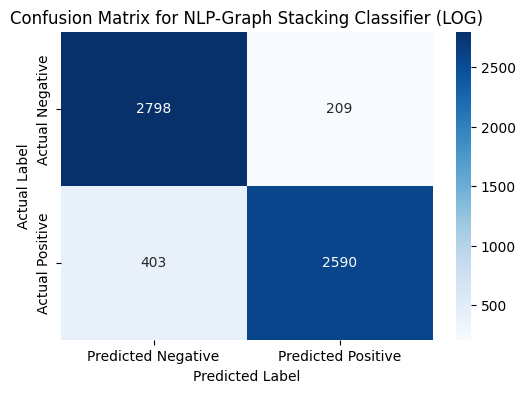

In [41]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2798,209],[403,2590]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph Stacking Classifier (LOG)")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [42]:
stacking_clf_svc.fit(X_train,y_train)
y_pred=stacking_clf_svc.predict(X_test)

accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Accuracy: 0.8952618453865336
Precision: 0.9247311827956989
Recall: 0.86
F1 Score: 0.8911917098445595

Confusion Matrix:
[[2798  209]
 [ 418 2575]]
 


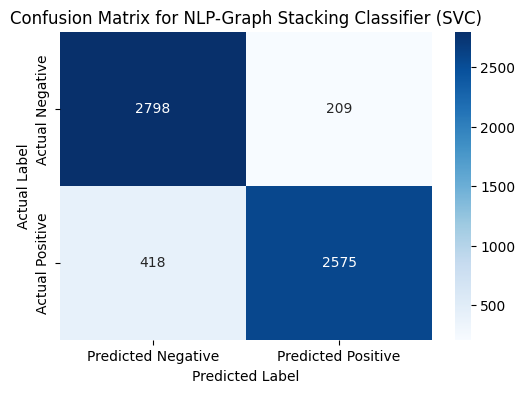

In [43]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2798,209],[418,2575]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph Stacking Classifier (SVC)")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [44]:
stacking_clf_gnb.fit(X_train,y_train)
y_pred=stacking_clf_gnb.predict(X_test)

accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Accuracy: 0.8977556109725686
Precision: 0.9206349206349206
Recall: 0.87
F1 Score: 0.8946015424164524

Confusion Matrix:
[[2783  224]
 [ 389 2604]]


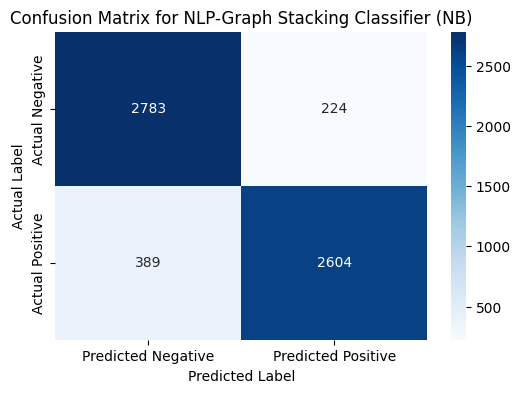

In [45]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2783,224],[389,2604]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph Stacking Classifier (NB)")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()

In [46]:
stacking_clf_rf.fit(X_train,y_train)
y_pred=stacking_clf_rf.predict(X_test)

accuracy=accuracy_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
conf_matrix=confusion_matrix(y_test,y_pred)

print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)
print("\nConfusion Matrix:\n",conf_matrix)

Accuracy: 0.8902743142144638
Precision: 0.9193548387096774
Recall: 0.855
F1 Score: 0.8860103626943004

Confusion Matrix:
[[2783  224]
 [ 433 2560]]
 


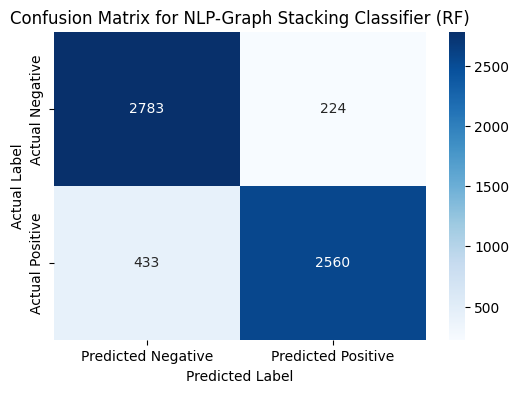

In [47]:
plt.figure(figsize=(6,4))
sns.heatmap(
    np.array([[2783,224],[433,2560]]),
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Predicted Negative","Predicted Positive"],
    yticklabels=["Actual Negative","Actual Positive"],
    cbar=True,
)
plt.title(f"Confusion Matrix for NLP-Graph Stacking Classifier (RF)")
plt.xlabel("Predicted Label")
plt.ylabel("Actual Label")
plt.show()